***
# <span style='color:Blue'> Pneumonia Detection from X-ray Images</span>
***

### <span style='color:red'>Note:</span>
- Due to computational constraints (limted RAM and processor), the notebook session was restarted multiple times.
- Thus analyses were performed in batches and the intermittent pickel files of object and models were saved and reused as needed
- Hence the numbering of executed cells are not in order

#### <span style='color:Blue'>Import the required packages</span>

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import pydicom as dicom
from pydicom import dcmread
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
%matplotlib inline
from zipfile import ZipFile
import os
import sys
import glob
import plotly.express as px
from PIL import Image
import cv2
import random
import warnings
warnings.filterwarnings("ignore")
import pickle 
from tqdm import tqdm
import gc
import random

## scikit-learn libraries
from sklearn import preprocessing
from sklearn.model_selection  import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score, auc, roc_curve, precision_recall_curve, average_precision_score
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder, LabelBinarizer

## Tensorflow and keras libraries
import tensorflow as tf
from tensorflow.keras import backend
from tensorflow.keras.models import Sequential
from tensorflow.keras import optimizers
from tensorflow import keras 
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Input, Convolution2D,  Conv2D, Dropout, Dense, Flatten, BatchNormalization, Concatenate, MaxPooling2D, Activation, Dropout, UpSampling2D, concatenate, Reshape, Conv2DTranspose, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import ResNet50, VGG16, MobileNet
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.backend import log, epsilon
from kerastuner.tuners import Hyperband
from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow import reduce_sum
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.applications.mobilenet import MobileNet, preprocess_input


import pybboxes as pbx
from ultralytics import YOLO
import pickle

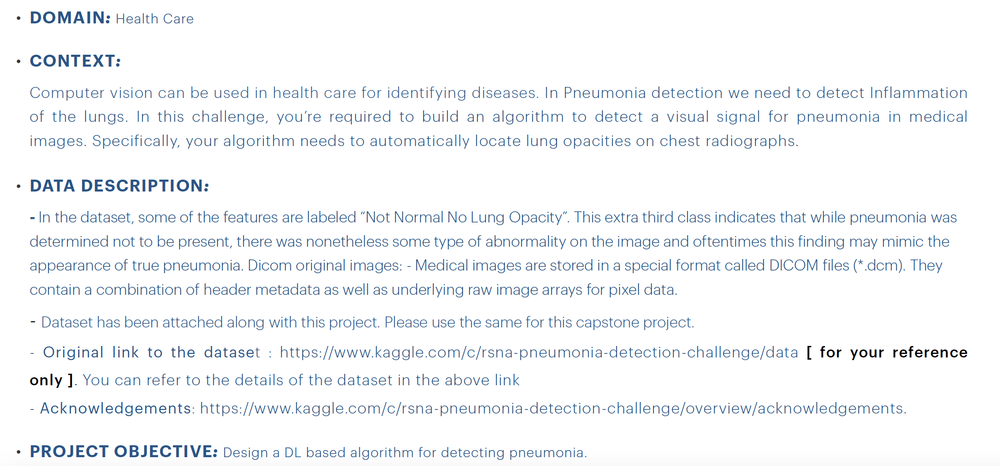

### Import the data

In [2]:
#Read the train dataset labels
train_annot = pd.read_csv("stage_2_train_labels.csv")

In [3]:
#check the head of the dataframe
train_annot.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [4]:
#check for null values and data type in the dataframe.
train_annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB


In [5]:
#confirming the presence of Null/NaN values in the dataframe
train_annot[train_annot['Target']==0].head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
6,00569f44-917d-4c86-a842-81832af98c30,NaN,NaN,NaN,NaN,0


In [6]:
#Replace NaN values with 0
train_annot.fillna(0, inplace=True)
train_annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          30227 non-null  float64
 2   y          30227 non-null  float64
 3   width      30227 non-null  float64
 4   height     30227 non-null  float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB


In [7]:
#Count of annotation information for each of the target types.
print("count of the annotation information with target=1:", len(train_annot[train_annot['Target']==1]))
print("count of the annotation information with target=0:", len(train_annot[train_annot['Target']==0]))

count of the annotation information with target=1: 9555
count of the annotation information with target=0: 20672


In [8]:
#Check if there are any duplicate patientIds in the annotation
train_annot['patientId'].value_counts()

patientId
3239951b-6211-4290-b237-3d9ad17176db    4
31764d54-ea3b-434f-bae2-8c579ed13799    4
1c44e0a4-4612-438f-9a83-8d5bf919cb67    4
8dc8e54b-5b05-4dac-80b9-fa48878621e2    4
349f10b4-dc3e-4f3f-b2e4-a5b81448ce87    4
                                       ..
7233ab9f-7fa6-4b5b-acdc-1c93bf945db5    1
722cca4a-f542-47ba-be14-29238c1124e1    1
722ad9c3-919a-4c08-bb67-cafd603ba754    1
7228bf11-3ce7-47f5-bee3-d36325df1dc8    1
943b27f1-ba1c-415b-b738-7b52aefa445b    1
Name: count, Length: 26684, dtype: int64

**Observation**
- The above information tells us that there are duplicate patient ids in the annotation file.

In [9]:
#Check for one duplicate patientId annotation details
train_annot[train_annot['patientId']=="3239951b-6211-4290-b237-3d9ad17176db"]

,patientId,x,y,width,height,Target
2487,3239951b-6211-4290-b237-3d9ad17176db,511.0,249.0,188.0,232.0,1
2488,3239951b-6211-4290-b237-3d9ad17176db,558.0,649.0,174.0,186.0,1
2489,3239951b-6211-4290-b237-3d9ad17176db,152.0,661.0,191.0,145.0,1
2490,3239951b-6211-4290-b237-3d9ad17176db,198.0,370.0,204.0,205.0,1


**Observation**
- It is noticed that the annotations associated with the same patient id are different. 
- This suggests that there are multiple bounding boxes in an X-ray (CR) scan of the patient.
- These multiple records for the same patient thus should not be removed.

In [10]:
#Read the classes in the training set
train_class_labels = pd.read_csv("stage_2_detailed_class_info.csv")

In [11]:
#check the shape
train_class_labels.shape

(30227, 2)

In [12]:
#check the head of the dataframe 
train_class_labels.head()

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


In [13]:
#Check for duplicates
train_class_labels.duplicated().sum()

3543

In [14]:
#check the count of different classes in the dataframe. 
train_class_labels['class'].value_counts()

class
No Lung Opacity / Not Normal    11821
Lung Opacity                     9555
Normal                           8851
Name: count, dtype: int64

In [15]:
#removal of the exactly duplicate rows
train_class_labels = train_class_labels.drop_duplicates('patientId').reset_index(drop=True)

In [16]:
len(train_class_labels)

26684

In [17]:
#Import the test image submission.csv file
test_data_sub = pd.read_csv("stage_2_sample_submission.csv")

In [18]:
#Check the head
test_data_sub.head()

,patientId,PredictionString
0,0000a175-0e68-4ca4-b1af-167204a7e0bc,0.5 0 0 100 100
1,0005d3cc-3c3f-40b9-93c3-46231c3eb813,0.5 0 0 100 100
2,000686d7-f4fc-448d-97a0-44fa9c5d3aa6,0.5 0 0 100 100
3,000e3a7d-c0ca-4349-bb26-5af2d8993c3d,0.5 0 0 100 100
4,00100a24-854d-423d-a092-edcf6179e061,0.5 0 0 100 100


**Note**
- The `PredictionString` column does not display the actual bounding box coordinates. This is retained as a placeholder.
- The actual bounding boxes will be predicted as part of `Milestone 2`

In [19]:
#check the number of records in the test dataset
len(test_data_sub)

3000

In [20]:
#check for any duplicate images in the dataset
test_data_sub.duplicated().sum()

0

### Import the paths train and the test images

In [21]:
#Getting the image list
train_images = 'stage_2_train_images/'
test_images = 'stage_2_test_images/'

#Fectching the image path
train_path = glob.glob(os.path.join(train_images,'*dcm'))
test_path = glob.glob(os.path.join(test_images,'*dcm'))

In [22]:
len(train_path), len(test_path), 

(26684, 3000)

In [23]:
# Function to capture the original image path and return its pixel matrix. This will be used downstream as needed. 
def getOriginalImagePixelArray(imagepath):
    return dicom.dcmread(imagepath).pixel_array

In [24]:
getOriginalImagePixelArray(train_path[0])

array([[105,   3,   0, ...,   0,   0,   0],
       [102,   1,   0, ...,   0,   0,   0],
       [ 97,   0,   0, ...,   0,   0,   0],
       ...,
       [  1,   1,   1, ..., 147, 170,  69],
       [  1,   1,   1, ..., 141, 165,  68],
       [  1,   1,   1, ..., 138, 161,  67]], dtype=uint8)

In [25]:
# Check the shape of 1 train input image
getOriginalImagePixelArray(train_path[0]).shape

(1024, 1024)

In [26]:
getOriginalImagePixelArray(test_path[0])

array([[124, 106,  91, ..., 140, 145, 152],
       [103,  87,  75, ..., 107, 112, 119],
       [ 83,  69,  59, ...,  84,  89,  95],
       ...,
       [  8,   8,   8, ...,   0,   0,   0],
       [  8,   8,   8, ...,   0,   0,   0],
       [  8,   8,   8, ...,   0,   0,   0]], dtype=uint8)

In [27]:
# Check the shape of 1 test input image
getOriginalImagePixelArray(test_path[0]).shape

(1024, 1024)

**Observations:**
- In this section, we imported all the data w.r.t. the following,
    - the DICOM (CR) scan images for all the patients with file paths and class labels
    - bounding box coordinates for the CR scans of patients
- A custom function, `getOriginalImagePixelArray()` is defined, which will return the pixel array for the DICOM image using the file path. This function will be used in subsequent parts of the project as and when needed.
- We checked the shape of one train and the test image and the matrix size is 1024*1024.
- At a primary look, we observe that data is highly imbalanced for pneumonia(Lung Opacity) vs other classes
- We will be performing in-depth exploratory data analysis (EDA) in the following sections to derive more insights from the data.

## Step 2: Map training and testing images to its classes

**Note**
- We are `not provided` with the class labels of the test dataset. We will create a data frame for the `test data` file path as part of this question. The class prediction of the test data will be done as part of `Step 6`.
- In the absence of test data set with actual class labels, we will `split the training dataset` into train and validation sets in the Step 3 and will then associate to its corresponding classes and annotation information

In [28]:
# Create a dataframe to map train images to class
train_master_class = pd.DataFrame({
    'filename': train_path 
})

In [29]:
train_master_class['patientId'] = [ os.path.basename(filepath).split(".")[0] for filepath in train_master_class['filename']]

In [30]:
# Map classes to images
train_master_class = pd.merge(train_master_class, train_class_labels, on='patientId', how='left')

In [31]:
train_master_class.head()

,filename,patientId,class
0,stage_2_train_images/7be6b4de-afe9-43c0-a581-0...,7be6b4de-afe9-43c0-a581-0f49608c8976,Normal
1,stage_2_train_images/2dcdd159-2889-48d3-a0ce-5...,2dcdd159-2889-48d3-a0ce-5c7b1086c49d,Normal
2,stage_2_train_images/d8e66874-305e-4c80-9b75-5...,d8e66874-305e-4c80-9b75-5e764eb718ff,No Lung Opacity / Not Normal
3,stage_2_train_images/22f2d3ec-f7ea-4778-850d-b...,22f2d3ec-f7ea-4778-850d-bb111590202f,Lung Opacity
4,stage_2_train_images/cdaa07d4-4234-4cd2-b9bf-a...,cdaa07d4-4234-4cd2-b9bf-abbf5aed1bb4,Normal


In [32]:
classCounts = train_master_class['class'].value_counts().to_frame().reset_index()
classCounts

,class,count
0,No Lung Opacity / Not Normal,11821
1,Normal,8851
2,Lung Opacity,6012


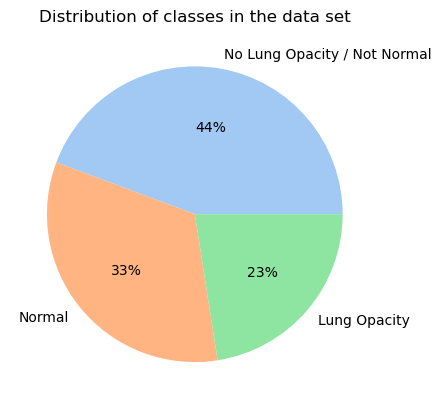

In [33]:
#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]
#create pie chart
plt.pie(classCounts['count'], labels = classCounts['class'], colors = colors, autopct='%.0f%%')
plt.title("Distribution of classes in the data set")
plt.show()

**Observations**
- It can be clearly seen from the pie chart that data is highly imbalanced for pneumonia (i.e. Lung Opacity) Vs other classes (i.e. Normal and No Lung Opacity / Not Normal)

In [34]:
# Create a dataframe to store test images
test_data = pd.DataFrame({
    'filename': test_path 
})

In [35]:
test_data['patientId'] = [ os.path.basename(filepath).split(".")[0] for filepath in test_data['filename']]

In [36]:
test_data_sub = pd.merge(test_data, test_data_sub, on="patientId", how="left")

In [37]:
test_data_sub.head()

,filename,patientId,PredictionString
0,stage_2_test_images/2392af63-9496-4e72-b348-92...,2392af63-9496-4e72-b348-9276432fd797,0.5 0 0 100 100
1,stage_2_test_images/2ce40417-1531-4101-be24-e8...,2ce40417-1531-4101-be24-e85416c812cc,0.5 0 0 100 100
2,stage_2_test_images/2bc0fd91-931a-446f-becb-7a...,2bc0fd91-931a-446f-becb-7a6d3f2a7678,0.5 0 0 100 100
3,stage_2_test_images/29d42f45-5046-4112-87fa-18...,29d42f45-5046-4112-87fa-18ea6ea97e75,0.5 0 0 100 100
4,stage_2_test_images/208e3daf-18cb-4bf7-8325-0a...,208e3daf-18cb-4bf7-8325-0acf318ed62c,0.5 0 0 100 100


## Step 3: Map training images to its annotations

We will annotate each CR scan image with the following annotations,
- Bounding boxes
- Target labels as follows,
    - 1: Lung Opacity
    - 0: Normal or No Lung Opacity / Not Normal

### Mapping the train images to its annotations

In [38]:
# A function to obtain a list of dictionaries for individual bounding boxes for each image ID
def getboundingBox(imageid, train_df):
    boxList = []
    #print(imageid)
    tmpDf = train_df[train_df['patientId']== imageid]
    for index, row in tmpDf.iterrows():
        boxList.append({
            'x' : row['x'],
            'y' : row['y'],
            'width' : row['width'],
            'height' : row['height']
        })
    return boxList

In [39]:
train_master_class['bounding_box'] = [getboundingBox(i, train_annot) for i in train_master_class['patientId']]

In [40]:
train_master_class = pd.merge(train_master_class, train_annot[['patientId', 'Target']].drop_duplicates(), on='patientId', how='left')

In [41]:
train_master_class.head()

,filename,patientId,class,bounding_box,Target
0,stage_2_train_images/7be6b4de-afe9-43c0-a581-0...,7be6b4de-afe9-43c0-a581-0f49608c8976,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
1,stage_2_train_images/2dcdd159-2889-48d3-a0ce-5...,2dcdd159-2889-48d3-a0ce-5c7b1086c49d,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
2,stage_2_train_images/d8e66874-305e-4c80-9b75-5...,d8e66874-305e-4c80-9b75-5e764eb718ff,No Lung Opacity / Not Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
3,stage_2_train_images/22f2d3ec-f7ea-4778-850d-b...,22f2d3ec-f7ea-4778-850d-bb111590202f,Lung Opacity,"[{'x': 213.0, 'y': 321.0, 'width': 169.0, 'hei...",1
4,stage_2_train_images/cdaa07d4-4234-4cd2-b9bf-a...,cdaa07d4-4234-4cd2-b9bf-abbf5aed1bb4,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0


### Split the training dataset into Training and Validation sets

In [42]:
X = train_master_class[['filename']]
y = train_master_class[['Target']]

In [43]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

### Mapping train split images to its corresponding classes and annotation

In [44]:
X_train_map = train_master_class[train_master_class['filename'].isin(X_train['filename'])]

In [45]:
X_train_map.head()

,filename,patientId,class,bounding_box,Target
0,stage_2_train_images/7be6b4de-afe9-43c0-a581-0...,7be6b4de-afe9-43c0-a581-0f49608c8976,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
1,stage_2_train_images/2dcdd159-2889-48d3-a0ce-5...,2dcdd159-2889-48d3-a0ce-5c7b1086c49d,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
2,stage_2_train_images/d8e66874-305e-4c80-9b75-5...,d8e66874-305e-4c80-9b75-5e764eb718ff,No Lung Opacity / Not Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
3,stage_2_train_images/22f2d3ec-f7ea-4778-850d-b...,22f2d3ec-f7ea-4778-850d-bb111590202f,Lung Opacity,"[{'x': 213.0, 'y': 321.0, 'width': 169.0, 'hei...",1
4,stage_2_train_images/cdaa07d4-4234-4cd2-b9bf-a...,cdaa07d4-4234-4cd2-b9bf-abbf5aed1bb4,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0


### Mapping validation split images to its corresponding classes and annotation

In [46]:
X_val_map = train_master_class[train_master_class['filename'].isin(X_val['filename'])]

In [47]:
X_val_map.head()

,filename,patientId,class,bounding_box,Target
12,stage_2_train_images/79cb4053-b062-4be9-8922-9...,79cb4053-b062-4be9-8922-9585b170d8fc,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
14,stage_2_train_images/19d2c68d-abe7-4575-9ee5-d...,19d2c68d-abe7-4575-9ee5-d84b9ff656be,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
16,stage_2_train_images/fa2d2cf7-acfc-4c2a-a231-9...,fa2d2cf7-acfc-4c2a-a231-9e60abcf5d66,No Lung Opacity / Not Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
19,stage_2_train_images/e6722c12-2875-4795-b377-b...,e6722c12-2875-4795-b377-badc4514d224,No Lung Opacity / Not Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0
25,stage_2_train_images/af59f4a2-32d4-4888-ac7f-f...,af59f4a2-32d4-4888-ac7f-fc0bcc23abd2,Lung Opacity,"[{'x': 315.0, 'y': 571.0, 'width': 167.0, 'hei...",1


## Exploratory Data Analysis on the Image Metadata

In [48]:
#Check the meta data section of 1 image
dicom.read_file(train_master_class['filename'][0])

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.27517.1517874478.933234
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.27517.1517874478.933234
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

In [49]:
# Created an empty list to append the values of the metadata for the study 
pid = []
sex = []
age = []
pExam = []
view =[]
modality = []
cType = []
for ind in train_master_class['filename']:
    medical_image = dicom.read_file(ind)
    pid.append(medical_image['PatientID'].value)
    sex.append(medical_image['PatientSex'].value)
    age.append(medical_image['PatientAge'].value)
    pExam.append(medical_image['BodyPartExamined'].value)
    view.append(medical_image['ViewPosition'].value)
    modality.append(medical_image['Modality'].value)
    cType.append(medical_image['ConversionType'].value)

In [50]:
# Dictionary to store the Metadata key-value information
metadataP = pd.DataFrame({
    'patientId' : pid,
    'sex' : sex,
    'age': age,
    'partExamined': pExam,
    'view': view,
    'modality': modality,
    'cType' : cType
})

In [51]:
metadataP.head()

,patientId,sex,age,partExamined,view,modality,cType
0,7be6b4de-afe9-43c0-a581-0f49608c8976,F,35,CHEST,PA,CR,WSD
1,2dcdd159-2889-48d3-a0ce-5c7b1086c49d,F,54,CHEST,PA,CR,WSD
2,d8e66874-305e-4c80-9b75-5e764eb718ff,M,68,CHEST,AP,CR,WSD
3,22f2d3ec-f7ea-4778-850d-bb111590202f,F,70,CHEST,PA,CR,WSD
4,cdaa07d4-4234-4cd2-b9bf-abbf5aed1bb4,M,56,CHEST,AP,CR,WSD


### Mapping the `train_master_class` information to its corresponding `Metadata`

In [52]:
train_master_class_metadata = pd.merge(train_master_class,metadataP, on="patientId", how='left')

In [53]:
train_master_class_metadata.head()

,filename,patientId,class,bounding_box,Target,sex,age,partExamined,view,modality,cType
0,stage_2_train_images/7be6b4de-afe9-43c0-a581-0...,7be6b4de-afe9-43c0-a581-0f49608c8976,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,F,35,CHEST,PA,CR,WSD
1,stage_2_train_images/2dcdd159-2889-48d3-a0ce-5...,2dcdd159-2889-48d3-a0ce-5c7b1086c49d,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,F,54,CHEST,PA,CR,WSD
2,stage_2_train_images/d8e66874-305e-4c80-9b75-5...,d8e66874-305e-4c80-9b75-5e764eb718ff,No Lung Opacity / Not Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,M,68,CHEST,AP,CR,WSD
3,stage_2_train_images/22f2d3ec-f7ea-4778-850d-b...,22f2d3ec-f7ea-4778-850d-bb111590202f,Lung Opacity,"[{'x': 213.0, 'y': 321.0, 'width': 169.0, 'hei...",1,F,70,CHEST,PA,CR,WSD
4,stage_2_train_images/cdaa07d4-4234-4cd2-b9bf-a...,cdaa07d4-4234-4cd2-b9bf-abbf5aed1bb4,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,M,56,CHEST,AP,CR,WSD


### Analyse the training metadata information

In [54]:
#Check the column info and the data types
train_master_class_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26684 entries, 0 to 26683
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   filename      26684 non-null  object
 1   patientId     26684 non-null  object
 2   class         26684 non-null  object
 3   bounding_box  26684 non-null  object
 4   Target        26684 non-null  int64 
 5   sex           26684 non-null  object
 6   age           26684 non-null  object
 7   partExamined  26684 non-null  object
 8   view          26684 non-null  object
 9   modality      26684 non-null  object
 10  cType         26684 non-null  object
dtypes: int64(1), object(10)
memory usage: 2.2+ MB


In [55]:
#Convert the age datatype to integer
train_master_class_metadata['age'] = train_master_class_metadata['age'].astype(str).astype(int)

In [56]:
#Check if the train data has any other parts apart from chest
train_master_class_metadata['partExamined'].value_counts()

partExamined
CHEST    26684
Name: count, dtype: int64

In [57]:
#Check the modality of the train dataset
train_master_class_metadata['modality'].value_counts()

modality
CR    26684
Name: count, dtype: int64

In [58]:
#Check the conversion type of the train dataset
train_master_class_metadata['cType'].value_counts()

cType
WSD    26684
Name: count, dtype: int64

In [59]:
#Check the image view of the train dataset
train_master_class_metadata['view'].value_counts()

view
PA    14511
AP    12173
Name: count, dtype: int64

**Observations**
- The above results confirm that all the train_master_class_metadata (train/val) images are examined only on their `chest` using Computed Radiography (CR) technique.
- `All the images` are captured from the WorkStation(WSD). This describes the kind of image conversion based on the modality.
- It is also observed that images are captured either in PA(Posterior-Anterior) or AP(Anterior-Posterior) view.

### Check the age distribution of the patients w.r.t their gender

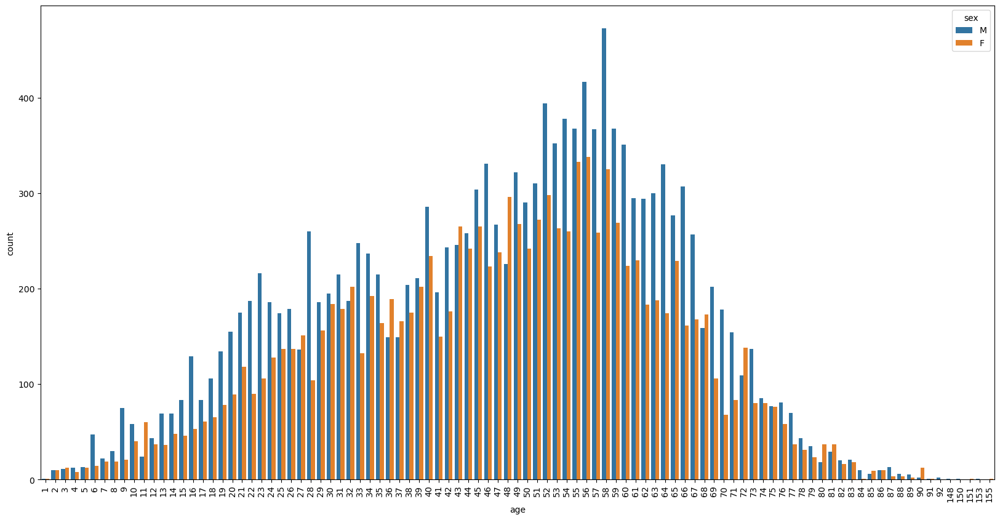

In [60]:
plt.figure(figsize=(20,10))
sns.countplot(data=train_master_class_metadata.sort_values("age"), x="age", hue='sex', dodge = True)
plt.xticks(rotation=90)
plt.show()

**Observation**
- From the above count plot it is noticed that a few of the patients have age >140 and those could be some incorrectly registered entries.
- From the above image we could clearly see that there are more male patients compared to the female.
- Overall the distribution of male and female patients looks similar.

In [61]:
def drawgraphs(data_file, columns, hue = False, width = 15, showdistribution = True):
  if (hue):
    print('Creating graph for: {} and {}'.format(columns, hue))
  else:
    print('Creating graph for : {}'.format(columns))
  length = len(columns) * 6
  total = float(len(data_file))

  fig, axes = plt.subplots(nrows = len(columns) if len(columns) > 1 else 1, ncols = 1, figsize = (width, length))
  for index, content in enumerate(columns):
    plt.title(content)

    currentaxes = 0
    if (len(columns) > 1):
      currentaxes = axes[index]
    else:
      currentaxes = axes

    if (hue):
      sns.countplot(x = columns[index], data = data_file, ax = currentaxes, hue = hue)
    else:
      sns.countplot(x = columns[index], data = data_file, ax = currentaxes)

    if(showdistribution):
      for p in (currentaxes.patches):
        height = p.get_height()
        if (height > 0 and total > 0):
          currentaxes.text(p.get_x() + p.get_width()/2., height + 3, '{:1.2f}%'.format(100*height/total), ha = "center")

### Check the percentage of age distribution of patients

In [62]:
data_patient_age=pd.DataFrame()
data_patient_age['Age group']=list(train_master_class_metadata['age'].value_counts().keys())
data_patient_age['No. of people']=list(train_master_class_metadata['age'].value_counts().values)
data_patient_age['% of people']=[round((x/train_master_class_metadata.shape[0])*100,2) for x in train_master_class_metadata['age'].value_counts().values]

In [63]:
data_patient_age['% of people']=data_patient_age['% of people'].apply(lambda x:str(x))
data_patient_age['% of people']=data_patient_age['% of people'].apply(lambda x:x+"%")

In [64]:
data_patient_age.head(5)

,Age group,No. of people,% of people
0,58,798,2.99%
1,56,755,2.83%
2,55,701,2.63%
3,52,692,2.59%
4,54,638,2.39%


Creating graph for : ['age']


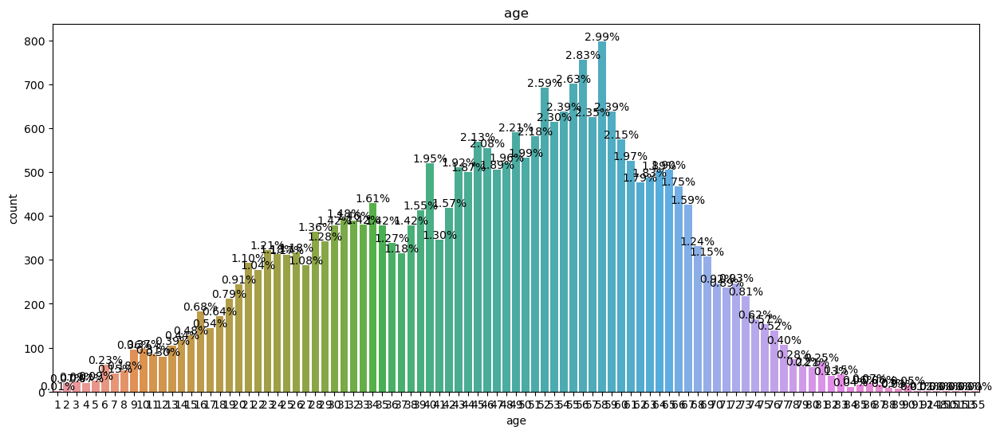

In [65]:
drawgraphs(data_file=train_master_class_metadata,columns=['age'],showdistribution=True)

**Observations**
- From the above plot it is seen that around 13% of the patients are in the age group between 55 to 60 years.
- Also a maximum of up to ~3% of patients in age group 58 years report to show pneumonia.

### Check the percentage of age distribution in each bin

In [66]:
bins = np.linspace(0, 100, 11)
train_master_class_metadata['PatientAgeBins'] = pd.cut(train_master_class_metadata['age'], bins)
train_master_class_metadata['PatientAgeBins'].value_counts()

PatientAgeBins
(50.0, 60.0]     6619
(40.0, 50.0]     5048
(60.0, 70.0]     4279
(30.0, 40.0]     3936
(20.0, 30.0]     3205
(10.0, 20.0]     1468
(70.0, 80.0]     1452
(0.0, 10.0]       435
(80.0, 90.0]      233
(90.0, 100.0]       4
Name: count, dtype: int64

Creating graph for : ['PatientAgeBins']


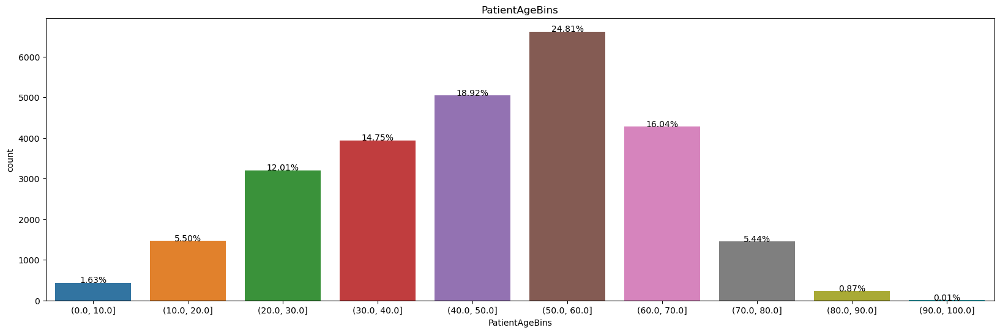

In [67]:
drawgraphs(data_file = train_master_class_metadata, columns = ['PatientAgeBins'], width = 20, showdistribution = True)

**Observations**
- From the above plot is clearly seen that ~25% of the patients are within the age group of 50-60 years followed by age group 40-50 years with ~19% patients.
- Considering  maximum survival year up to 80 years, age group under 10 reports less number of Pneumonia cases.

### Boxplot showing patients age w.r.t different classes and gender

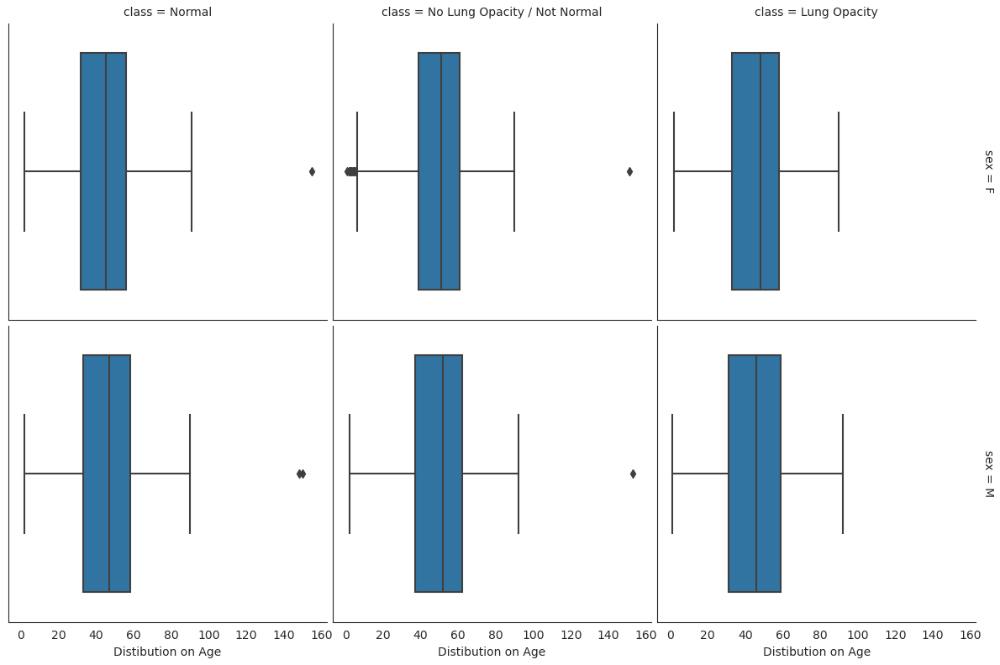

In [68]:
with sns.axes_style("white"):
    g = sns.FacetGrid(train_master_class_metadata, row="sex", col="class", margin_titles=True, height=4)
g.map(sns.boxplot, "age")
g.set_axis_labels("Distibution on Age")
g.figure.subplots_adjust(wspace=.02, hspace=.02)

**Observation**
- It is observed from the above box plot that the outlier with the age group (~150 years) does not belong to Lung opacity class.  
- Also the overall median age group of patients is around ~35 to ~65 years.

### Histogram displaying the count of patients w.r.t different classes and gender

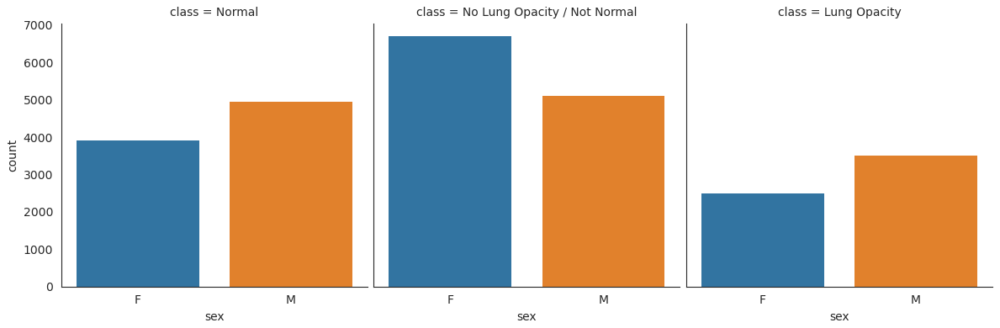

In [69]:
with sns.axes_style("white"):
    g = sns.FacetGrid(train_master_class_metadata, col="class", height=4)
g.map_dataframe(sns.countplot, x = "sex", palette = 'tab10')
g.figure.subplots_adjust(wspace=.02, hspace=.02)
plt.show()

**Observations**
- The count of female and male patients in the `Normal` class is 3905 and 4946 respectively.
- `No Lung Opacity/ Not Normal` class has more female patients (6710) compared to males (5111).
- `Lung Opacity` class has more male patients (3510) compared to females(2502)
- Overall the training dataset has more male patients (15166) compared to female patients (i.e 11518)

### Boxplot of the ages over types of CR image view and genders

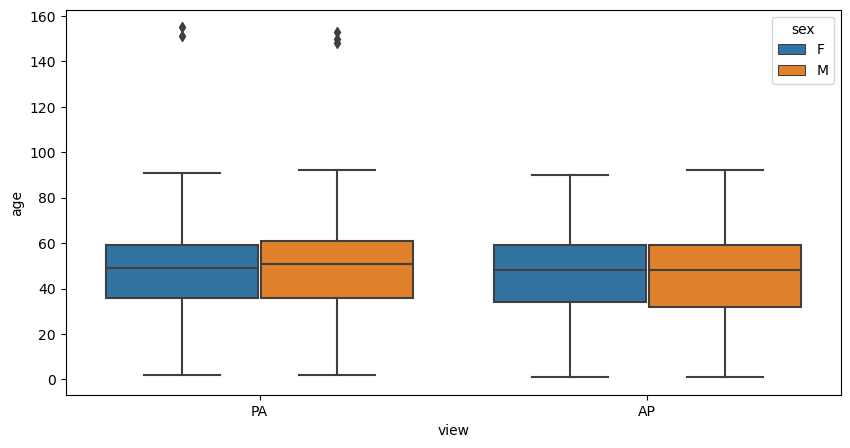

In [70]:
plt.figure(figsize=(10,5))
sns.boxplot(data=train_master_class_metadata, x="view", y="age", hue="sex")
plt.show()

**Observations**
- The outliers (patients with age > 140) are only seen in the Posterior/Anterior(PA) view images.
- The median age of the patients w.r.t either of the genders is similar (~50) for the images taken in both PA and AP views.

### Count plot showing image views w.r.t gender in different classes

<Figure size 1000x1000 with 0 Axes>

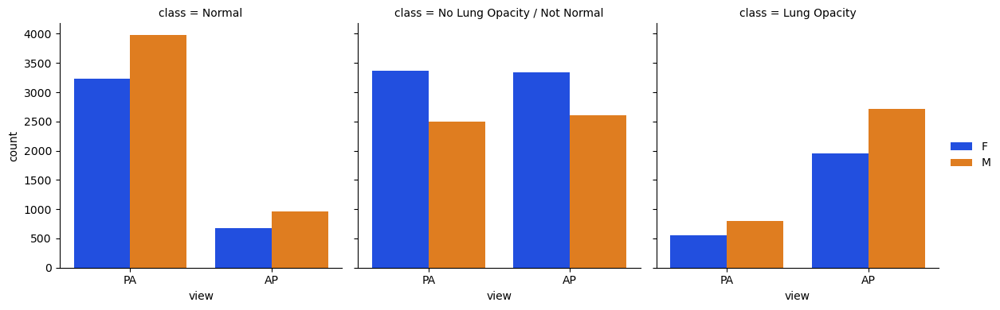

In [71]:
plt.figure(figsize=(10,10))
g = sns.FacetGrid(train_master_class_metadata, col="class", height=4)
g.map_dataframe(sns.countplot, "view", hue="sex", palette='bright').add_legend()
plt.show()

**Observations**

- The `Normal patients` have maximum images captured in `PA view compared to AP view`.
- No Lung Opacity/Not Normal scenario `does not show` much difference either w.r.t image views or gender.
- However, the patients reported with `Lung Opacity` have `more images` captured in `AP view compared to PA view`.

### Explore data w.r.t the Target groups(Pneumonia Present Vs Absent)

In [72]:
# subset dataset w.r.t the targets
train_master_class_metadata_1 = train_master_class_metadata.loc[train_master_class_metadata['Target'] == 1]
train_master_class_metadata_0 = train_master_class_metadata.loc[train_master_class_metadata['Target'] == 0]

### Histogram with marginal box-plot for patients with Pneumonia

In [73]:
px.histogram(data_frame=train_master_class_metadata_1, x='age', marginal="box", nbins=100, color='sex', facet_col='view')

### Histogram with marginal box-plot for patients without Pneumonia

In [74]:
px.histogram(data_frame=train_master_class_metadata_0, x='age', marginal="box", nbins=100, color='sex', facet_col='view')

**Observations**
- It is observed from both the patient groups (with or without penumonia), that there is not much difference in the median age group of patients with images views from both PA and AP.
- The age distribution plot for `patients with Pneumonia`, shows `majority images` captured in the `AP view` compared to the PA view.
-  Conversely, the age distribution plot for `patients without Pneumonia`, shows `majority images` captured in the `PA view` compared to the AP view.

### Distribution of Centers of Lung Opacity Rectangles in Pneumonia detected patients

In [75]:
#Subset the training dataset with Target=1
train_annot_1 = train_annot[train_annot['Target']==1]

In [76]:
#calculate the center of the bounding box coordinates. 
#The x,y center is calculated as (x1+x2)/2 and (y1+y2)/2. In this case x2 = x1+width and y2 = y1+height
train_annot_1['Xc'] = (train_annot_1['x'] + (train_annot_1['x'] + train_annot_1['width']))/2
train_annot_1['Yc'] = (train_annot_1['y'] + (train_annot_1['y'] + train_annot_1['height']))/2

In [77]:
#Annotate the Xc, Yc coordinate center to its training metadata having target=1
train_annot_1_meta = pd.merge(train_annot_1, train_master_class_metadata_1[['filename', 'patientId', 'class', 'sex',
       'age', 'partExamined', 'view']], on='patientId', how='left')

In [78]:
#check the head 
train_annot_1_meta.head()

,patientId,x,y,width,height,Target,Xc,Yc,filename,class,sex,age,partExamined,view
0,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,370.5,341.5,stage_2_train_images/00436515-870c-4b36-a041-d...,Lung Opacity,F,32,CHEST,AP
1,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1,690.0,378.5,stage_2_train_images/00436515-870c-4b36-a041-d...,Lung Opacity,F,32,CHEST,AP
2,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1,403.0,629.0,stage_2_train_images/00704310-78a8-4b38-8475-4...,Lung Opacity,M,75,CHEST,PA
3,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1,776.0,643.5,stage_2_train_images/00704310-78a8-4b38-8475-4...,Lung Opacity,M,75,CHEST,PA
4,00aecb01-a116-45a2-956c-08d2fa55433f,288.0,322.0,94.0,135.0,1,335.0,389.5,stage_2_train_images/00aecb01-a116-45a2-956c-0...,Lung Opacity,F,6,CHEST,AP


In [79]:
#print the count for AP and PA image view images with target=1 
print("the count of the annotation information for target=1 in PA view is", len(train_annot_1_meta[train_annot_1_meta['view']=='PA']))
print("the count of the annotation information for target=1 in AP view is", len(train_annot_1_meta[train_annot_1_meta['view']=='AP']))

the count of the annotation information for target=1 in PA view is 1767
the count of the annotation information for target=1 in AP view is 7788


### Scatter plot to show the distribution of the Lung opacity centers in both AP and PA view

In [80]:
def plot_window(data1, data2, color_point, color_window, text1, text2):
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
    data1.plot.scatter(x='Xc', y='Yc', xlim=(0,1024), ylim=(0,1024), ax=ax1, alpha=0.8, marker=".", color=color_point)
    for i, crt_sample in data1.iterrows():
        ax1.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
            width=crt_sample['width'],height=crt_sample['height'],alpha=3.5e-3, color=color_window))
    data2.plot.scatter(x='Xc', y='Yc', xlim=(0,1024), ylim=(0,1024), ax=ax2, alpha=0.8, marker=".", color=color_point)
    for i, crt_sample in data2.iterrows():
        ax2.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
            width=crt_sample['width'],height=crt_sample['height'],alpha=3.5e-3, color=color_window))
    ax1.title.set_text('Patient view position {}'.format(text1))
    ax2.title.set_text('Patient view position {}'.format(text2))
    plt.show()

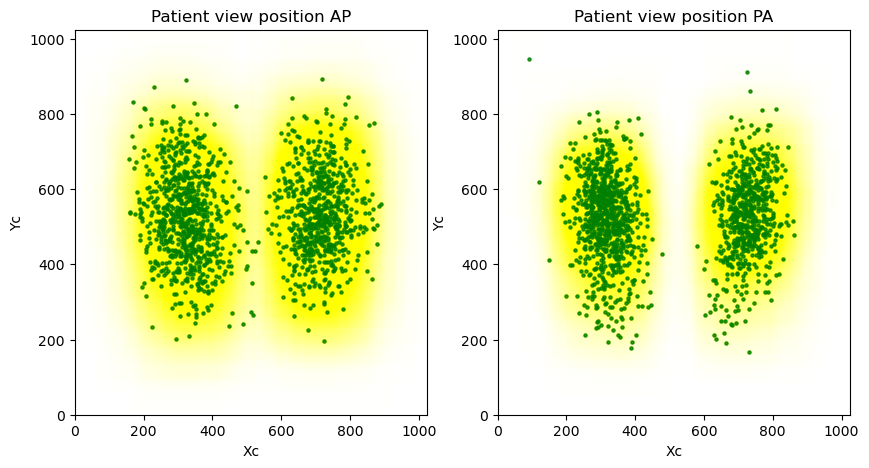

In [81]:
#generate a scatterplot with AP and PA view with a sample size 1500 as there is an inconsistency in the counts of AP/PA view
plot_window(train_annot_1_meta[train_annot_1_meta['view']=='AP'].sample(1500), train_annot_1_meta[train_annot_1_meta['view']=='PA'].sample(1500),
             'green', 'yellow', 'AP', 'PA')

**Observations**

- The above scatter plot shows that in the case of the AP view the points are more `dispersed/scattered`.
- Also, the width of dispersion is more in the AP view compared to the PA view.
- Alternatively, in the case of the PA view the data points are more `tightly clustered`, and their length of the dispersion is more systematic compared to the AP view.
- Overall, there seems to be a pattern in both the views of the patients suffering from Pneumonia and the `density` of the opaque regions is high around the centre.

### Compare patterns between both the Target groups (Pneumonia and Others)

In [82]:
#Check the total input images in Pneumonia positive patients w.r.t gender and image view (AP/PA)
pd.crosstab(index=train_master_class_metadata_1['sex'], columns=train_master_class_metadata_1['view'])

view,AP,PA
sex,,
F,1952,550
M,2712,798


In [83]:
#Check the total input images in Pneumonia negative patients w.r.t gender and image view (AP/PA)
pd.crosstab(index=train_master_class_metadata_0['sex'], columns=train_master_class_metadata_0['view'])

view,AP,PA
sex,,
F,3175,5841
M,4334,7322


**Note**
- A total of 1500 images are taken from AP view and 500 from PA view for both target groups.
- The selection of these random numbers is based on the number of images in Target=1.
- Also it is noticed that the target=1 PA view image count is less compared to AP. So the numbers are different for PA and AP.
- The infection pattern is analyzed in AP and PA groups separately using the central tendencies.
- The above crosstab information clearly shows that there is an imbalance in the dataset between positive and negative images in the training dataset.

### Fetch the pixel array for both positive/negative samples and image views

In [84]:
full_mat_neg_AP = [getOriginalImagePixelArray(i).ravel() for i in train_master_class_metadata.loc[(train_master_class_metadata['Target']==0)  
                     & (train_master_class_metadata['view']=='AP'), 'filename'].sample(1500)]

In [85]:
full_mat_pos_AP = [getOriginalImagePixelArray(i).ravel() for i in train_master_class_metadata.loc[(train_master_class_metadata['Target']==1)  
                     & (train_master_class_metadata['view']=='AP'), 'filename'].sample(1500)]

In [86]:
full_mat_neg_PA = [getOriginalImagePixelArray(i).ravel() for i in train_master_class_metadata.loc[(train_master_class_metadata['Target']==0)  
                     & (train_master_class_metadata['view']=='PA'), 'filename'].sample(500)]

In [87]:
full_mat_pos_PA = [getOriginalImagePixelArray(i).ravel() for i in train_master_class_metadata.loc[(train_master_class_metadata['Target']==1)  
                     & (train_master_class_metadata['view']=='PA'), 'filename'].sample(500)]

### Deriving a composite pixel matrix of patient groups using measures of central tendencies

#### Median-based pixel array between targets (0 and 1) with AP view

In [88]:
def find_median_img(full_mat):
    # calculate the average
    median_img = np.median(full_mat, axis = 0)
    # reshape it back to a matrix
    median_img = median_img.reshape(1024,1024)
    return median_img

In [89]:
norm_median_AP = find_median_img(full_mat_neg_AP)
pneu_median_AP = find_median_img(full_mat_pos_AP)

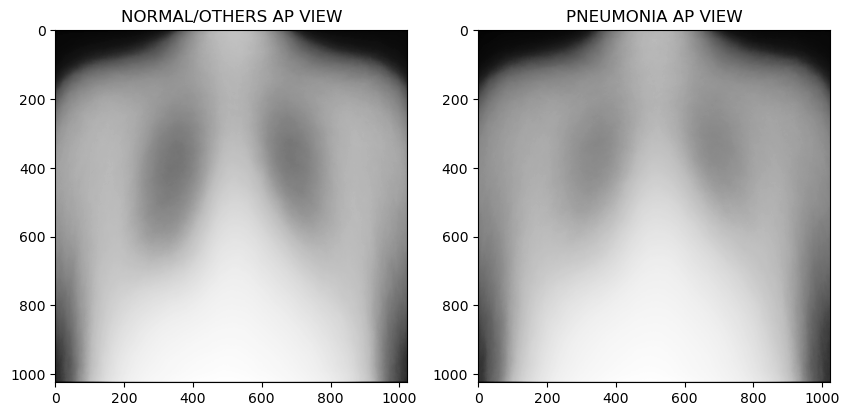

In [90]:
f, axarr = plt.subplots(1,2, figsize= (10,10))
axarr[0].imshow(norm_median_AP, cmap='Greys_r')
axarr[1].imshow(pneu_median_AP, cmap='Greys_r')
axarr[0].title.set_text('NORMAL/OTHERS AP VIEW')
axarr[1].title.set_text('PNEUMONIA AP VIEW')

#### Variance-based pixel array between targets (0 and 1) with PA view

In [91]:
def find_var_img(full_mat):
    # calculate the average
    var_img = np.var(full_mat, axis = 0)
    # reshape it back to a matrix
    var_img = var_img.reshape(1024,1024)
    return var_img

In [92]:
norm_var_PA = find_var_img(full_mat_neg_PA)
pneu_var_PA = find_var_img(full_mat_pos_PA)

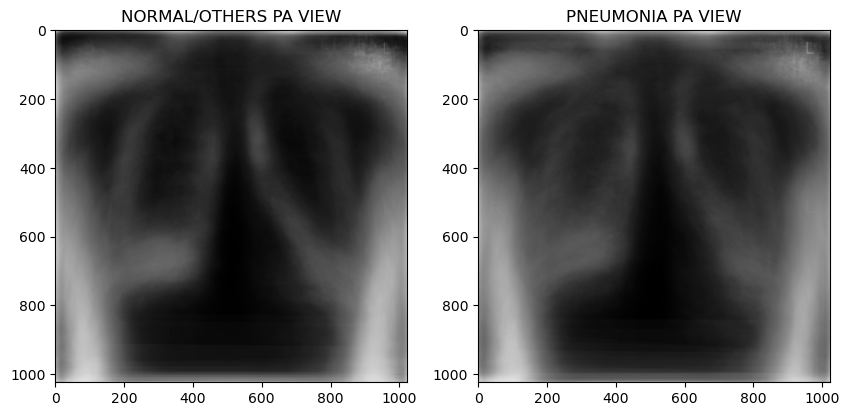

In [93]:
f, axarr = plt.subplots(1,2, figsize= (10,10))
axarr[0].imshow(norm_var_PA, cmap='Greys_r')
axarr[1].imshow(pneu_var_PA, cmap='Greys_r')
axarr[0].title.set_text('NORMAL/OTHERS PA VIEW')
axarr[1].title.set_text('PNEUMONIA PA VIEW')

**Observations**

- The __median__ pixel array is considered for comparison of the AP view of the patient images between _Pneumonia_ positive and negative
- The __variance__ pixel array is considered for comparison of the PA view of the patient images between _Pneumonia_ positive and negative
- The selection of the central tendencies is based on the clarity of visualization.
- In the case of the `PA view`, both lung regions show more `obstruction based on whiteness` in _Pneumonia_ patients denoting `opacity` compared to the `normal` patients.
- The `AP view` of the patients does not give much clarity since both the lungs appear white but the intensity of opacity is more in Pneumonia compared to normal where we can still see a dark patch.
- All these give a clear indication that there is a certain pattern exists between normal and Pneumonia patients.

## Step 4: Preprocessing and Visualisation of different classes

### Check the shape of all the train and test images

- **Check size for one image and see if it matches with the rest of the images**

In [94]:
getOriginalImagePixelArray(train_master_class_metadata['filename'][0]).shape

(1024, 1024)

In [95]:
#Check the shape of all the image pixel array of the train data
tup = (1024,1024)
for i in train_master_class_metadata['filename']:
    if getOriginalImagePixelArray(i).shape != tup:
        print(i)

In [96]:
#Check the shape of the image pixel array of the test data
tup = (1024,1024)
for i in test_data_sub['filename']:
    if getOriginalImagePixelArray(i).shape != tup:
        print(i)

**Observation**
- From the above code, we could observe that both the train and test images have the same pixel sizes i.e. (1024, 1024) 

### Check the color mode of all the train and test images

In [97]:
#Check the color mode of the train images
train_col = set()
for file in train_master_class_metadata['filename']:
    colormode1 = Image.fromarray(getOriginalImagePixelArray(file)).mode
    train_col.add(colormode1)
print("Types of image modes in the train data:", train_col)

Types of image modes in the train data: {'L'}


In [98]:
#Check the color mode of the test images
test_col = set()
for file in test_data_sub['filename']:
    colormode1 = Image.fromarray(getOriginalImagePixelArray(file)).mode
    test_col.add(colormode1)
print("Types of image modes in the test data:", test_col)

Types of image modes in the test data: {'L'}


**Observation**
- From the above code, we could observe that both the train and test images have the same color mode i.e. L

### Resize and normalize the image pixel array of train and test data

In [99]:
#Function resize and normalize the image pixel array
def resizedPixelArray(imagepath, IMAGE_WIDTH, IMAGE_HEIGHT):
    img_arr = cv2.resize(getOriginalImagePixelArray(imagepath), dsize=(IMAGE_WIDTH,IMAGE_HEIGHT), interpolation=cv2.INTER_CUBIC)
    return img_arr/255

In [100]:
#Check the pixel matrix for one train image after resizing
resizedPixelArray(train_master_class_metadata['filename'][0], 224, 224)

array([[          0,   0.0039216,           0, ...,           0,           0,           0],
       [          0,           0,           0, ...,           0,           0,           0],
       [          0,   0.0039216,           0, ...,           0,           0,           0],
       ...,
       [  0.0039216,   0.0039216,   0.0039216, ...,      0.2902,     0.37647,     0.55294],
       [  0.0039216,   0.0039216,   0.0039216, ...,     0.30196,     0.36471,     0.58431],
       [  0.0039216,   0.0039216,   0.0039216, ...,      0.3098,     0.38824,     0.60784]])

In [101]:
#Check the pixel matrix for one test image after resizing
resizedPixelArray(test_data_sub['filename'][0],224, 224)

array([[    0.25882,     0.10196,     0.05098, ...,     0.20784,     0.27451,     0.35686],
       [   0.078431,    0.031373,    0.027451, ...,    0.031373,     0.05098,    0.086275],
       [   0.031373,    0.023529,    0.027451, ...,    0.023529,    0.023529,    0.023529],
       ...,
       [   0.031373,    0.027451,    0.027451, ...,           0,           0,           0],
       [   0.031373,    0.027451,    0.027451, ...,           0,           0,           0],
       [   0.031373,    0.027451,    0.027451, ...,           0,           0,           0]])

In [102]:
#Check the shape of 1 train and test image
print("train image shape", resizedPixelArray(train_master_class_metadata['filename'][0], 224, 224).shape)
print("test image shape", resizedPixelArray(test_data['filename'][0],224, 224).shape)

train image shape (224, 224)
test image shape (224, 224)


### Function to display random images from the train dataset

In [103]:
def randomImageClass(rand):
    plt.figure(figsize=(20, 20))
    for i,j in enumerate(rand):
        plt.subplot(1, len(rand), i+1)
        plt.imshow(getOriginalImagePixelArray(X_train_map['filename'][j]), cmap='gray')
        plt.title("{}".format(j))
        plt.axis('off')
    plt.show()

### Random Images from class : No Lung Opacity / Not Normal

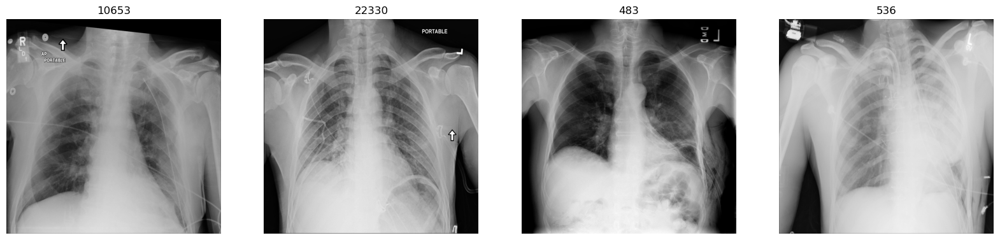

In [104]:
randomImageClass(random.choices(X_train_map[X_train_map['class']=="No Lung Opacity / Not Normal"].index,k=4))

### Random Images from class : Normal

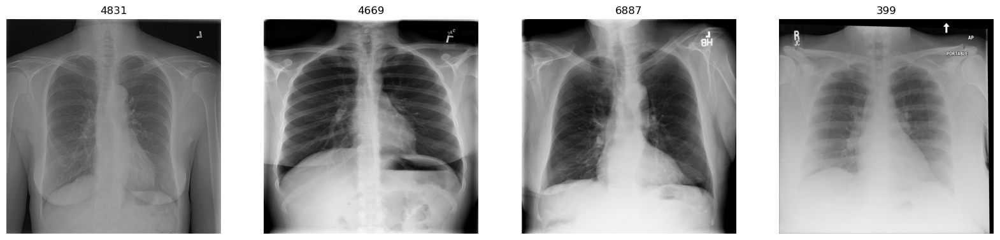

In [105]:
randomImageClass(random.choices(X_train_map[X_train_map['class']=="Normal"].index,k=4))

### Random Images from class Lung Opacity

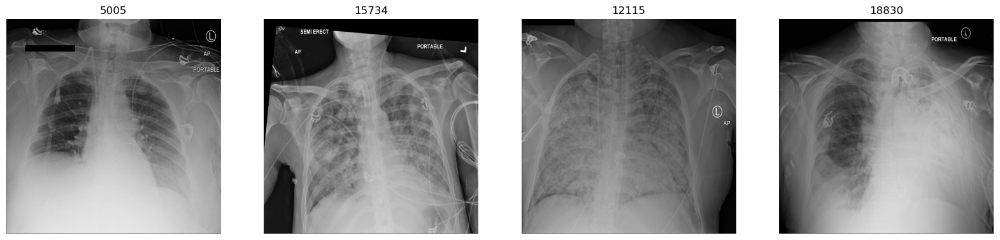

In [106]:
randomImageClass(random.choices(X_train_map[X_train_map['class']=="Lung Opacity"].index,k=4))

## Step 5: Display images with bounding box.

### Count the number of bounding boxes for all the images in the training set

In [107]:
train_master_class_metadata['nBoxes'] = [len(boxes) if label == 1 else 0 for boxes, label in zip(train_master_class_metadata['bounding_box'], train_master_class_metadata['Target'])]

In [108]:
train_master_class_metadata.head()

,filename,patientId,class,bounding_box,Target,sex,age,partExamined,view,modality,cType,PatientAgeBins,nBoxes
0,stage_2_train_images/7be6b4de-afe9-43c0-a581-0...,7be6b4de-afe9-43c0-a581-0f49608c8976,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,F,35,CHEST,PA,CR,WSD,"(30.0, 40.0]",0
1,stage_2_train_images/2dcdd159-2889-48d3-a0ce-5...,2dcdd159-2889-48d3-a0ce-5c7b1086c49d,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,F,54,CHEST,PA,CR,WSD,"(50.0, 60.0]",0
2,stage_2_train_images/d8e66874-305e-4c80-9b75-5...,d8e66874-305e-4c80-9b75-5e764eb718ff,No Lung Opacity / Not Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,M,68,CHEST,AP,CR,WSD,"(60.0, 70.0]",0
3,stage_2_train_images/22f2d3ec-f7ea-4778-850d-b...,22f2d3ec-f7ea-4778-850d-bb111590202f,Lung Opacity,"[{'x': 213.0, 'y': 321.0, 'width': 169.0, 'hei...",1,F,70,CHEST,PA,CR,WSD,"(60.0, 70.0]",1
4,stage_2_train_images/cdaa07d4-4234-4cd2-b9bf-a...,cdaa07d4-4234-4cd2-b9bf-abbf5aed1bb4,Normal,"[{'x': 0.0, 'y': 0.0, 'width': 0.0, 'height': ...",0,M,56,CHEST,AP,CR,WSD,"(50.0, 60.0]",0


In [109]:
train_master_class_metadata['nBoxes'].value_counts().sort_values()

nBoxes
4       13
3      119
1     2614
2     3266
0    20672
Name: count, dtype: int64

**Observations**
- We created a new column `nBox` in the `train_master_class_metadata` that will give the count of bounding boxes 
- Since Target=0, do not hold any bounding box coordinates that are assigned 0.
- The above table shows the bounding boxes with their corresponding count of images.
- There is a maximum of `4 bounding boxes` reported in 13 images and there are no bounding boxes in 20672 images.

### Function to create the bounding boxes on the train images

In [110]:
def imageboundingBox(randindx, imagefile):
    imgArray = getOriginalImagePixelArray(imagefile)
    current_axis = plt.gca()
    for j in range(0,len(train_master_class_metadata['bounding_box'][randindx])):
        x1 = int(train_master_class_metadata.iloc[randindx]['bounding_box'][j]['x'])
        y1 = int(train_master_class_metadata.iloc[randindx]['bounding_box'][j]['y'])
        w = int(train_master_class_metadata.iloc[randindx]['bounding_box'][j]['width'])
        h = int(train_master_class_metadata.iloc[randindx]['bounding_box'][j]['height'])
        #cv2.rectangle(imgArray,(x1,y1),(x1+w,y1+h),(255,0,0), 5)
        current_axis.add_patch(plt.Rectangle((x1, y1), w, h, color='yellow', fill=False, linewidth=3))
    plt.imshow(imgArray, cmap='gray')
    plt.title("{}".format(randindx))

### Randomly select and plot images based on the boxcount 

In [111]:
def countimagewithBoxes(boxcount, df, nImages=4):
    if boxcount == 0 or boxcount > df.nBoxes.max():
        print("Specified number of boxes not available. Please input between 1 and 4")
        return boxcount
    else:
        bbIndex = df[(df['nBoxes']== boxcount)&(df['class']== "Lung Opacity")].index
        rand = random.choices(bbIndex, k=nImages)
        fig, axes = plt.subplots(nrows=1, ncols=len(rand), figsize=(20, 20))
        for i in range(0, len(rand)):
            plt.subplot(1, len(rand), i+1)
            imageboundingBox(rand[i],df['filename'][rand[i]])
        fig.tight_layout()
        plt.show()
        return rand

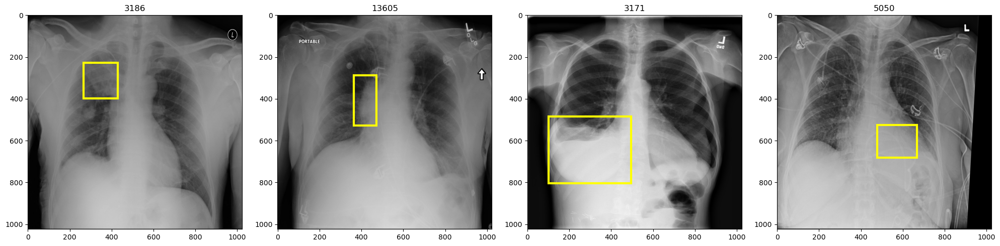

[3186, 13605, 3171, 5050]

In [112]:
#Plot images with 1 bounding box
countimagewithBoxes(1,train_master_class_metadata.copy())

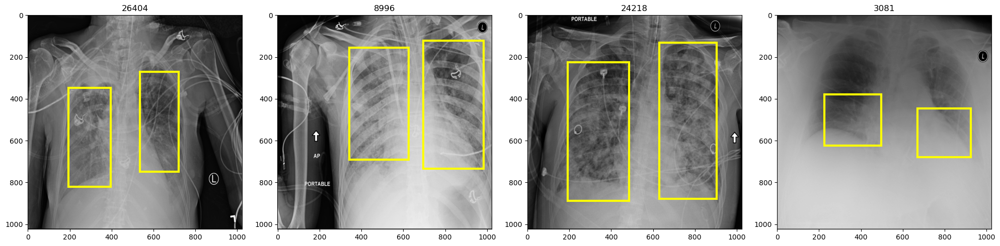

[26404, 8996, 24218, 3081]

In [113]:
#Plot images with 2 bounding boxes
countimagewithBoxes(2,train_master_class_metadata.copy())

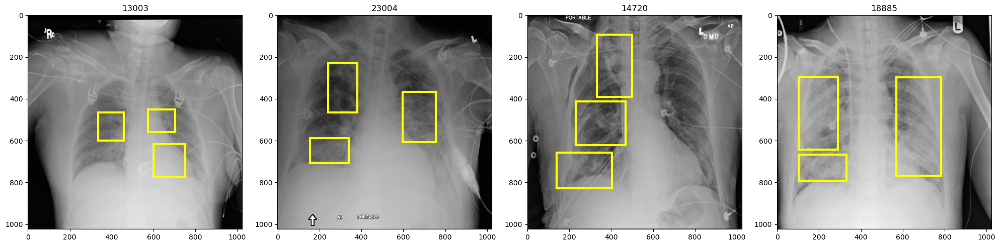

[13003, 23004, 14720, 18885]

In [114]:
#Plot images with 3 bounding boxes
countimagewithBoxes(3,train_master_class_metadata.copy())

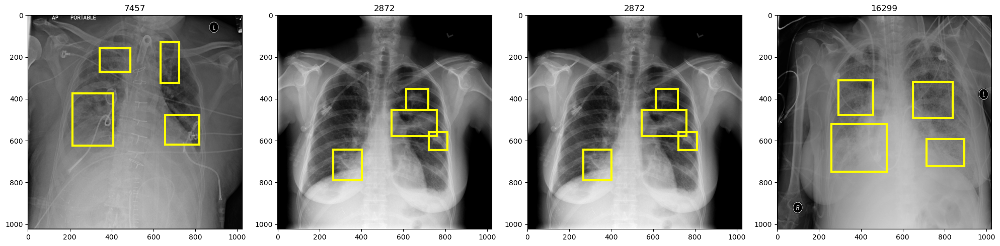

[7457, 2872, 2872, 16299]

In [115]:
countimagewithBoxes(4,train_master_class_metadata.copy())

## Step 6: Design, train and test basic CNN models for classification.

**Note**
- The training data was split into `train and validation` datasets in Step 3. 
- We will fetch the resized pixel array for train, validation, and test data sets for model creation and classification.

In [116]:
#Fetch the resized pixel array of the train dataset  
X_train_mat = np.array([resizedPixelArray(i, 224, 224) for i in X_train_map['filename']])

In [117]:
#Target label of the X-train data
y_train_lb = np.array(X_train_map['Target'])

In [118]:
#Fetch the resized pixel array of the validation dataset 
X_val_mat = np.array([resizedPixelArray(i, 224, 224) for i in X_val_map['filename']])

In [119]:
#Target label of the X-val data
y_val_lb = np.array(X_val_map['Target'])

In [120]:
#Fetch the resized pixel array of the test dataset 
X_test_mat = np.array([resizedPixelArray(i,224, 224) for i in test_data_sub['filename']])

In [121]:
print("the length of X train and y train", X_train_mat.shape, y_train_lb.shape)
print("the length of X val and y val", X_val_mat.shape, y_val_lb.shape)
print("the length of X test", X_test_mat.shape)

the length of X train and y train (21347, 224, 224) (21347,)
the length of X val and y val (5337, 224, 224) (5337,)
the length of X test (3000, 224, 224)


### CNN Model-1

#### Architecture design of CNN Model-1

**Description of the architecture**

- Number of convolution layers: 2
- Number of nodes in the convolution layers: 32, 64
- Number of fully connected layer is 1 and has 32 nodes
- Number of output layer:1  with 1 node
- Activation function(s): relu in the convolution layer, sigmoid in output layer
- Kernel size: 3
- Optimizer: adam
- Learning_rate: 0.001
- Loss function: Binary crossentropy
- Number of Epochs for training: 5
- Batch size for training: 32

In [122]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [123]:
# Model architecture building
model_1 = Sequential()

model_1.add(Convolution2D(filters = 32, kernel_size = 3, strides=1, input_shape = (224,224,1)))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(pool_size = 2))


model_1.add(Convolution2D(filters = 64, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_1.add(Activation('relu'))
model_1.add(MaxPooling2D(pool_size = 2))

model_1.add(Flatten())

model_1.add(Dense(units = 32))
model_1.add(Activation('relu'))

# Classification layer
model_1.add(Dense(units = 1))
model_1.add(Activation('sigmoid'))

Metal device set to: Apple M1


In [124]:
model_1.compile(optimizer="adam", loss = 'binary_crossentropy', metrics = ['accuracy'])
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      320       
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 activation_1 (Activation)   (None, 109, 109, 64)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                    

### Train the model

In [125]:
history_1 = model_1.fit(X_train_mat, y_train_lb , validation_data=(X_val_mat, y_val_lb), epochs=5, verbose=1, batch_size = 32, shuffle=False)

Epoch 1/5
668/668 [==============================] - 116s 173ms/step - loss: 0.4674 - accuracy: 0.7895 - val_loss: 0.4290 - val_accuracy: 0.7975
Epoch 2/5
668/668 [==============================] - 125s 186ms/step - loss: 0.4275 - accuracy: 0.8005 - val_loss: 0.4211 - val_accuracy: 0.8038
Epoch 3/5
668/668 [==============================] - 127s 190ms/step - loss: 0.4009 - accuracy: 0.8202 - val_loss: 0.4334 - val_accuracy: 0.8042
Epoch 4/5
668/668 [==============================] - 129s 193ms/step - loss: 0.3569 - accuracy: 0.8440 - val_loss: 0.4842 - val_accuracy: 0.8010
Epoch 5/5
668/668 [==============================] - 146s 218ms/step - loss: 0.2858 - accuracy: 0.8793 - val_loss: 0.5579 - val_accuracy: 0.7960


In [126]:
#print the accuracy of the train dataset
acc_base_01_train = model_1.evaluate(X_train_mat,y_train_lb)
print("Training Accuracy of Model1 is", acc_base_01_train[1])

668/668 [==============================] - 53s 79ms/step - loss: 0.2919 - accuracy: 0.8783
Training Accuracy of Model1 is 0.8783435821533203


In [127]:
#evaluate the validation dataset
result1 = model_1.evaluate(X_val_mat,y_val_lb)
print("Validation Accuracy of Model1 is", result1[1])

167/167 [==============================] - 14s 82ms/step - loss: 0.5579 - accuracy: 0.7960
Validation Accuracy of Model1 is 0.7959527969360352


In [128]:
#Prediction on the validation dataset
y_val_predict =  model_1.predict(X_val_mat)

167/167 [==============================] - 13s 76ms/step


### Generate the ROC-AUC Curve

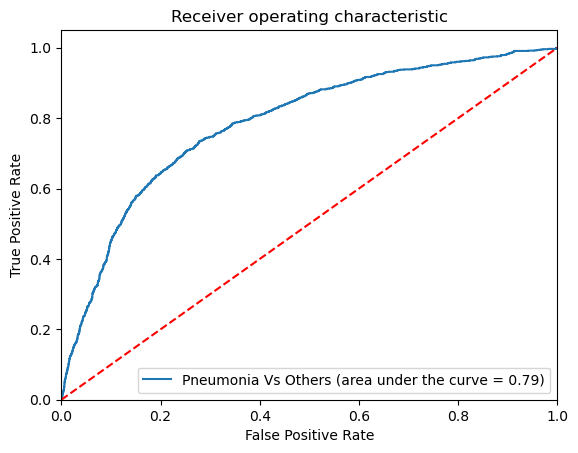

In [129]:
fpr, tpr, thresholds = metrics.roc_curve(y_val_lb,y_val_predict, drop_intermediate=False)
auc_model1 = metrics.roc_auc_score(y_val_lb,y_val_predict)
plt.plot(fpr,tpr,label='Pneumonia Vs Others (area under the curve = %0.2f)' % auc_model1)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

### Finding the optimal threshold based on the ROC-AUC curve

In [130]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print("the optimal threshold value is", round(optimal_threshold,2))
print("the true positive rate at optimal threshold", round(tpr[optimal_idx],2))
print("the false positive rate at optimal threshold", round(fpr[optimal_idx],2))

the optimal threshold value is 0.1
the true positive rate at optimal threshold 0.74
the false positive rate at optimal threshold 0.28


**Note**

- The `optimal threshold` probability score for Model-1 is 0.1
- However, we selected a more stringent probability threshold i.e. >0.5 for predicting the classes of the validation dataset.
- Class probability value >0.5 belongs to Target=1 i.e (_Pneumonia Positive_) and the rest would be Target=0 (_Pneumonia Negative__)

In [131]:
#Target/class prediction for the validation dataset
y_val_predict_cutoff = (y_val_predict>0.5)

In [132]:
# Function to format classification report for model comparison
def getReportMetrics(actual, predicted, modelName):
    import warnings
    warnings.filterwarnings('ignore')
    reportDf = pd.DataFrame(classification_report(actual, predicted, output_dict=True)).T
    reportDf['Model'] = modelName
    nIndex = [index for index in reportDf.index if index not in ['accuracy', 'macro avg', 'weighted avg']]
    reportDf['Target'] = reportDf.index
    return reportDf.loc[nIndex]

#### Model-1: Classification report

In [133]:
cr_model1 = classification_report(y_val_lb, y_val_predict_cutoff)
print(cr_model1)

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      4135
           1       0.56      0.42      0.48      1202

    accuracy                           0.80      5337
   macro avg       0.70      0.66      0.68      5337
weighted avg       0.78      0.80      0.78      5337



In [134]:
model1_report = getReportMetrics(y_val_lb, y_val_predict_cutoff, "Model-1")

#### Model-1: Confusion matrix

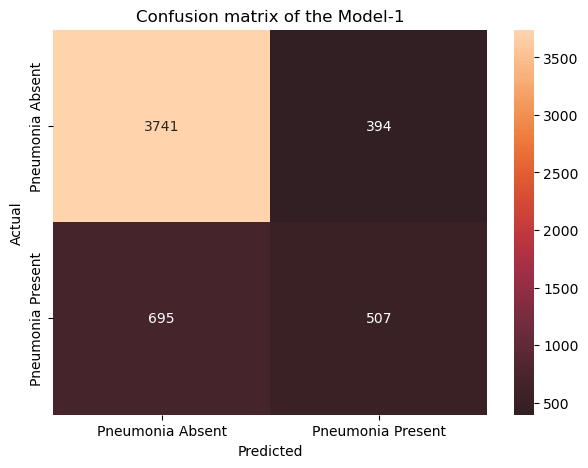

In [135]:
cm_base_md = confusion_matrix(y_val_lb, y_val_predict_cutoff, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_model1 = pd.DataFrame(cm_base_md, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of the Model-1')
sns.heatmap(df_cm_model1, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Function to save the objects in pickle format for downstream comparison

In [136]:
# Function to save needed objects in pickle format
def savePickle(variable, fname):
    with open(fname, 'wb') as f:
        np.save(f, variable)
    return fname

# Function to load needed objects in pickle format       
def loadPickle(fname):
    with open(fname, 'rb') as f:
        variable = np.load(f, allow_pickle=True)    
    return variable

def saveModel(model, fname):
    with open(fname, 'wb') as f:
        pickle.dump(model, f)
    return fname    

def loadModel(fname):
    return pickle.load(open(fname, 'rb'))

### Display bounding box on the test image

#### Pickle the base CNN model-1 and the results files 

In [137]:
saveModel(model_1,"pickle_files_models/model_1.pkl")
savePickle(acc_base_01_train, "pickle_files_models/acc_base_01_train.pkl") 
savePickle(result1, "pickle_files_models/acc_base_01_val.pkl") 
savePickle(cr_model1 , "pickle_files_models/cr_model1.pkl")
savePickle(cm_base_md, "pickle_files_models/cm_base_model1.pkl")
savePickle(model1_report, "model1_report.pkl")

INFO:tensorflow:Assets written to: ram://6fad67c9-b3ea-440d-944a-dfb594f489f2/assets


INFO:tensorflow:Assets written to: ram://6fad67c9-b3ea-440d-944a-dfb594f489f2/assets


'model1_report.pkl'

### CNN Model-2

**Architecture Design of Model-2**

- Number of convolution layers: 3
- Number of nodes in the convolution layers: 32, 64, 96
- Fully connected layers:2
- Number of nodes in the fully connected layers: 64, 32
- Output layer :1 and Node :1
- Activation function(s): relu in the convolution layer, sigmoid in output layer
- Kernel size: 3
- strides: 1 in each of the convolution layer
- Optimizer: rmsprop
- Learning_rate : 0.0001
- Loss function: Binary cross-entropy
- Number of Epochs for training: 5
- Batch size for training: 16

In [138]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [139]:
# Model architecture building
# Model architecture building
model_2 = Sequential()

#convolution layers
model_2.add(Convolution2D(filters = 32, kernel_size = 3, strides=1, input_shape = (224,224,1)))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size = 2))


model_2.add(Convolution2D(filters = 64, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size = 2))


model_2.add(Convolution2D(filters = 96, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(pool_size = 2))

model_2.add(Flatten())

#Fully connected layers
model_2.add(Dense(units = 64))
model_2.add(Activation('relu'))

model_2.add(Dense(units = 32))
model_2.add(Activation('relu'))

#output layer
model_2.add(Dense(units = 1))
model_2.add(Activation('sigmoid')) 

In [140]:
opt = optimizers.RMSprop(learning_rate= 0.0001)
model_2.compile(optimizer=opt, loss = 'binary_crossentropy', metrics = ['accuracy'])
model_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      320       
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 activation_1 (Activation)   (None, 109, 109, 64)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                    

In [141]:
history2 = model_2.fit(X_train_mat, y_train_lb , validation_data=(X_val_mat, y_val_lb), epochs=5, verbose=1, batch_size = 16, shuffle=False)

Epoch 1/5
1335/1335 [==============================] - 157s 117ms/step - loss: 0.4520 - accuracy: 0.7933 - val_loss: 0.4277 - val_accuracy: 0.8004
Epoch 2/5
1335/1335 [==============================] - 176s 132ms/step - loss: 0.4303 - accuracy: 0.8025 - val_loss: 0.4234 - val_accuracy: 0.8044
Epoch 3/5
1335/1335 [==============================] - 176s 132ms/step - loss: 0.4202 - accuracy: 0.8087 - val_loss: 0.4206 - val_accuracy: 0.8066
Epoch 4/5
1335/1335 [==============================] - 175s 131ms/step - loss: 0.4106 - accuracy: 0.8157 - val_loss: 0.4232 - val_accuracy: 0.8070
Epoch 5/5
1335/1335 [==============================] - 175s 131ms/step - loss: 0.4009 - accuracy: 0.8220 - val_loss: 0.4195 - val_accuracy: 0.8102


In [142]:
#print the accuracy of the train dataset
acc_base_02_train = model_2.evaluate(X_train_mat,y_train_lb)
print("Training Accuracy Model2 is", acc_base_02_train[1])

668/668 [==============================] - 57s 84ms/step - loss: 0.3981 - accuracy: 0.8170
Training Accuracy Model2 is 0.8169766068458557


In [143]:
#evaluate the validation dataset
result2 = model_2.evaluate(X_val_mat,y_val_lb)
print("Validation Accuracy Model2 is", result2[1])

167/167 [==============================] - 14s 84ms/step - loss: 0.4195 - accuracy: 0.8102
Validation Accuracy Model2 is 0.8101930022239685


In [144]:
#Prediction on the validation dataset
y_val_predict_02 =  model_2.predict(X_val_mat)

167/167 [==============================] - 14s 82ms/step


### Model-2 ROC-AUC Curve

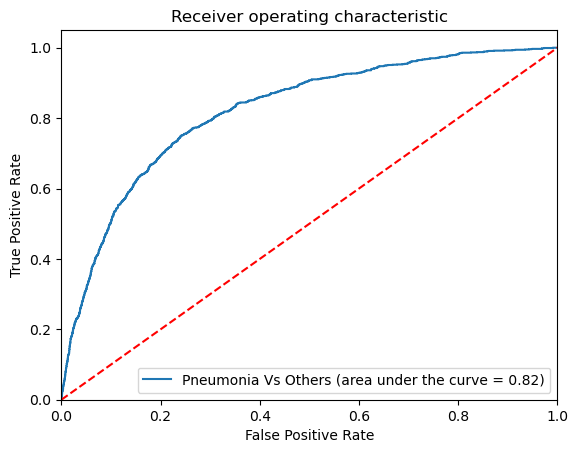

In [145]:
fpr, tpr, thresholds = metrics.roc_curve(y_val_lb,y_val_predict_02, drop_intermediate=False)
auc_model2 = metrics.roc_auc_score(y_val_lb,y_val_predict_02)
plt.plot(fpr,tpr,label='Pneumonia Vs Others (area under the curve = %0.2f)' % auc_model2)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

### Finding the optimal threshold based on the ROC-AUC curve

In [146]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print("the optimal threshold value is", round(optimal_threshold,2))
print("the true positive rate at optimal threshold", round(tpr[optimal_idx],2))
print("the false positive rate at optimal threshold", round(fpr[optimal_idx],2))

the optimal threshold value is 0.29
the true positive rate at optimal threshold 0.75
the false positive rate at optimal threshold 0.24


**Note**

- The `optimal threshold` probability score for Model-2 is 0.29
- However, we selected a more stringent probability threshold i.e. >0.5 for predicting the classes of the validation dataset.
- Class probability value >0.5 belongs to Target=1 i.e (_Pneumonia Positive_) and the rest would be Target=0 (_Pneumonia Negative_)

In [147]:
y_val_predict_cutoff_02 = (y_val_predict_02 > 0.5)

### Model-2 : Classification Report

In [148]:
cr_model2 = classification_report(y_val_lb,y_val_predict_cutoff_02)
print(cr_model2)

              precision    recall  f1-score   support

           0       0.87      0.89      0.88      4135
           1       0.58      0.55      0.57      1202

    accuracy                           0.81      5337
   macro avg       0.73      0.72      0.72      5337
weighted avg       0.81      0.81      0.81      5337



In [149]:
model2_report = getReportMetrics(y_val_lb, y_val_predict_cutoff_02, "Model-2")

### Model-2: Confusion matrix

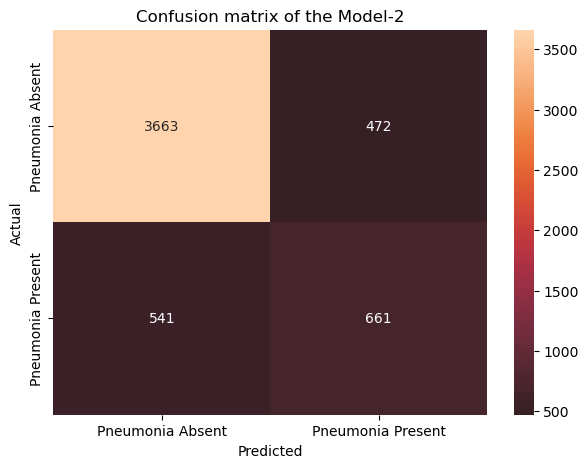

In [150]:
cm_base_md_02 = confusion_matrix(y_val_lb, y_val_predict_cutoff_02, labels=[0,1])
df_cm_model2 = pd.DataFrame(cm_base_md_02, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of the Model-2')
sns.heatmap(df_cm_model2, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Pickle the base CNN model-2 and the results files 

In [151]:
saveModel(model_2,"pickle_files_models/model_2.pkl")
savePickle(acc_base_02_train, "pickle_files_models/acc_base_02_train.pkl") 
savePickle(result2, "pickle_files_models/acc_base_02_val.pkl") 
savePickle(cr_model2 , "pickle_files_models/cr_model2.pkl")
savePickle(cm_base_md_02, "pickle_files_models/cm_base_md_02.pkl")
savePickle(model2_report, "model2_report.pkl")

INFO:tensorflow:Assets written to: ram://15a40c12-ecce-4ead-85ab-3e9b6db8347c/assets


INFO:tensorflow:Assets written to: ram://15a40c12-ecce-4ead-85ab-3e9b6db8347c/assets


'model2_report.pkl'

### CNN Model-3

**Note**
- To build this model, we have to balance the classes in the training data.
- This will be achieved by downsampling the Target=0 datasets in equal proportions as that of Target=1.

#### Check the train_master_class shape having positive and negative images

In [152]:
#Check the total number of input images in Pneumonia positive and negative patients.
print("the total images in target=1:",len(train_master_class_metadata_1))
print("the total images in target=0:", len(train_master_class_metadata_0))

the total images in target=1: 6012
the total images in target=0: 20672


In [153]:
#Check the total input images in Pneumonia positive patients w.r.t gender and image view (AP/PA)
pd.crosstab(index=train_master_class_metadata_1['sex'], columns=train_master_class_metadata_1['view'])

view,AP,PA
sex,,
F,1952,550
M,2712,798


In [154]:
#Check the total input images in Pneumonia negative patients w.r.t gender and image view (AP/PA)
pd.crosstab(index=train_master_class_metadata_0['sex'], columns=train_master_class_metadata_0['view'])

view,AP,PA
sex,,
F,3175,5841
M,4334,7322


#### Downsampling `Pneumonia negative samples` w.r.t to gender and view `in proportion` to that of positive samples.

In [155]:
subsample_AP_F = train_master_class_metadata_0[(train_master_class_metadata_0['sex']=='F') & (train_master_class_metadata_0['view']=='AP')].sample(n=1952, random_state=1)

In [156]:
subsample_PA_F = train_master_class_metadata_0[(train_master_class_metadata_0['sex']=='F') & (train_master_class_metadata_0['view']=='PA')].sample(n=550, random_state=1)

In [157]:
subsample_AP_M = train_master_class_metadata_0[(train_master_class_metadata_0['sex']=='M') & (train_master_class_metadata_0['view']=='AP')].sample(n=2712, random_state=1)

In [158]:
subsample_PA_M = train_master_class_metadata_0[(train_master_class_metadata_0['sex']=='M') & (train_master_class_metadata_0['view']=='PA')].sample(n=798, random_state=1)

In [159]:
final_balanced_0 = pd.concat([subsample_AP_F, subsample_PA_F,subsample_AP_M,subsample_PA_M])

In [160]:
train_subsampled = pd.concat([train_master_class_metadata_1,final_balanced_0])

#### Splitting the subsampled data into train and validation dataset

In [161]:
X_sub = train_subsampled[['filename']]
y_sub = train_subsampled[['Target']]

In [162]:
X_train_sub, X_val_sub, y_train_sub, y_val_sub = train_test_split(X_sub, y_sub, test_size=0.2, random_state=7, stratify=y_sub)

In [163]:
X_train_map = train_subsampled[train_subsampled['filename'].isin(X_train_sub['filename'])]

In [164]:
X_val_map = train_subsampled[train_subsampled['filename'].isin(X_val_sub['filename'])]

In [165]:
len(X_train_map), len(X_val_map)

(9619, 2405)

#### Fetch the pixel array of the sub-sampled train and validation dataset

In [166]:
X_train_sub_mat = np.array([resizedPixelArray(i, 224, 224) for i in X_train_map['filename']])

In [167]:
X_val_sub_mat = np.array([resizedPixelArray(i, 224, 224) for i in X_val_map['filename']])

In [168]:
y_train_sub_lb = np.array(X_train_map['Target'])

In [169]:
y_val_sub_lb = np.array(X_val_map['Target'])

In [170]:
print("the length of X train and y train", X_train_sub_mat.shape, y_train_sub_lb.shape)
print("the length of X val and y val", X_val_sub_mat.shape, y_val_sub_lb.shape)

the length of X train and y train (9619, 224, 224) (9619,)
the length of X val and y val (2405, 224, 224) (2405,)


### CNN Model-3

**Note**
- The Model-3 architecture is the `same` as that of `Model-2`. The only difference is that the model-3 will be trained with the class-balanced dataset. 

**Architecture design of Model-3**

- Number of convolution layers: 3
- Number of nodes in the convolution layers: 32, 64, 96
- Fully connected layers:2
- Number of nodes in the fully connected layers: 64, 32
- Output layer :1 and Node :1
- Activation function(s): relu in the convolution layer, sigmoid in output layer
- Kernel size: 3
- strides: 1 in each of the convolution layer
- Optimizer: rmsprop
- Learning_rate : 0.0001
- Loss function: Binary cross-entropy
- Number of Epochs for training: 5
- Batch size for training: 16

In [171]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [172]:
# Model architecture building
model_3 = Sequential()

#convolution layers
model_3.add(Convolution2D(filters = 32, kernel_size = 3, strides=1, input_shape = (224,224,1)))
model_3.add(Activation('relu'))
model_3.add(MaxPooling2D(pool_size = 2))


model_3.add(Convolution2D(filters = 64, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_3.add(Activation('relu'))
model_3.add(MaxPooling2D(pool_size = 2))


model_3.add(Convolution2D(filters = 96, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_3.add(Activation('relu'))
model_3.add(MaxPooling2D(pool_size = 2))

model_3.add(Flatten())

#Fully connected layers
model_3.add(Dense(units = 64))
model_3.add(Activation('relu'))

model_3.add(Dense(units = 32))
model_3.add(Activation('relu'))

#output layer
model_3.add(Dense(units = 1))
model_3.add(Activation('sigmoid'))

In [173]:
opt = optimizers.RMSprop(learning_rate= 0.0001)
model_3.compile(optimizer=opt, loss = 'binary_crossentropy', metrics = ['accuracy'])
model_3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      320       
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 activation_1 (Activation)   (None, 109, 109, 64)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                    

### Fitting with balanced class data

In [174]:
history_3 = model_3.fit(X_train_sub_mat, y_train_sub_lb , validation_data=(X_val_sub_mat, y_val_sub_lb), epochs=5, verbose=1, batch_size = 16, shuffle=False)

Epoch 1/5
602/602 [==============================] - 69s 113ms/step - loss: 0.1272 - accuracy: 0.9780 - val_loss: 11.0491 - val_accuracy: 0.4998
Epoch 2/5
602/602 [==============================] - 78s 130ms/step - loss: 0.2258 - accuracy: 0.9743 - val_loss: 10.8181 - val_accuracy: 0.4998
Epoch 3/5
602/602 [==============================] - 80s 132ms/step - loss: 0.1685 - accuracy: 0.9860 - val_loss: 10.8731 - val_accuracy: 0.4998
Epoch 4/5
602/602 [==============================] - 80s 132ms/step - loss: 0.1089 - accuracy: 0.9926 - val_loss: 11.2859 - val_accuracy: 0.4998
Epoch 5/5
602/602 [==============================] - 78s 130ms/step - loss: 0.0880 - accuracy: 0.9943 - val_loss: 11.4804 - val_accuracy: 0.4998


In [175]:
#print the accuracy of the train dataset
acc_base_03_train = model_3.evaluate(X_train_sub_mat,y_train_sub_lb)
print("Training accuracy of Model3 is", acc_base_03_train[1])

301/301 [==============================] - 24s 78ms/step - loss: 11.5598 - accuracy: 0.5001
Training accuracy of Model3 is 0.5000519752502441


In [176]:
#evaluate the validation dataset
result3 = model_3.evaluate(X_val_sub_mat,y_val_sub_lb)
print("Validation accuracy of Model3 is", result3[1])

76/76 [==============================] - 5s 65ms/step - loss: 11.4804 - accuracy: 0.4998
Validation accuracy of Model3 is 0.49979209899902344


In [177]:
#Prediction on the validation dataset
y_val_predict_03 =  model_3.predict(X_val_sub_mat)

76/76 [==============================] - 6s 69ms/step


In [178]:
y_val_predict_cutoff_03 = (y_val_predict_03 > 0.5)

#### Model-3: Classification Report

In [179]:
cr_model3 = classification_report(y_val_sub_lb,y_val_predict_cutoff_03)
print(cr_model3)

              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1202
           1       0.00      0.00      0.00      1203

    accuracy                           0.50      2405
   macro avg       0.25      0.50      0.33      2405
weighted avg       0.25      0.50      0.33      2405



In [180]:
model3_report = getReportMetrics(y_val_sub_lb, y_val_predict_cutoff_03, "Model-3")

#### Model-3: Confusion matrix

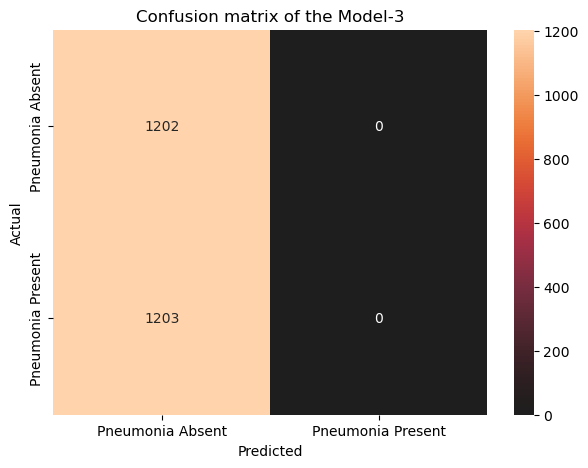

In [181]:
cm_base_md_03 = confusion_matrix(y_val_sub_lb,y_val_predict_cutoff_03, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_model3 = pd.DataFrame(cm_base_md_03, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of the Model-3')
sns.heatmap(df_cm_model3, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Pickle the base CNN model-3 and the results files 

In [182]:
saveModel(model_3,"pickle_files_models/model_3.pkl")
savePickle(acc_base_03_train, "pickle_files_models/acc_base_03_train.pkl") 
savePickle(result3, "pickle_files_models/acc_base_03_val.pkl") 
savePickle(cr_model3 , "pickle_files_models/cr_model3.pkl")
savePickle(cm_base_md_03, "pickle_files_models/cm_base_md_03.pkl")
savePickle(model3_report, "model3_report.pkl")

INFO:tensorflow:Assets written to: ram://b0e7af11-89bd-4cd6-96a1-5b274758f9ff/assets


INFO:tensorflow:Assets written to: ram://b0e7af11-89bd-4cd6-96a1-5b274758f9ff/assets


'model3_report.pkl'

### Compare the accuracy of the CNN models

In [183]:
#Summary of all the models showing train and validation accuracies
model_summary = pd.DataFrame({
    "Model" : ['Model-1','Model-2','Model-3'],
    "Training Accuracy": [acc_base_01_train[1],acc_base_02_train[1],acc_base_03_train[1]],
    "Validation Accuracy": [result1[1], result2[1], result3[1]]
}).sort_values(by='Validation Accuracy', ascending=False).reset_index(drop=True)
model_summary

,Model,Training Accuracy,Validation Accuracy
0,Model-2,0.816977,0.810193
1,Model-1,0.878344,0.795953
2,Model-3,0.500052,0.499792


### Compare other performance metrics based on the classification report

In [184]:
reportSummary = pd.concat([model1_report, model2_report, model3_report]).reset_index(drop=True)
reportSummary

,precision,recall,f1-score,support,Model,Target
0,0.843327,0.904716,0.872944,4135.0,Model-1,0
1,0.562708,0.421797,0.482168,1202.0,Model-1,1
2,0.871313,0.885852,0.878523,4135.0,Model-2,0
3,0.583407,0.549917,0.566167,1202.0,Model-2,1
4,0.499792,1.000000,0.666482,1202.0,Model-3,0
5,0.000000,0.000000,0.000000,1203.0,Model-3,1


### Compare the Training Loss and Validation Loss of Model-1 and Model-2

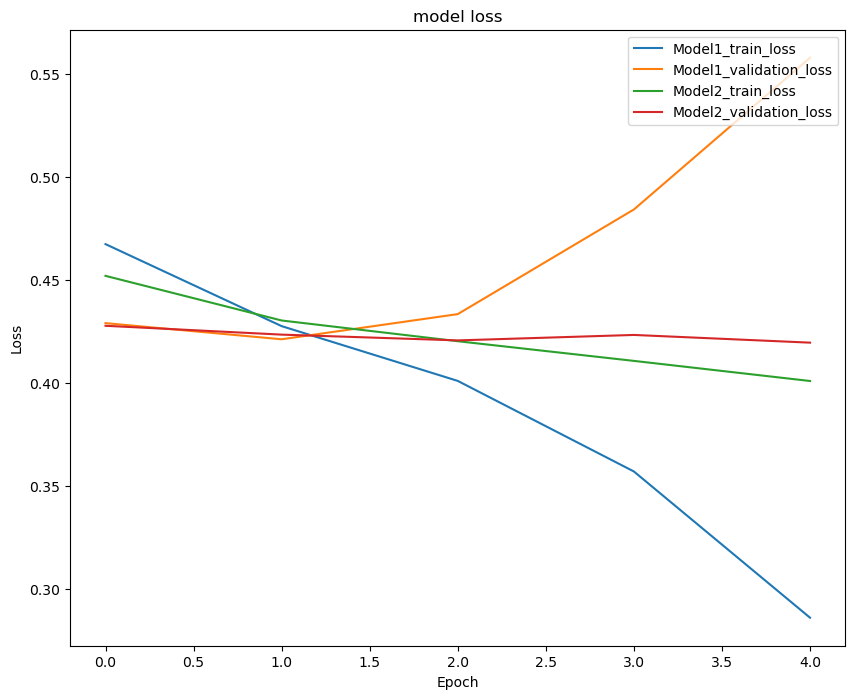

In [185]:
#Plotting Train Loss vs Validation Loss
plt.figure(figsize=(10,8))
plt.plot(history_1.history['loss'])
plt.plot(history_1.history['val_loss'])
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Model1_train_loss', 'Model1_validation_loss', 'Model2_train_loss', 'Model2_validation_loss'], loc='upper right')
plt.show()

### Summary of the basic CNN models

- It is seen from the above Accuracy table that Model-1 has good training accuracy; however, the validation accuracy is comparatively lower. Also the above image clearly shows divergence between the train and validation loss. This indicates that Model-1 is `overfitting` on the training dataset.
- Incase of Model-2 we could observe a convergence in terms of both accuracy as well as loss functions between the train and the validation which suggests that Model-2 is a `good-fit` on both the dataset.
- Model-3 despite class balancing shows the worst performance which is obviously not a  choice for class prediction on the test dataset. 
- Upon comparison of the `classification report summary`, it is observed that the `F1-score` for both Model-1 and Model-2 are `similar` for the Target class 0; however, the `precision` and `recall` for Target class 1 are better in Model-2 compared to Model-1.
- So based on the above observations, `Model-2` is considered for `class prediction` of the test dataset.

### Predict the class probability for the test dataset

In [186]:
X_test_mat.shape

(3000, 224, 224)

In [187]:
y_test_predict =  model_2.predict(X_test_mat)

94/94 [==============================] - 6s 63ms/step


In [188]:
# Probability values for the predicted classes
y_test_predict

array([[     0.0472],
       [   0.077632],
       [    0.20305],
       ...,
       [    0.80581],
       [    0.14021],
       [    0.41525]], dtype=float32)

### Classify test images on the probability scores

In [189]:
#Threshold of >0.5 are True (Pneumonia Positive) and the rest are False(Pneumonia Negative)
y_test_predict_cutoff = (y_test_predict>0.5)

In [190]:
y_test_predict_cutoff_det = [1 if i > 0.5 else 0 for i in y_test_predict.flatten()]

In [191]:
test_data_sub['Predicted Target'] = y_test_predict_cutoff_det

In [192]:
test_data_sub.head()

,filename,patientId,PredictionString,Predicted Target
0,stage_2_test_images/2392af63-9496-4e72-b348-92...,2392af63-9496-4e72-b348-9276432fd797,0.5 0 0 100 100,0
1,stage_2_test_images/2ce40417-1531-4101-be24-e8...,2ce40417-1531-4101-be24-e85416c812cc,0.5 0 0 100 100,0
2,stage_2_test_images/2bc0fd91-931a-446f-becb-7a...,2bc0fd91-931a-446f-becb-7a6d3f2a7678,0.5 0 0 100 100,0
3,stage_2_test_images/29d42f45-5046-4112-87fa-18...,29d42f45-5046-4112-87fa-18ea6ea97e75,0.5 0 0 100 100,0
4,stage_2_test_images/208e3daf-18cb-4bf7-8325-0a...,208e3daf-18cb-4bf7-8325-0acf318ed62c,0.5 0 0 100 100,0


In [193]:
test_data_sub['Predicted Target'].value_counts()

Predicted Target
0    2338
1     662
Name: count, dtype: int64

In [194]:
del model_1,model_3, subsample_AP_F, subsample_PA_F, X_sub, y_sub, X_train_sub, X_val_sub, y_train_sub_lb, y_val_sub_lb, X_train_sub_mat, X_val_sub_mat, subsample_AP_M, subsample_PA_M, X_train_map, X_val_map, final_balanced_0, train_subsampled 

In [195]:
savePickle(X_train_mat, "pickle_files_models/X_train_mat.pkl")
savePickle(X_val_mat, "pickle_files_models/X_val_mat.pkl")
savePickle(y_train_lb, "pickle_files_models/y_train_lb.pkl")
savePickle(y_val_lb, "pickle_files_models/y_val_lb.pkl")

'pickle_files_models/y_val_lb.pkl'

In [196]:
tf.keras.backend.clear_session()
gc.collect()

28089

### Observations

- About 22% of the patients from test data are predicted to have __Pneumonia__.
- Also it is observed that the percentage classification of the positive cases is in proportion with the training dataset that reported lung opacity.

### Conclusion

- Image classification using Model-3 based on class-balanced data showed poor performance as observed from the classification report metrics. The performance of the model may be improved by applying the `image augmentation technique`.
- The Model-2 precision and the recall score for `Target: 1` can be tested by applying hyperparameter tuning with GridSerachCV and cross-validation techniques. This could be another approach to improving the base model performance.
- We also plan to apply `transfer learning` algorithms such as VGGNet, and ResNet with convolutional neural networks for improving the performance of the selected base model (Model-2) for image classification.
- `Object detection and image segmentation` algorithms such as RCNN, Fast RCNN, Faster RCNN, YOLO, SSD, and UNET can also be used for predicting the bounding boxes, and the class labels.

## Resized the image pixel matrix with 3 channels

In [197]:
#Function resize and normalize the image pixel array
def resizedRGBPixelArray(imagepath, IMAGE_WIDTH, IMAGE_HEIGHT):
    lmode = cv2.cvtColor(getOriginalImagePixelArray(imagepath), cv2.COLOR_GRAY2RGB)
    img_arr = cv2.resize(lmode, dsize=(IMAGE_WIDTH,IMAGE_HEIGHT), interpolation=cv2.INTER_CUBIC)
    return img_arr/255

### Splitting the data into train and val as done as part of Milestone1 (Step-3)

In [198]:
X = train_master_class[['filename']]
y = train_master_class[['Target']]

In [199]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [200]:
X_train_map = train_master_class[train_master_class['filename'].isin(X_train['filename'])]

In [201]:
X_val_map = train_master_class[train_master_class['filename'].isin(X_val['filename'])]

## Fetching the resized pixel matrix

**Note**
- The training data was split into `train and validation` datasets in Step 3.
- We will fetch the resized pixel array for train, validation, and test data sets for model creation and classification as part of Milestone 2
- Milestone 1 was carried out with an image pixel array of (224,224,1); however, due to the computational limitations and algorithm requirements, we have changed the pixel array and the number of channels to (128,128,3) as part of Milestone 2.

In [202]:
#Fetch the resized pixel array of the train dataset
X_train_mat = np.array([resizedRGBPixelArray(i, 128, 128) for i in X_train_map['filename']])

In [203]:
#Target label of the X-train data
y_train_lb = np.array(X_train_map['Target'])

In [204]:
#Fetch the resized pixel array of the validation dataset
X_val_mat = np.array([resizedRGBPixelArray(i, 128, 128) for i in X_val_map['filename']])

In [205]:
#Target label of the X-val data
y_val_lb = np.array(X_val_map['Target'])

In [206]:
#Fetch the resized pixel array of the test dataset
X_test_mat = np.array([resizedRGBPixelArray(i,128, 128) for i in test_data_sub['filename']])

In [207]:
print("the length of X train and y train", X_train_mat.shape, y_train_lb.shape)
print("the length of X val and y val", X_val_mat.shape, y_val_lb.shape)
print("the length of X test", X_test_mat.shape)

the length of X train and y train (21347, 128, 128, 3) (21347,)
the length of X val and y val (5337, 128, 128, 3) (5337,)
the length of X test (3000, 128, 128, 3)


## Step 7: Fine tune the trained basic CNN models for classification

### Model-4 Hyperparameter Tuned (Complete dataset)

**Note**
- The below architecture is run on the `complete dataset` applying hyperparamater tuning and GridSearchCV

**Model-4 Architecture design**
- Number of convolution layers: 3
- Number of nodes in the convolution layers: 32, 64, 128
- Fully connected layers: 1
- Max-pooling layers :3
- Activation function(s): relu in the convolution layer, sigmoid in output layer
- Kernel size: 3
- Loss function: Binary cross-entropy
- Cross validation – 2 fold
- Hyperparameter  tuning:
    - Optimizers : adam, rmsprop
    - Regularization : L2 and dropout rate
    - Nodes in the dense layer: 1
    - Batch size for training: 16
- Number of epochs :1

In [208]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [53]:
# Define the CoxNet model function

def create_coxnet_hyper(optimizer='adam', units=128, dropout_rate=0.2, l2_reg=0.01):
    model = Sequential()

    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)))
    model.add(MaxPooling2D((2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))

    model.add(Flatten())

    model.add(Dense(units, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(l2_reg)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=optimizer,
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model

# Create the CoxNet KerasClassifier
model = KerasClassifier(build_fn=create_coxnet_hyper, epochs=1, batch_size=8, verbose=1)

# Define the hyperparameters and regularization parameters to tune
param_grid = {
    'optimizer': ['adam', 'rmsprop'],
    'units': [64, 256],
    'dropout_rate': [0.2, 0.3],
    'l2_reg': [0.01, 0.001]
}

# Perform grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=2)
grid_result = grid.fit(X_train_mat, y_train_lb)

# Print the training and test data
print("Training Data:")
print("Shape:", X_train_mat.shape)
print("Labels:", y_train)
print()
print("Test Data:")
print("Shape:", X_val_mat.shape)
print("Labels:", y_val_lb)
print()

# Print the best results
print("Best parameters: ", grid_result.best_params_)
print("Best accuracy: ", grid_result.best_score_)
print()
print('Tuning with best parameters')
print()

# Get the best parameters from GridSearchCV
best_params = grid_result.best_params_

# Create the CoxNet model with the best parameters
best_model = create_coxnet_hyper(optimizer=best_params['optimizer'],
                                 units=best_params['units'],
                                 dropout_rate=best_params['dropout_rate'],
                                 l2_reg=best_params['l2_reg'])

2023-07-25 14:59:33.646310: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-25 14:59:33.647289: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M1


2023-07-25 14:59:56.563197: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-07-25 14:59:57.377104: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   4/1335 [..............................] - ETA: 23s - loss: 0.5289 - accuracy: 0.7500 

2023-07-25 15:00:48.835044: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 15s 11ms/step - loss: 0.4664 - accuracy: 0.7730


2023-07-25 15:01:56.693076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   5/1335 [..............................] - ETA: 19s - loss: 0.4468 - accuracy: 0.8000 

2023-07-25 15:02:56.490496: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 19s 14ms/step - loss: 0.4719 - accuracy: 0.7764


2023-07-25 15:04:06.117723: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 5:09 - loss: 0.4712 - accuracy: 0.7500

2023-07-25 15:05:17.210852: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 22s 17ms/step - loss: 0.4909 - accuracy: 0.7730


2023-07-25 15:06:30.458143: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   4/1335 [..............................] - ETA: 24s - loss: 0.3697 - accuracy: 0.9062 

2023-07-25 15:07:38.198752: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 22s 17ms/step - loss: 0.4763 - accuracy: 0.7764


2023-07-25 15:08:54.647482: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 8:59 - loss: 0.4559 - accuracy: 0.7500

2023-07-25 15:09:46.992546: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 15s 11ms/step - loss: 0.4832 - accuracy: 0.7878


2023-07-25 15:10:58.847702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 6:22 - loss: 0.1818 - accuracy: 0.8750

2023-07-25 15:11:58.808727: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 20s 14ms/step - loss: 0.5351 - accuracy: 0.7782


2023-07-25 15:13:11.400430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 77s 57ms/step - loss: 0.5521 - accuracy: 0.7819


2023-07-25 15:14:45.026754: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 24s 18ms/step - loss: 0.4972 - accuracy: 0.7891


2023-07-25 15:16:05.308493: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 9:25 - loss: 0.2973 - accuracy: 0.8750

2023-07-25 15:17:48.174824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 25s 18ms/step - loss: 0.4911 - accuracy: 0.7776


2023-07-25 15:19:08.633504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 5:33 - loss: 0.3929 - accuracy: 0.7500

2023-07-25 15:20:09.769370: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 16s 12ms/step - loss: 0.4620 - accuracy: 0.7880


2023-07-25 15:21:21.172379: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 50s 37ms/step - loss: 0.4916 - accuracy: 0.7734


2023-07-25 15:22:27.892071: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 21s 15ms/step - loss: 0.4550 - accuracy: 0.7851


2023-07-25 15:23:42.218119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 74s 55ms/step - loss: 0.5118 - accuracy: 0.7835


2023-07-25 15:25:12.481141: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 25s 18ms/step - loss: 0.4811 - accuracy: 0.7784


2023-07-25 15:26:32.398951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 7:02 - loss: 0.2979 - accuracy: 0.8750

2023-07-25 15:28:00.762872: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 26s 19ms/step - loss: 0.4556 - accuracy: 0.7954


2023-07-25 15:29:24.094308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 51s 35ms/step - loss: 0.5000 - accuracy: 0.7879


2023-07-25 15:30:28.805231: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 14s 10ms/step - loss: 0.5438 - accuracy: 0.7733


2023-07-25 15:31:36.728252: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 52s 37ms/step - loss: 0.5056 - accuracy: 0.7837


2023-07-25 15:32:45.609264: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 19s 14ms/step - loss: 0.4578 - accuracy: 0.8006


2023-07-25 15:33:56.666034: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 77s 57ms/step - loss: 0.5150 - accuracy: 0.7849


2023-07-25 15:35:30.851853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 23s 17ms/step - loss: 0.8308 - accuracy: 0.7730


2023-07-25 15:36:46.836010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


   1/1335 [..............................] - ETA: 6:58 - loss: 0.1847 - accuracy: 1.0000

2023-07-25 15:38:24.377343: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 15s 11ms/step - loss: 0.4563 - accuracy: 0.7978


2023-07-25 15:39:37.242173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 40s 29ms/step - loss: 0.5147 - accuracy: 0.7754


2023-07-25 15:40:34.419221: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 19s 14ms/step - loss: 0.4898 - accuracy: 0.7730


2023-07-25 15:41:49.529125: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 45s 33ms/step - loss: 0.5190 - accuracy: 0.7728


2023-07-25 15:42:52.961915: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 22s 16ms/step - loss: 0.4604 - accuracy: 0.7764


2023-07-25 15:44:11.626377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 73s 54ms/step - loss: 0.5428 - accuracy: 0.7844


2023-07-25 15:45:42.500136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 25s 19ms/step - loss: 0.4743 - accuracy: 0.7871


2023-07-25 15:47:01.251839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 69s 51ms/step - loss: 0.5438 - accuracy: 0.7729


2023-07-25 15:48:27.417275: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 29s 21ms/step - loss: 0.4671 - accuracy: 0.7764


2023-07-25 15:49:57.660056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 54s 36ms/step - loss: 0.5320 - accuracy: 0.7850


2023-07-25 15:51:03.873358: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 18s 13ms/step - loss: 0.5230 - accuracy: 0.7777


2023-07-25 15:52:18.497781: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 56s 40ms/step - loss: 0.5437 - accuracy: 0.7749


2023-07-25 15:53:32.092059: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 22s 16ms/step - loss: 0.4841 - accuracy: 0.7773


2023-07-25 15:54:47.914993: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 82s 60ms/step - loss: 0.5691 - accuracy: 0.7793


2023-07-25 15:56:27.508963: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 22s 16ms/step - loss: 0.5102 - accuracy: 0.7758


2023-07-25 15:57:48.605587: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 69s 47ms/step - loss: 0.5681 - accuracy: 0.7775


2023-07-25 15:59:10.245603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 16s 12ms/step - loss: 0.4975 - accuracy: 0.7928


2023-07-25 16:00:23.608060: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 47s 34ms/step - loss: 0.4909 - accuracy: 0.7763


2023-07-25 16:01:27.280079: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 19s 14ms/step - loss: 0.4651 - accuracy: 0.7730


2023-07-25 16:02:42.756699: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 41s 29ms/step - loss: 0.5022 - accuracy: 0.7730


2023-07-25 16:03:40.304870: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 19s 14ms/step - loss: 0.4531 - accuracy: 0.7764


2023-07-25 16:04:50.884330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 54s 40ms/step - loss: 0.4933 - accuracy: 0.7905


2023-07-25 16:06:01.875911: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 27s 20ms/step - loss: 0.4591 - accuracy: 0.7925


2023-07-25 16:07:20.463059: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 66s 49ms/step - loss: 0.5037 - accuracy: 0.7784


2023-07-25 16:08:43.545330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 17s 13ms/step - loss: 0.4537 - accuracy: 0.7953


2023-07-25 16:09:55.897133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 51s 37ms/step - loss: 0.5032 - accuracy: 0.7860


2023-07-25 16:11:04.347523: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 21s 15ms/step - loss: 0.4778 - accuracy: 0.7890


2023-07-25 16:12:16.757058: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 52s 37ms/step - loss: 0.5114 - accuracy: 0.7797


2023-07-25 16:13:25.979756: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 20s 15ms/step - loss: 0.4966 - accuracy: 0.7775


2023-07-25 16:14:38.682511: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 95s 70ms/step - loss: 0.5137 - accuracy: 0.7860


2023-07-25 16:16:31.144807: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 30s 22ms/step - loss: 0.4881 - accuracy: 0.7870


2023-07-25 16:17:58.482769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 84s 58ms/step - loss: 0.5282 - accuracy: 0.7804


2023-07-25 16:19:36.028840: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1335/1335 [==============================] - 22s 16ms/step - loss: 0.4992 - accuracy: 0.7847


2023-07-25 16:20:35.458881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2669/2669 [==============================] - 157s 58ms/step - loss: 0.4960 - accuracy: 0.7773
Training Data:
Shape: (21347, 128, 128, 3)
Labels:        Target
14523       0
11382       0
431         0
23366       1
8560        0
...       ...
11729       1
20200       0
22760       1
14746       0
951         0

[21347 rows x 1 columns]

Test Data:
Shape: (5337, 128, 128, 3)
Labels: [0 0 0 ... 0 0 0]

Best parameters:  {'dropout_rate': 0.3, 'l2_reg': 0.001, 'optimizer': 'adam', 'units': 256}
Best accuracy:  0.7938821017742157

Tuning with best parameters



In [210]:
# Load the saved pickle file
best_model = loadPickle("pickle_files_models/grid_cv_model.pkl")

In [211]:
# Train the model with the best parameters
history_grid = best_model.fit(X_train_mat, y_train_lb, epochs=1, batch_size=16,validation_data=(X_val_mat, y_val_lb), verbose=1)

1335/1335 [==============================] - 91s 67ms/step - loss: 0.4494 - accuracy: 0.7994 - val_loss: 0.4389 - val_accuracy: 0.8019


In [212]:
#print the accuracy of the train dataset
acc_grid_train = best_model.evaluate(X_train_mat,y_train_lb)
print("Training Accuracy of hyper-tuned model is", acc_grid_train[1])

668/668 [==============================] - 23s 35ms/step - loss: 0.4403 - accuracy: 0.8006
Training Accuracy of hyper-tuned model is 0.8005808591842651


In [213]:
# Evaluate the model on the validation set
result4 = best_model.evaluate(X_val_mat, y_val_lb)
print("Validation Accuracy of hyper-tuned model is", result4[1])

167/167 [==============================] - 6s 35ms/step - loss: 0.4389 - accuracy: 0.8019
Validation Accuracy of hyper-tuned model is 0.8019486665725708


In [214]:
#Prediction on the validation dataset
y_pred_grid = best_model.predict(X_val_mat)

167/167 [==============================] - 6s 29ms/step


In [215]:
# Calculate AUC-ROC
auc_roc_grid = metrics.roc_auc_score(y_val_lb, y_pred_grid)
print(f"AUC-ROC: {auc_roc_grid}")

AUC-ROC: 0.8059340840638436


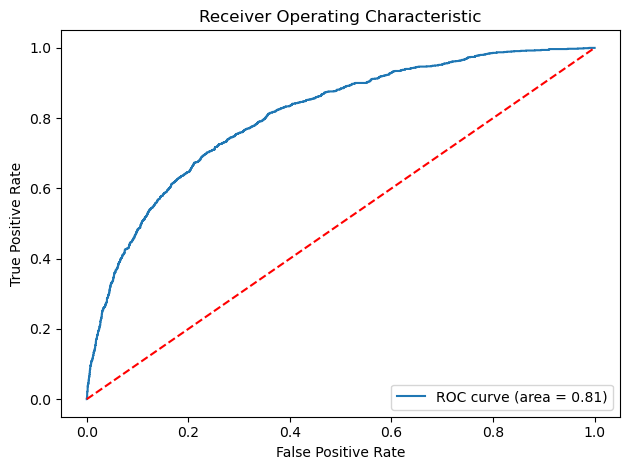

In [216]:
# Plot AUC-ROC curve
fpr, tpr, _ = roc_curve(y_val_lb, y_pred_grid)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_roc_grid)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

In [217]:
#optimal threshold for classification
y_pred_cutoff_grid = (y_pred_grid > 0.5)

### Classification Report

In [218]:
cr_grid = classification_report(y_val_lb, y_pred_cutoff_grid)
print(cr_grid)

              precision    recall  f1-score   support

           0       0.81      0.98      0.88      4135
           1       0.71      0.21      0.32      1202

    accuracy                           0.80      5337
   macro avg       0.76      0.59      0.60      5337
weighted avg       0.79      0.80      0.76      5337



In [219]:
model4_report = getReportMetrics(y_val_lb, y_pred_cutoff_grid, "Model-4-hyperparameter-tuned")

### Confusion Matrix

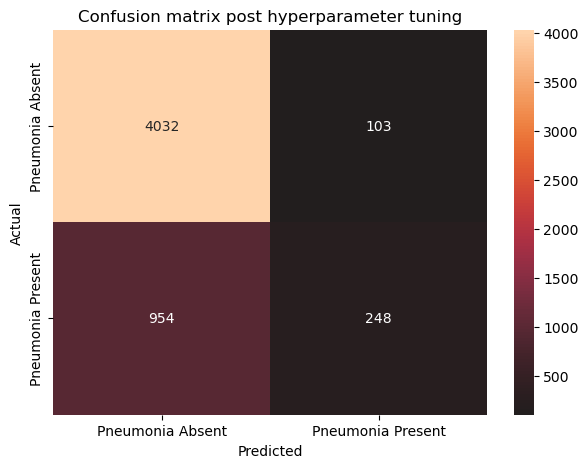

In [220]:
cm_grid = confusion_matrix(y_val_lb, y_pred_cutoff_grid, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_grid = pd.DataFrame(cm_grid, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix post hyperparameter tuning')
sns.heatmap(df_cm_grid, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [221]:
# Calculate precision-recall metrics
precision, recall, _ = precision_recall_curve(y_val_lb, y_pred_grid)
average_precision = average_precision_score(y_val_lb, y_pred_grid)

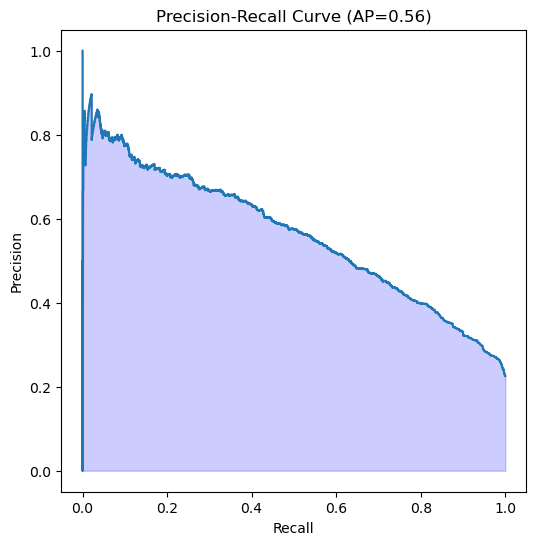

In [222]:
# Plot Precision-Recall curve
plt.figure(figsize=(6, 6))
plt.step(recall, precision, where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (AP={0:0.2f})'.format(average_precision))
plt.show()

#### Pickle the model and the results after hyper parameter tuning

In [223]:
saveModel(best_model,"pickle_files_models/grid_cv_model.pkl")
savePickle(history_grid, "history_grid.pkl")
savePickle(acc_grid_train, "pickle_files_models/acc_grid_train.pkl") 
savePickle(result4, "pickle_files_models/acc_grid_val.pkl") 
savePickle(cr_grid, "pickle_files_models/cr_grid.pkl")
savePickle(cm_grid, "pickle_files_models/cm_grid.pkl")
savePickle(model4_report, "model4_report.pkl")

INFO:tensorflow:Assets written to: ram://e06ffcdc-301c-4e73-8cc9-eff34135d195/assets


INFO:tensorflow:Assets written to: ram://e06ffcdc-301c-4e73-8cc9-eff34135d195/assets


INFO:tensorflow:Assets written to: ram://acd3308e-eb5e-49a4-b270-ec6ff0d7f4ab/assets


INFO:tensorflow:Assets written to: ram://acd3308e-eb5e-49a4-b270-ec6ff0d7f4ab/assets


'model4_report.pkl'

In [225]:
# Removing variables to free up some space
#del X, y, best_model

## Step 8: Apply Transfer Learning model for classification

### Model-5 Transfer Learning CNN network(VGG16)

**Model-5 Architecture Design**

- Transfer learning  - VGG16 discarded the last 1000 neuron layer 
- Number dense layers added: 3
- Nodes in the dense layers: 1024, 512, 256
- Fully connected layers: 1
- Activation function(s): relu in the dense layer, sigmoid in output layer
- Loss function: Binary cross-entropy
- Optimizers : adam
- learning rate : 0.001
- Batch size for training: 16
- Number of epochs :1

In [226]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [227]:
#import the VGG16 model and discards the last 1000 neuron layer.
model_tf = VGG16(input_shape=X_train_mat[0].shape, weights='imagenet',include_top=False)

x = model_tf.output
x = GlobalAveragePooling2D()(x) 

x = Dense(1024, activation='relu')(x) # add dense layers so that the model can learn more complex functions and classify for better results.
x = Dense(512, activation='relu')(x) #dense layer 2
x = Dense(256, activation='relu')(x) #dense layer 3
preds = Dense(1, activation='sigmoid')(x) #final layer 

model_vgg16 = Model(inputs=model_tf.input, outputs=preds)

# set the first 20 layers of the network to be non-trainable
for layer in model_vgg16.layers[:20]:
    layer.trainable=False
for layer in model_vgg16.layers[20:]:
    layer.trainable=True

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model_vgg16.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
model_vgg16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [228]:
#Fit the model
history_vgg16 = model_vgg16.fit(x=X_train_mat, y=y_train_lb, batch_size=16, epochs=5, validation_data=(X_val_mat, y_val_lb), verbose=1)

Epoch 1/5
1335/1335 [==============================] - 199s 148ms/step - loss: 0.4445 - accuracy: 0.7894 - val_loss: 0.4185 - val_accuracy: 0.8134
Epoch 2/5
1335/1335 [==============================] - 239s 179ms/step - loss: 0.4199 - accuracy: 0.8058 - val_loss: 0.4047 - val_accuracy: 0.8117
Epoch 3/5
1335/1335 [==============================] - 296s 222ms/step - loss: 0.4113 - accuracy: 0.8126 - val_loss: 0.4321 - val_accuracy: 0.7999
Epoch 4/5
1335/1335 [==============================] - 298s 223ms/step - loss: 0.4086 - accuracy: 0.8119 - val_loss: 0.4049 - val_accuracy: 0.8128
Epoch 5/5
1335/1335 [==============================] - 313s 235ms/step - loss: 0.4069 - accuracy: 0.8149 - val_loss: 0.4005 - val_accuracy: 0.8141


In [229]:
#print the accuracy of the train dataset
acc_vgg16_train = model_vgg16.evaluate(X_train_mat,y_train_lb)
print("Training Accuracy on vgg16 CNN model is", acc_vgg16_train[1])

668/668 [==============================] - 256s 383ms/step - loss: 0.3962 - accuracy: 0.8150
Training Accuracy on vgg16 CNN model is 0.8149622678756714


In [230]:
# Evaluate the model on the validation set
result5 = model_vgg16.evaluate(X_val_mat, y_val_lb)
print("Validation Accuracy on vgg16 CNN model is", result5[1])

167/167 [==============================] - 65s 391ms/step - loss: 0.4005 - accuracy: 0.8141
Validation Accuracy on vgg16 CNN model is 0.8141278028488159


In [231]:
#Prediction on the validation dataset
y_pred_vgg16 = model_vgg16.predict(X_val_mat)

167/167 [==============================] - 57s 342ms/step


In [232]:
# Calculate AUC-ROC
auc_roc_vgg16 = metrics.roc_auc_score(y_val_lb, y_pred_vgg16)
print(f"AUC-ROC: {auc_roc_vgg16}")

AUC-ROC: 0.8336325793166166


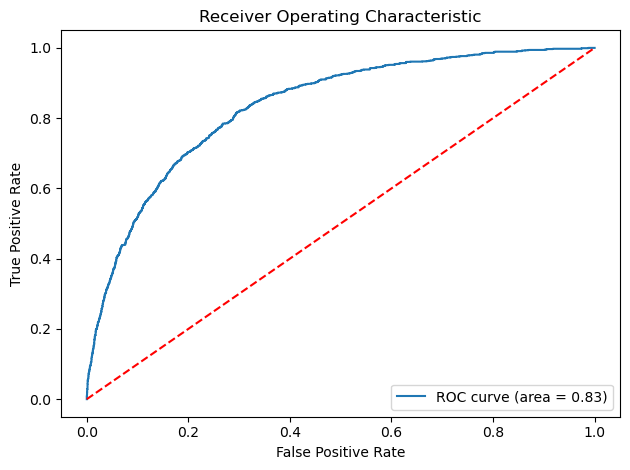

In [233]:
# Plot AUC-ROC curve
fpr, tpr, _ = roc_curve(y_val_lb, y_pred_vgg16)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_roc_vgg16)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

**Note**
- Since the basemodel `optimal threshold` cutoff was set to `0.5` we will be considering the same threshold for all subsequent model evaluation steps. 

In [234]:
#Optimal threshold for detection 
y_pred_vgg16_cutoff = (y_pred_vgg16 > 0.5)

### Classification Report

In [235]:
cr_vgg16 = classification_report(y_val_lb, y_pred_vgg16_cutoff)
print(cr_vgg16)

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      4135
           1       0.70      0.31      0.43      1202

    accuracy                           0.81      5337
   macro avg       0.76      0.63      0.66      5337
weighted avg       0.80      0.81      0.78      5337



In [236]:
model5_report = getReportMetrics(y_val_lb, y_pred_vgg16_cutoff, "Model-5-VGG16-CNN")

### Confusion Matrix

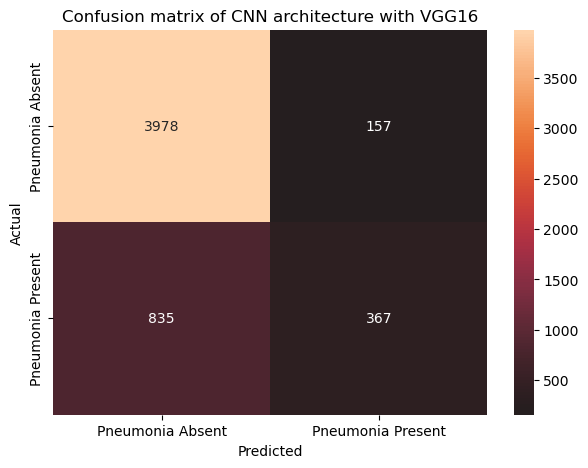

In [237]:
cm_vgg16 = confusion_matrix(y_val_lb, y_pred_vgg16_cutoff, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_vgg16 = pd.DataFrame(cm_vgg16, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of CNN architecture with VGG16')
sns.heatmap(df_cm_vgg16, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [238]:
# Calculate precision-recall metrics
precision, recall, _ = precision_recall_curve(y_val_lb, y_pred_vgg16)
average_precision = average_precision_score(y_val_lb, y_pred_vgg16)

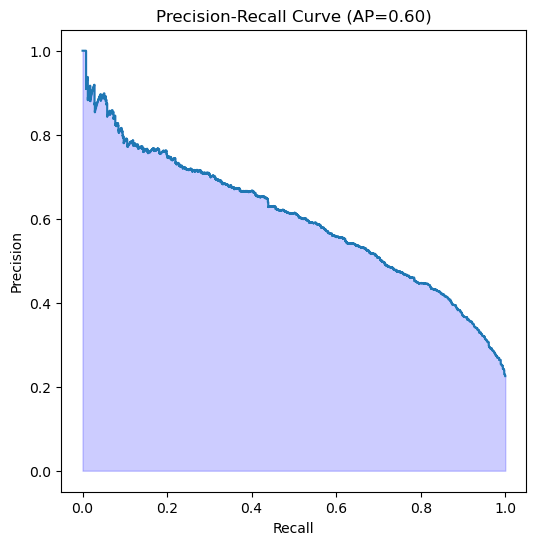

In [239]:
# Plot Precision-Recall curve
plt.figure(figsize=(6, 6))
plt.step(recall, precision, where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (AP={0:0.2f})'.format(average_precision))
plt.show()

#### Pickle the model and the results after applying VGG16 transfer learning

In [240]:
saveModel(model_vgg16,"pickle_files_models/model_vgg16.pkl")
savePickle(acc_vgg16_train, "pickle_files_models/acc_vgg16_train.pkl") 
savePickle(result5, "pickle_files_models/acc_vgg16_val.pkl") 
savePickle(cr_vgg16, "pickle_files_models/cr_vgg16.pkl")
savePickle(cm_vgg16, "pickle_files_models/cm_vgg16.pkl")
savePickle(model5_report, "model5_report.pkl")

INFO:tensorflow:Assets written to: ram://4922a1fb-c347-4f33-bf94-05c1f1d880cb/assets


INFO:tensorflow:Assets written to: ram://4922a1fb-c347-4f33-bf94-05c1f1d880cb/assets


'model5_report.pkl'

In [241]:
del model_vgg16

### Model-6 Transfer Learning using  ResNet50

**Model-6 Architecture Design**
- Appiled Image Augmentation techniques prior to creating the model.
- Number dense layers added: 1
- Nodes in the dense layers: 128
- Fully connected layers: 1
- Activation function(s): relu in the dense layer, sigmoid in output layer
- Loss function: Binary cross-entropy
- Hyper-parameter tuning:
  - optimizers : adam and rmsprop
  - learning rate : 1e-4, 1e-3, 1e-2
- Regularization - Dropout
- keras callbacks: early stopping
- Batch size for training:32
- Number of epochs :1

In [242]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [243]:
def train_model_with_hyperparameter_tuning(X_train_mat, y_train_lb, X_val_mat, y_val_lb, batch_size):
    # Step 1: Data Augmentation
    # Create an image data generator with augmentation
    train_datagen = ImageDataGenerator(
        rotation_range=10,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        vertical_flip=False
    )

    # Generate augmented training data
    train_generator = train_datagen.flow(X_train_mat, y_train_lb, batch_size=batch_size)

    # Step 2: Build the base model
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128,3))

    # Step 3: Freeze base model layers
    
    base_model.trainable = False

    # Step 4: Add custom classification head
    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    model = Model(base_model.input, x)

    # Step 5: Set hyperparameters for tuning
    def build_hypermodel(hp):
        hp_learning_rate = hp.Choice('learning_rate', values=[1e-4, 1e-3, 1e-2])
        hp_optimizer = hp.Choice('optimizer', values=['adam', 'rmsprop'])

        if hp_optimizer == 'adam':
            optimizer = Adam(learning_rate=hp_learning_rate)
        else:
            optimizer = RMSprop(learning_rate=hp_learning_rate)

        model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

        return model

    # Step 6: Early Stopping
    early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

    # Step 7: Define the hyperparameter search space
    tuner = Hyperband(
        build_hypermodel,
        objective='val_accuracy',
        max_epochs=5,
        factor=3,
        directory='tuner_directory',
        project_name='pneumonia_classification'
    )

    # Step 8: Train the model with hyperparameter tuning
    tuner.search(train_generator, validation_data=(X_val_mat, y_val_lb), callbacks=[early_stopping])

    # Step 9: Get the best model
    best_model = tuner.get_best_models(num_models=1)[0]

    return best_model

In [244]:
#Calling train_model_with_hyperparameter_tuning to get best model
batch_size = 32
resnet_best_model = train_model_with_hyperparameter_tuning(X_train_mat, y_train_lb, X_val_mat, y_val_lb, batch_size)

Trial 8 Complete [00h 14m 41s]
val_accuracy: 0.7747798562049866

Best val_accuracy So Far: 0.7747798562049866
Total elapsed time: 00h 56m 22s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


In [245]:
#print the accuracy of the train dataset
acc_resnet_train = resnet_best_model.evaluate(X_train_mat,y_train_lb)
print("Training Accuracy on ResNet-CNN model is", acc_resnet_train[1])

668/668 [==============================] - 87s 126ms/step - loss: 0.5019 - accuracy: 0.7747
Training Accuracy on ResNet-CNN model is 0.7746756076812744


In [246]:
# Evaluate the model on the validation set
result6 = resnet_best_model.evaluate(X_val_mat, y_val_lb)
print("Validation Accuracy on ResNet-CNN model is", result6[1])

167/167 [==============================] - 23s 140ms/step - loss: 0.5024 - accuracy: 0.7748
Validation Accuracy on ResNet-CNN model is 0.7747798562049866


In [247]:
#Prediction on the validation dataset
y_pred_resent = resnet_best_model.predict(X_val_mat)

167/167 [==============================] - 25s 141ms/step


In [248]:
# Calculate AUC-ROC
auc_roc_resnet = metrics.roc_auc_score(y_val_lb, y_pred_resent)
print(f"AUC-ROC: {auc_roc_resnet}")

AUC-ROC: 0.7128862214728777


#### ROC Curve

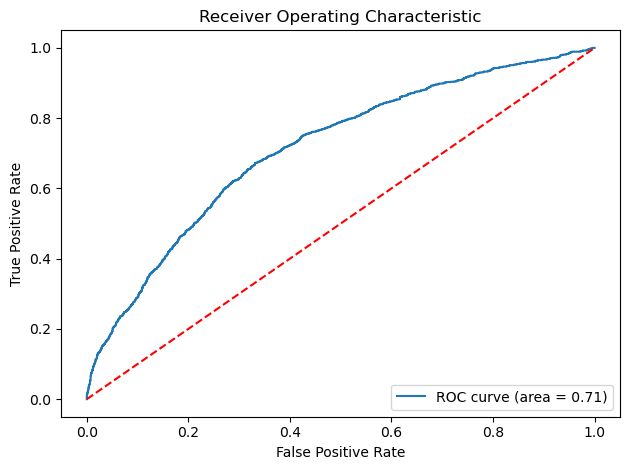

In [249]:
fpr, tpr, _ = roc_curve(y_val_lb, y_pred_resent)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_roc_resnet)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

In [250]:
#Optimal threshold for detection 
y_pred_resnet_cutoff = (y_pred_resent > 0.5)

### Classification Report

In [251]:
cr_resnet = classification_report(y_val_lb, y_pred_resnet_cutoff)
print(cr_resnet)

              precision    recall  f1-score   support

           0       0.77      1.00      0.87      4135
           1       0.00      0.00      0.00      1202

    accuracy                           0.77      5337
   macro avg       0.39      0.50      0.44      5337
weighted avg       0.60      0.77      0.68      5337



In [252]:
model6_report = getReportMetrics(y_val_lb, y_pred_resnet_cutoff, "Model-6-ResNet-CNN")

### Confusion Matrix

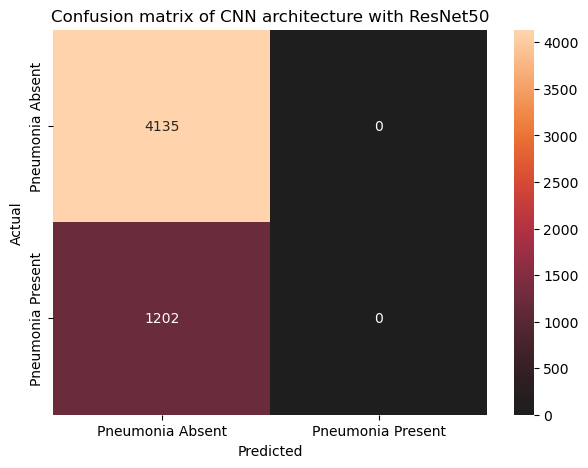

In [253]:
cm_resnet = confusion_matrix(y_val_lb, y_pred_resnet_cutoff, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_resnet = pd.DataFrame(cm_resnet, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of CNN architecture with ResNet50')
sns.heatmap(df_cm_resnet, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [254]:
# Calculate precision-recall metrics
precision, recall, _ = precision_recall_curve(y_val_lb, y_pred_resent)
average_precision = average_precision_score(y_val_lb, y_pred_resent)

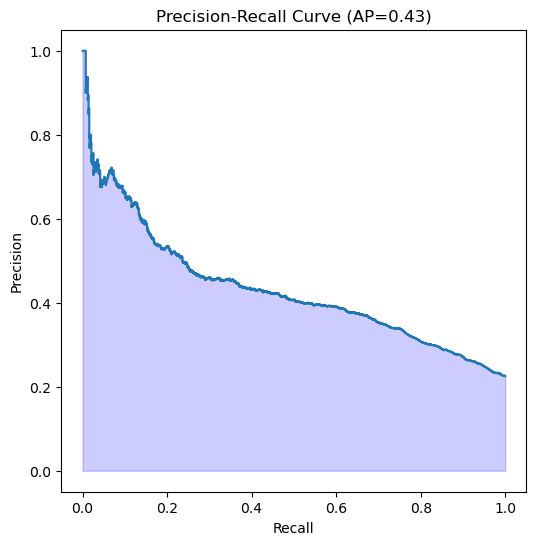

In [255]:
# Plot Precision-Recall curve
plt.figure(figsize=(6, 6))
plt.step(recall, precision, where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (AP={0:0.2f})'.format(average_precision))
plt.show()

#### Pickle the model and the results after applying ResNet50 transfer learning

In [256]:
saveModel(resnet_best_model,"pickle_files_models/model_resnet.pkl")
savePickle(acc_resnet_train, "pickle_files_models/acc_resnet_train.pkl") 
savePickle(result6, "pickle_files_models/acc_resnet_val.pkl") 
savePickle(cr_resnet, "pickle_files_models/cr_resnet.pkl")
savePickle(cm_resnet, "pickle_files_models/cm_resnet.pkl")
savePickle(model6_report, "model6_report.pkl")

INFO:tensorflow:Assets written to: ram://3e424022-bc46-4302-af0e-ef46a2375352/assets


INFO:tensorflow:Assets written to: ram://3e424022-bc46-4302-af0e-ef46a2375352/assets


'model6_report.pkl'

In [257]:
del resnet_best_model, X_train_mat, X_val_mat, y_train_lb, y_val_lb

In [258]:
tf.keras.backend.clear_session()
gc.collect()

1027181

In [271]:
savePickle(history2,"pickle_files_models/history2.pkl")

INFO:tensorflow:Assets written to: ram://cfb815eb-51e8-4010-8b95-a85c25110c0d/assets


INFO:tensorflow:Assets written to: ram://cfb815eb-51e8-4010-8b95-a85c25110c0d/assets


'pickle_files_models/history2.pkl'

In [258]:
tf.keras.backend.clear_session()
gc.collect()

1027181

**Observations**
- From the above analysis we could observe that performing hyperparameter tuning or transfer learning methods has not improved the model accuracy compared to our base model.
- Applying image augmentation to the dataset seems to be impacting the overall performance as observed in the ResNet50 CNN architecture.
- Class balancing strategies applied in Model-3 does not improve the model performance either.
- We would like to perform the above analysis (hyperparameter tuning and transfer learning) on a dataset that is `exclusively Normal and Lung opacity class`.
- This will help in reducing the sample size and also avoiding the potential impact of the images belonging to "No Lung Opacity/Not Normal" class in mis-classification. 

## Sampling dataset w.r.t Normal and Lung Opacity class

In [259]:
X = train_master_class[['filename']]
y = train_master_class[['Target']]

In [260]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [261]:
X_train_map = train_master_class[((train_master_class['class']=='Normal') | (train_master_class['class']=='Lung Opacity')) &((train_master_class['filename'].isin(X_train['filename'])))]

In [262]:
X_val_map = train_master_class[((train_master_class['class']=='Normal') | (train_master_class['class']=='Lung Opacity')) &((train_master_class['filename'].isin(X_val['filename'])))]

## Fetching the resized pixel matrix

In [263]:
#Fetch the resized pixel array of the train dataset
X_train_mat_ss = np.array([resizedRGBPixelArray(i, 128, 128) for i in X_train_map['filename']])

In [264]:
#Target label of the X-train data
y_train_lb_ss = np.array(X_train_map['Target'])

In [265]:
#Fetch the resized pixel array of the validation dataset
X_val_mat_ss = np.array([resizedRGBPixelArray(i, 128, 128) for i in X_val_map['filename']])

In [266]:
#Target label of the X-val data
y_val_lb_ss = np.array(X_val_map['Target'])

In [267]:
print("the length of X train and y train", X_train_mat_ss.shape, y_train_lb_ss.shape)
print("the length of X val and y val", X_val_mat_ss.shape, y_val_lb_ss.shape)

the length of X train and y train (11899, 128, 128, 3) (11899,)
the length of X val and y val (2964, 128, 128, 3) (2964,)


## Redesign base model with only Normal and Lung opacity data

### Subsampled CNN basemodel (Model-7)

**Model-7 Architecture Design**
- Number of convolution layers: 3
- Number of nodes in the convolution layers: 32, 64, 96
- Fully connected layers:2
- Number of nodes in the fully connected layers: 64, 32
- Output layer :1 and Node :1
- Activation function(s): relu in the convolution layer, sigmoid in output layer
- Kernel size: 3
- strides: 1 in each of the convolution layer
- Optimizer: rmsprop
- Learning_rate : 0.0001
- Loss function: Binary cross-entropy
- Number of Epochs for training: 5
- Batch size for training: 16

In [268]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [269]:
model_2_ss = Sequential()

#convolution layers
model_2_ss.add(Convolution2D(filters = 32, kernel_size = 3, strides=1, input_shape = (128,128,3)))
model_2_ss.add(Activation('relu'))
model_2_ss.add(MaxPooling2D(pool_size = 2))


model_2_ss.add(Convolution2D(filters = 64, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_2_ss.add(Activation('relu'))
model_2_ss.add(MaxPooling2D(pool_size = 2))


model_2_ss.add(Convolution2D(filters = 96, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
model_2_ss.add(Activation('relu'))
model_2_ss.add(MaxPooling2D(pool_size = 2))

model_2_ss.add(Flatten())

#Fully connected layers
model_2_ss.add(Dense(units = 64))
model_2_ss.add(Activation('relu'))

model_2_ss.add(Dense(units = 32))
model_2_ss.add(Activation('relu'))

#output layer
model_2_ss.add(Dense(units = 1))
model_2_ss.add(Activation('sigmoid')) 

In [270]:
opt = optimizers.RMSprop(learning_rate= 0.0001)
model_2_ss.compile(optimizer=opt, loss = 'binary_crossentropy', metrics = ['accuracy'])
model_2_ss.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 activation (Activation)     (None, 126, 126, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 activation_1 (Activation)   (None, 61, 61, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                    

In [272]:
history_ss = model_2_ss.fit(X_train_mat_ss, y_train_lb_ss, validation_data=(X_val_mat_ss, y_val_lb_ss), epochs=5, verbose=1, batch_size = 16, shuffle=False)

Epoch 1/5
744/744 [==============================] - 36s 44ms/step - loss: 0.4273 - accuracy: 0.8120 - val_loss: 0.4052 - val_accuracy: 0.8401
Epoch 2/5
744/744 [==============================] - 27s 36ms/step - loss: 0.3589 - accuracy: 0.8554 - val_loss: 0.3647 - val_accuracy: 0.8596
Epoch 3/5
744/744 [==============================] - 27s 36ms/step - loss: 0.3330 - accuracy: 0.8686 - val_loss: 0.3397 - val_accuracy: 0.8661
Epoch 4/5
744/744 [==============================] - 27s 36ms/step - loss: 0.3129 - accuracy: 0.8776 - val_loss: 0.3209 - val_accuracy: 0.8769
Epoch 5/5
744/744 [==============================] - 27s 36ms/step - loss: 0.2949 - accuracy: 0.8849 - val_loss: 0.3045 - val_accuracy: 0.8809


In [273]:
#print the accuracy of the train dataset
acc_base_02_ss_train = model_2_ss.evaluate(X_train_mat_ss, y_train_lb_ss)
print("Training Accuracy of the subsampled base model is", acc_base_02_ss_train[1])

372/372 [==============================] - 13s 33ms/step - loss: 0.2798 - accuracy: 0.8915
Training Accuracy of the subsampled base model is 0.8915035128593445


In [274]:
#evaluate the validation dataset
result7 = model_2_ss.evaluate(X_val_mat_ss,y_val_lb_ss)
print("Validation Accuracy of the base model with subsampled data is", result7[1])

93/93 [==============================] - 2s 24ms/step - loss: 0.3045 - accuracy: 0.8809
Validation Accuracy of the base model with subsampled data is 0.8809041976928711


In [275]:
#Prediction on the validation dataset
y_val_predict_02_ss =  model_2_ss.predict(X_val_mat_ss)

93/93 [==============================] - 2s 21ms/step


In [276]:
# Calculate AUC-ROC
auc_roc_basemodel_ss = metrics.roc_auc_score(y_val_lb_ss, y_val_predict_02_ss)
print(f"AUC-ROC: {auc_roc_basemodel_ss}")

AUC-ROC: 0.9415909163879346


#### ROC Curve

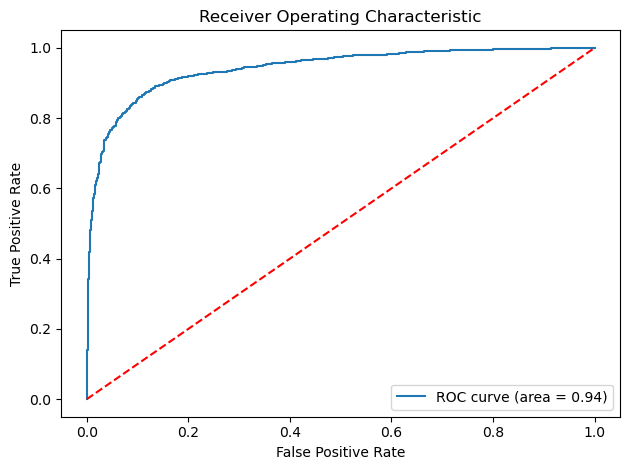

In [277]:
fpr, tpr,thresholds = roc_curve(y_val_lb_ss, y_val_predict_02_ss)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_roc_basemodel_ss)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

### Finding the optimal threshold on the ROC-AUC curve

In [278]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print("the optimal threshold value is", round(optimal_threshold,2))
print("the true positive rate at optimal threshold", round(tpr[optimal_idx],2))
print("the false positive rate at optimal threshold", round(fpr[optimal_idx],2))

the optimal threshold value is 0.34
the true positive rate at optimal threshold 0.86
the false positive rate at optimal threshold 0.1


In [279]:
#Optimal threshold for detection 
y_pred_basemodel_ss_cutoff = (y_val_predict_02_ss > 0.5)

### Classification Report

In [280]:
cr_basemodel_ss = classification_report(y_val_lb_ss, y_pred_basemodel_ss_cutoff)
print(cr_basemodel_ss)

              precision    recall  f1-score   support

           0       0.87      0.94      0.90      1762
           1       0.90      0.80      0.84      1202

    accuracy                           0.88      2964
   macro avg       0.88      0.87      0.87      2964
weighted avg       0.88      0.88      0.88      2964



In [281]:
model7_report = getReportMetrics(y_val_lb_ss, y_pred_basemodel_ss_cutoff, "Model-7-subsampled-baseCNN")

### Confusion Matrix

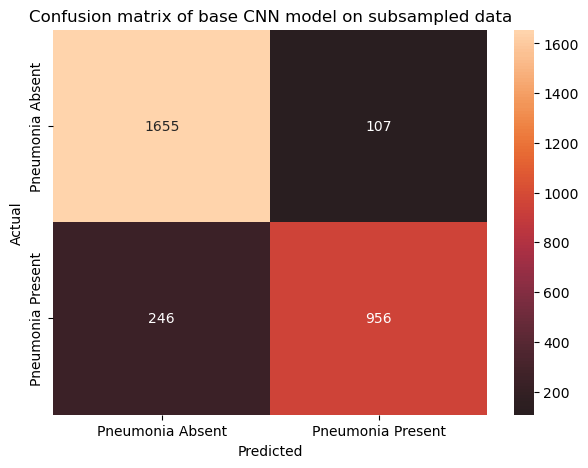

In [282]:
cm_basemodel_ss = confusion_matrix(y_val_lb_ss, y_pred_basemodel_ss_cutoff, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_basemodel_ss = pd.DataFrame(cm_basemodel_ss, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of base CNN model on subsampled data')
sns.heatmap(df_cm_basemodel_ss, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Pickle the model and the results after running the base model with subsampled data

In [284]:
saveModel(model_2_ss,"pickle_files_models/model2_ss.pkl")
savePickle(acc_base_02_ss_train, "pickle_files_models/acc_base_02_ss_train.pkl") 
savePickle(result7, "pickle_files_models/acc_val_basemodel_ss.pkl") 
savePickle(cr_basemodel_ss, "pickle_files_models/cr_basemodel_ss.pkl")
savePickle(cm_basemodel_ss, "pickle_files_models/cm_basemodel_ss.pkl")
savePickle(model7_report, "model7_report.pkl")
savePickle(history_ss,"history_ss.pkl")

INFO:tensorflow:Assets written to: ram://8df084c0-98c0-49c9-b5e1-efacb29c0ad8/assets


INFO:tensorflow:Assets written to: ram://8df084c0-98c0-49c9-b5e1-efacb29c0ad8/assets


INFO:tensorflow:Assets written to: ram://d3c95987-fc13-4249-8a8a-d2b962367070/assets


INFO:tensorflow:Assets written to: ram://d3c95987-fc13-4249-8a8a-d2b962367070/assets


'history_ss.pkl'

In [285]:
del model_2_ss

In [286]:
tf.keras.backend.clear_session()
gc.collect()

23759

## Fine tune the trained basic CNN models for classification with subsampled data

**Model-8 Architecture design**
- Number of convolution layers: 3
- Number of nodes in the convolution layers: 32, 64, 96
- Fully connected layers:2
- Number of nodes in the fully connected layers: 64, 32
- Output layer :1 and Node :1
- Activation function(s): relu in the convolution layer, sigmoid in output layer
- Kernel size: 3
- strides: 1 in each of the convolution layer
- GridsearchCv with 2 fold cross validation
- Keras classifier for parameter tuning
- Optimizer: adam, rmsprop
- Batch size : 16, 32
- Learning_rate : 0.01, 0.001
- Loss function: Binary cross-entropy
- Number of Epochs for training: 1

In [287]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [288]:
def create_model(optimizer='rmsprop', lr=0.0001): 
    model_tuned = Sequential()
    
    #convolution layers
    model_tuned.add(Convolution2D(filters = 32, kernel_size = 3, strides=1, input_shape = (128,128,3)))
    model_tuned.add(Activation('relu'))
    model_tuned.add(MaxPooling2D(pool_size = 2))
    
    
    model_tuned.add(Convolution2D(filters = 64, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
    model_tuned.add(Activation('relu'))
    model_tuned.add(MaxPooling2D(pool_size = 2))
    
    
    model_tuned.add(Convolution2D(filters = 96, kernel_size = 3, strides=1, kernel_initializer="he_uniform"))
    model_tuned.add(Activation('relu'))
    model_tuned.add(MaxPooling2D(pool_size = 2))
    
    model_tuned.add(Flatten())
    
    #Fully connected layers
    model_tuned.add(Dense(units = 64))
    model_tuned.add(Activation('relu'))
    
    model_tuned.add(Dense(units = 32))
    model_tuned.add(Activation('relu'))
    
    #output layer
    model_tuned.add(Dense(units = 1))
    model_tuned.add(Activation('sigmoid'))

    #compile model
    if optimizer == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    elif optimizer == 'rmsprop':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=lr)
    
    model_tuned.compile(optimizer=optimizer,
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model_tuned

In [289]:
model_tuned = KerasClassifier(build_fn=create_model, epochs=1, batch_size=16, verbose=1)

# Define the hyperparameters and regularization parameters to tune
param_grid = {
    'optimizer': ['adam', 'rmsprop'],
    'batch_size':[16, 32],
    "lr":[0.01,0.001]

}
kfold_splits = 2

# Perform grid search
grid = GridSearchCV(estimator=model_tuned, param_grid=param_grid, cv=kfold_splits)
grid_result = grid.fit(X_train_mat_ss, y_train_lb_ss)


# Print the best results
print("Best parameters: ", grid_result.best_params_)
print("Best accuracy: ", grid_result.best_score_)
print()
print('Tuning with best parameters')
print()

# Get the best parameters from GridSearchCV
best_params = grid_result.best_params_

744/744 [==============================] - 31s 40ms/step - loss: 0.4242 - accuracy: 0.8152
Best parameters:  {'batch_size': 16, 'lr': 0.001, 'optimizer': 'adam'}
Best accuracy:  0.839649885892868

Tuning with best parameters



In [290]:
# Create the model with the best parameters
best_model_tuned_ss = create_model(optimizer=best_params['optimizer'],lr=best_params['lr'])

In [291]:
history_tuned_ss = best_model_tuned_ss.fit(X_train_mat_ss, y_train_lb_ss, epochs=1, batch_size=best_params['batch_size'], verbose=1)

744/744 [==============================] - 31s 39ms/step - loss: 0.4109 - accuracy: 0.8243


In [292]:
#print the accuracy of the train dataset
acc_tuned_ss_train = best_model_tuned_ss.evaluate(X_train_mat_ss, y_train_lb_ss)
print("Training Accuracy of the subsampled hyper-tuned basemodel is", acc_tuned_ss_train[1])

372/372 [==============================] - 12s 32ms/step - loss: 0.3506 - accuracy: 0.8578
Training Accuracy of the subsampled hyper-tuned basemodel is 0.8578031659126282


In [293]:
#evaluate the validation dataset
result8 = best_model_tuned_ss.evaluate(X_val_mat_ss, y_val_lb_ss)
print("Validation Accuracy of the subsampled hyper-tuned base data is", result8[1])

93/93 [==============================] - 3s 33ms/step - loss: 0.3526 - accuracy: 0.8627
Validation Accuracy of the subsampled hyper-tuned base data is 0.8626855611801147


In [294]:
#Prediction on the validation dataset
y_val_predict_tuned_ss =  best_model_tuned_ss.predict(X_val_mat_ss)

93/93 [==============================] - 3s 30ms/step


In [295]:
# Calculate AUC-ROC
auc_roc_bm_tuned_ss = metrics.roc_auc_score(y_val_lb_ss, y_val_predict_tuned_ss)
print(f"AUC-ROC: {auc_roc_bm_tuned_ss}")

AUC-ROC: 0.9195174142226068


#### ROC Curve

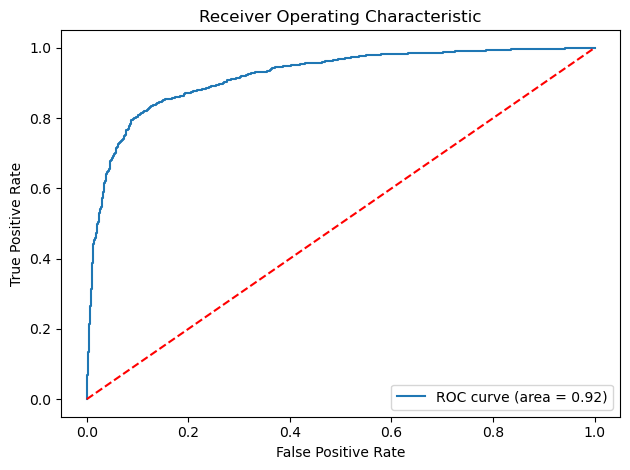

In [296]:
fpr, tpr, thresholds = roc_curve(y_val_lb_ss, y_val_predict_tuned_ss)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_roc_bm_tuned_ss)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

In [297]:
#Optimal threshold for detection 
y_pred_tuned_ss_cutoff = (y_val_predict_tuned_ss > 0.5)

### Classification Report

In [298]:
cr_tuned_ss = classification_report(y_val_lb_ss, y_pred_tuned_ss_cutoff)
print(cr_tuned_ss)

              precision    recall  f1-score   support

           0       0.86      0.91      0.89      1762
           1       0.86      0.79      0.82      1202

    accuracy                           0.86      2964
   macro avg       0.86      0.85      0.86      2964
weighted avg       0.86      0.86      0.86      2964



In [299]:
model8_report = getReportMetrics(y_val_lb_ss, y_pred_tuned_ss_cutoff, "Model-8-subsampled-hyperparameter-tuned")

### Confusion Matrix

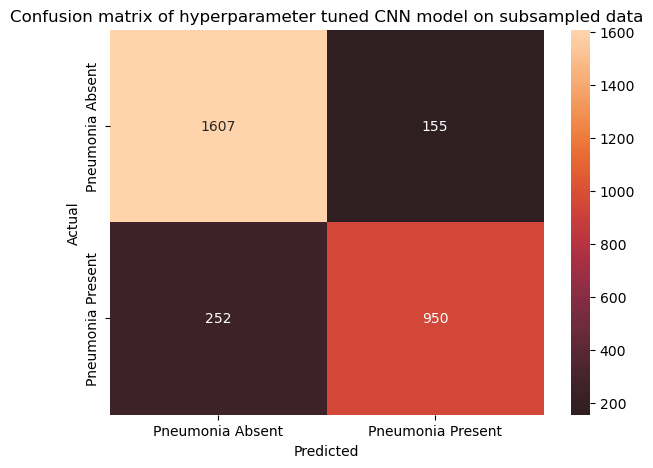

In [300]:
cm_tune_ss = confusion_matrix(y_val_lb_ss, y_pred_tuned_ss_cutoff, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_tuned_ss = pd.DataFrame(cm_tune_ss, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of hyperparameter tuned CNN model on subsampled data')
sns.heatmap(df_cm_tuned_ss, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Pickle the model and the results after running the hyperparameter tuned model with subsampled data

In [301]:
saveModel(best_model_tuned_ss,"pickle_files_models/best_model_tuned_ss.pkl")
savePickle(acc_tuned_ss_train, "pickle_files_models/acc_tuned_ss_train.pkl") 
savePickle(result8, "pickle_files_models/acc_val_tuned_ss.pkl") 
savePickle(cr_tuned_ss, "pickle_files_models/cr_tuned_ss.pkl")
savePickle(cm_tune_ss, "pickle_files_models/cm_tune_ss.pkl")
savePickle(model8_report, "model8_report.pkl")
savePickle(history_tuned_ss,"history_tuned_ss.pkl")

INFO:tensorflow:Assets written to: ram://09fc7917-8f87-41dc-ab33-e6e61bcd24c4/assets


INFO:tensorflow:Assets written to: ram://09fc7917-8f87-41dc-ab33-e6e61bcd24c4/assets


INFO:tensorflow:Assets written to: ram://214ca42f-9708-4d97-8deb-1ff60365b164/assets


INFO:tensorflow:Assets written to: ram://214ca42f-9708-4d97-8deb-1ff60365b164/assets


'history_tuned_ss.pkl'

In [302]:
del best_model_tuned_ss, grid_result

In [303]:
tf.keras.backend.clear_session()
gc.collect()

23759

## Apply transfer learning model for classification on the subsampled data

**Model-9 Architecture Design**

- Transfer learning using VGG16, discarded the last 1000 neuron layer 
- Number dense layers added: 3
- Nodes in the dense layers: 1024, 512, 256
- Fully connected layers: 1
- Activation function(s): relu in the dense layer, sigmoid in output layer
- Loss function: Binary cross-entropy
- Optimizers : adam
- learning rate : 0.001
- Batch size for training: 16
- Number of epochs:5

In [304]:
backend.clear_session()
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [305]:
model_tf_ss = VGG16(input_shape=X_train_mat_ss[0].shape, weights='imagenet', include_top=False) #imports the VGG16 model and discards the last 1000 neuron layer.

x = model_tf_ss.output
x = GlobalAveragePooling2D()(x) # Optional
x = Dense(1024, activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dense(512, activation='relu')(x) #dense layer 2
x = Dense(256, activation='relu')(x) #dense layer 3
preds = Dense(1, activation='sigmoid')(x) #final layer 

model_tf_vgg16_ss = Model(inputs=model_tf_ss.input, outputs=preds)

# set the first 20 layers of the network to be non-trainable
for layer in model_tf_vgg16_ss.layers[:20]:
    layer.trainable=False
for layer in model_tf_vgg16_ss.layers[20:]:
    layer.trainable=True

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model_tf_vgg16_ss.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

model_tf_vgg16_ss.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [306]:
history_tf_vgg16_ss = model_tf_vgg16_ss.fit(x=X_train_mat_ss, y=y_train_lb_ss, batch_size=16, epochs=5, validation_data=(X_val_mat_ss, y_val_lb_ss), verbose=1)

Epoch 1/5
744/744 [==============================] - 105s 139ms/step - loss: 0.3546 - accuracy: 0.8549 - val_loss: 0.2958 - val_accuracy: 0.8809
Epoch 2/5
744/744 [==============================] - 125s 168ms/step - loss: 0.3061 - accuracy: 0.8773 - val_loss: 0.3191 - val_accuracy: 0.8789
Epoch 3/5
744/744 [==============================] - 167s 224ms/step - loss: 0.2870 - accuracy: 0.8868 - val_loss: 0.2758 - val_accuracy: 0.8957
Epoch 4/5
744/744 [==============================] - 159s 213ms/step - loss: 0.2817 - accuracy: 0.8861 - val_loss: 0.2959 - val_accuracy: 0.8880
Epoch 5/5
744/744 [==============================] - 161s 216ms/step - loss: 0.2769 - accuracy: 0.8902 - val_loss: 0.2864 - val_accuracy: 0.8930


In [307]:
#print the accuracy of the train dataset
acc_vgg16_ss_train = model_tf_vgg16_ss.evaluate(X_train_mat_ss, y_train_lb_ss)
print("Training Accuracy of the CNN model with transfer learning is", acc_vgg16_ss_train[1])

372/372 [==============================] - 84s 222ms/step - loss: 0.2747 - accuracy: 0.8940
Training Accuracy of the CNN model with transfer learning is 0.8940247297286987


In [308]:
#evaluate the validation dataset
result9 = model_tf_vgg16_ss.evaluate(X_val_mat_ss, y_val_lb_ss)
print("Validation Accuracy of the CNN model with transfer learning is", result9[1])

93/93 [==============================] - 26s 277ms/step - loss: 0.2864 - accuracy: 0.8930
Validation Accuracy of the CNN model with transfer learning is 0.893049955368042


In [309]:
#Prediction on the validation dataset
y_val_predict_vgg16_ss =  model_tf_vgg16_ss.predict(X_val_mat_ss)

93/93 [==============================] - 29s 304ms/step


In [310]:
# Calculate AUC-ROC
auc_roc_vgg16_ss = metrics.roc_auc_score(y_val_lb_ss, y_val_predict_vgg16_ss)
print(f"AUC-ROC: {auc_roc_vgg16_ss}")

AUC-ROC: 0.9503494931829473


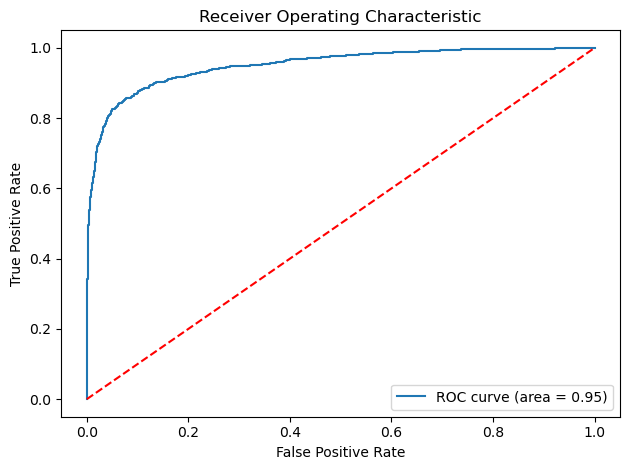

In [311]:
fpr, tpr, thresholds = roc_curve(y_val_lb_ss, y_val_predict_vgg16_ss)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_roc_vgg16_ss)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

In [312]:
#Optimal threshold for detection 
y_val_pred_vgg16_ss_cutoff = (y_val_predict_vgg16_ss > 0.5)

### Classification Report

In [313]:
cr_vgg16_ss = classification_report(y_val_lb_ss, y_val_pred_vgg16_ss_cutoff)
print(cr_vgg16_ss)

              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1762
           1       0.93      0.79      0.86      1202

    accuracy                           0.89      2964
   macro avg       0.90      0.88      0.89      2964
weighted avg       0.90      0.89      0.89      2964



In [314]:
model9_report = getReportMetrics(y_val_lb_ss, y_val_pred_vgg16_ss_cutoff, "Model-9-subsampled-VGG16-CNN")

### Confusion Matrix

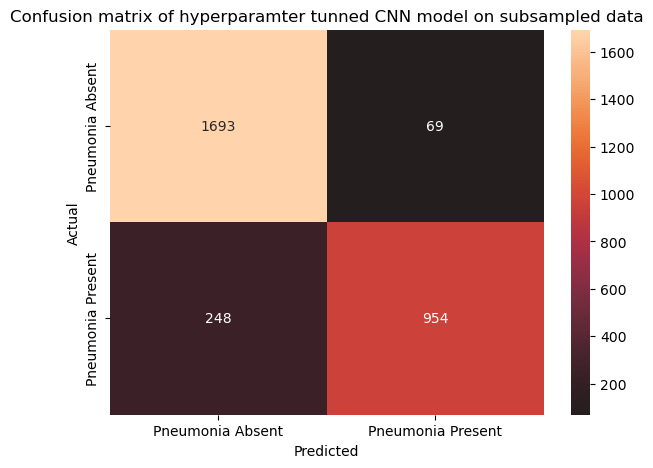

In [315]:
cm_vgg16_ss = confusion_matrix(y_val_lb_ss, y_val_pred_vgg16_ss_cutoff, labels=[0,1])
#Plot heatmap for confusion matrix
df_cm_vgg16_ss = pd.DataFrame(cm_vgg16_ss, index = [i for i in [0,1]],
                  columns = [i for i in ['Pneumonia Absent', 'Pneumonia Present']])
plt.figure(figsize = (7,5))
plt.title('Confusion matrix of hyperparamter tunned CNN model on subsampled data')
sns.heatmap(df_cm_vgg16_ss, annot=True ,fmt='g', center=1, yticklabels=['Pneumonia Absent', 'Pneumonia Present']);
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Pickle the model and the results after running the hyperparameter tuned model with subsampled data

In [316]:
saveModel(model_tf_vgg16_ss,"pickle_files_models/model_tf_vgg16_ss.pkl")
savePickle(acc_vgg16_ss_train, "pickle_files_models/acc_vgg16_ss_train.pkl") 
savePickle(result9, "pickle_files_models/acc_val_vgg16_ss.pkl") 
savePickle(cr_vgg16_ss, "pickle_files_models/cr_vgg16_ss.pkl")
savePickle(cm_vgg16_ss, "pickle_files_models/cm_vgg16_ss.pkl")
savePickle(model9_report, "model9_report.pkl")
savePickle(history_tf_vgg16_ss, "history_tf_vgg16_ss.pkl")

INFO:tensorflow:Assets written to: ram://869e0fd3-aa79-468f-8515-669ce63bda78/assets


INFO:tensorflow:Assets written to: ram://869e0fd3-aa79-468f-8515-669ce63bda78/assets


INFO:tensorflow:Assets written to: ram://1a90e7ce-f375-4a48-84c7-f18e42da16d1/assets


INFO:tensorflow:Assets written to: ram://1a90e7ce-f375-4a48-84c7-f18e42da16d1/assets


'history_tf_vgg16_ss.pkl'

## Compare accuracy of all the classification models

In [317]:
#Summary of all the models showing train and validation accuracies
model_summary = pd.DataFrame({
    "Model" : ['Model-1','Model-2','Model-3', 'Model-4-hyperparameter-tunedCNN','Model-5-VGG16-CNN','Model-6-ResNet-CNN',
               'Model-7-subsampled-baseCNN','Model-8-subsampled-hyperparameter-tuned', 'Model-9-subsampled-VGG16-CNN'],
    "Training Accuracy": [acc_base_01_train[1],acc_base_02_train[1],acc_base_03_train[1], acc_grid_train[1],acc_vgg16_train[1], acc_resnet_train[1], acc_base_02_ss_train[1], acc_tuned_ss_train[1], 
acc_vgg16_ss_train[1]],
    "Validation Accuracy": [result1[1], result2[1], result3[1], result4[1], result5[1], result6[1], result7[1], result8[1], result9[1]] 
}).sort_values(by='Validation Accuracy', ascending=False).reset_index(drop=True)
model_summary

,Model,Training Accuracy,Validation Accuracy
0,Model-9-subsampled-VGG16-CNN,0.894025,0.893050
1,Model-7-subsampled-baseCNN,0.891504,0.880904
2,Model-8-subsampled-hyperparameter-tuned,0.857803,0.862686
3,Model-5-VGG16-CNN,0.814962,0.814128
4,Model-2,0.816977,0.810193
5,Model-4-hyperparameter-tunedCNN,0.800581,0.801949
6,Model-1,0.878344,0.795953
7,Model-6-ResNet-CNN,0.774676,0.774780
8,Model-3,0.500052,0.499792


In [318]:
savePickle(model_summary, "pickle_files_models/model_summary.pkl")

'pickle_files_models/model_summary.pkl'

## Compare other performance metrics based on the classification report¶

In [319]:
reports = [ model1_report, model2_report, model3_report, model4_report, model5_report, 
  model6_report, model7_report, model8_report, model9_report
]

In [320]:
cols = ['precision', 'recall', 'f1-score', 'support', 'Model', 'Target']
performance_summary = pd.concat(
    [pd.DataFrame(reportVar, columns=cols) for reportVar in reports]
).reset_index(drop=True).sort_values(by=['Target','f1-score'], ascending=False).reset_index(drop=True)

In [321]:
performance_summary

,precision,recall,f1-score,support,Model,Target
0,0.932551,0.793677,0.857528,1202.0,Model-9-subsampled-VGG16-CNN,1
1,0.899341,0.795341,0.844150,1202.0,Model-7-subsampled-baseCNN,1
2,0.859729,0.790349,0.823580,1202.0,Model-8-subsampled-hyperparameter-tuned,1
3,0.583407,0.549917,0.566167,1202.0,Model-2,1
4,0.562708,0.421797,0.482168,1202.0,Model-1,1
5,0.700382,0.305324,0.425261,1202.0,Model-5-VGG16-CNN,1
6,0.706553,0.206323,0.319382,1202.0,Model-4-hyperparameter-tuned,1
7,0.000000,0.000000,0.000000,1203.0,Model-3,1
8,0.000000,0.000000,0.000000,1202.0,Model-6-ResNet-CNN,1
9,0.872231,0.960840,0.914394,1762.0,Model-9-subsampled-VGG16-CNN,0


In [322]:
savePickle(performance_summary, "pickle_files_models/performance_summary.pkl")

'pickle_files_models/performance_summary.pkl'

**Observations**
- Upon comparison of the accuracy matrix as well as other performance scores, it is observed that **Model-9** has a `higher accuracy` score followed by **Model-7** and **Model-8**. The `recall` scores for `Target class-1` for these 3 models are `almost similar` but model-9 has a slightly `higher precision` compared to Model-7 and Model-8.
- Similarly, for target class-0 the recall for Model-9 is higher compared to the other 2 models.
- Based on these observations we will perform the training Vs validation loss for these top models and compare with our base model (Model-2) created as part of Milestone-1 for class prediction.

### Perform training Vs Validation loss for the top 2 models and compare with the base model (Model-2)

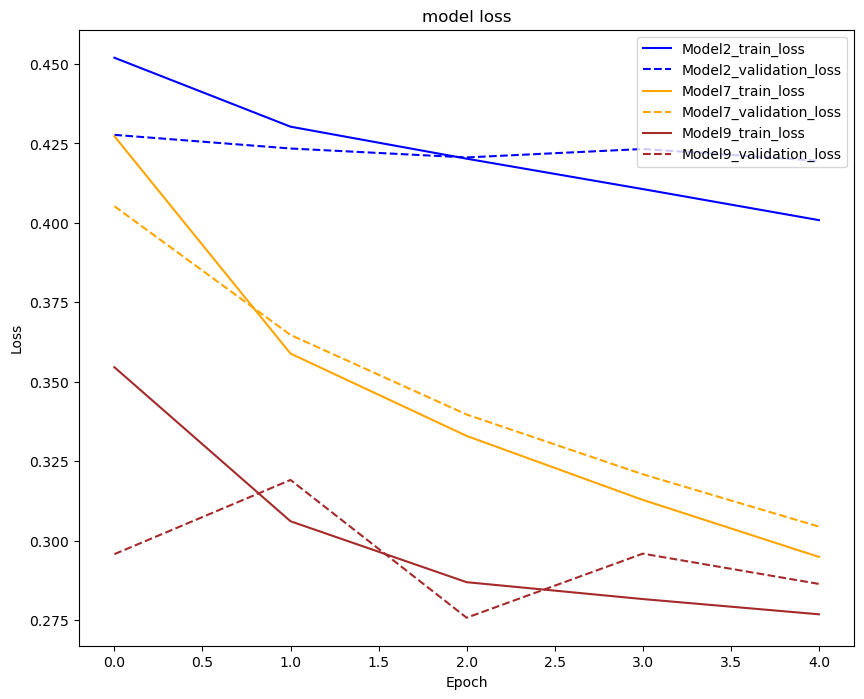

In [333]:
#Plotting Train Loss vs Validation Loss
plt.figure(figsize=(10,8))
plt.plot(history2.history['loss'], color="blue")
plt.plot(history2.history['val_loss'], color="blue", linestyle="dashed")
plt.plot(history_ss.history['loss'], color="orange")
plt.plot(history_ss.history['val_loss'],color="orange",linestyle="dashed")
plt.plot(history_tf_vgg16_ss.history['loss'], color="brown")
plt.plot(history_tf_vgg16_ss.history['val_loss'], color="brown", linestyle="dashed")
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Model2_train_loss', 'Model2_validation_loss', 'Model7_train_loss', 'Model7_validation_loss', 'Model9_train_loss', 'Model9_validation_loss'], loc='upper right')
plt.show()

**Observations**

- It is seen from the above `accuracy` table that both Model-7 and Model-9 have almost similar training and validation accuracy (~89%); On the other hand, Model-2 showed an accuracy of 81% which is ~5% below these 2 models. Also from the above image it can be clearly seen that train and validation loss for all the 3 selected models do not have a higher divergence; which indicates all of these models are a good fit for classification problems.

- In terms of `F1-score`, Model-9 has a F1-score of 85% followed by Model-7 for target class-1. On the other hand target class 0 reports an F1-score of 91% for Model-9 followed by Model-7 (90%)

- The recall score or the `sensitivity` of both models for target class-1 is almost the same for both Model-7 and Model-9 (i.e. 79%) which is significantly higher than Model-2 which showed a recall of (~55%)

- Since the `loss` for Model-9 is the least we could observe a convergence in terms of both accuracy as well as loss functions between the train and the validation which suggests that Model-9 is a good fit on both datasets.

### Predict the class probability for the test dataset using Model-9

In [225]:
X_test_mat.shape

(3000, 128, 128, 3)

In [226]:
y_test_predict =  model_tf_vgg16_ss.predict(X_test_mat)

94/94 [==============================] - 19s 206ms/step


In [227]:
# Probability values for the predicted classes
y_test_predict

array([[0.09473766],
       [0.06663246],
       [0.3423358 ],
       ...,
       [0.7434512 ],
       [0.60861015],
       [0.2696212 ]], dtype=float32)

### Classification of test images based on the optimal threshold

In [228]:
#Threshold of >0.5 are True (Pneumonia Positive) and the rest are False(Pneumonia Negative)
y_test_predict_cutoff = (y_test_predict>0.5)

In [229]:
y_test_predict_cutoff_det = [1 if i > 0.5 else 0 for i in y_test_predict.flatten()]

In [230]:
test_data_sub['Predicted Target'] = y_test_predict_cutoff_det

In [231]:
test_data_sub.head()

,filename,patientId,PredictionString,Predicted Target
0,stage_2_test_images/2392af63-9496-4e72-b348-92...,2392af63-9496-4e72-b348-9276432fd797,0.5 0 0 100 100,0
1,stage_2_test_images/2ce40417-1531-4101-be24-e8...,2ce40417-1531-4101-be24-e85416c812cc,0.5 0 0 100 100,0
2,stage_2_test_images/2bc0fd91-931a-446f-becb-7a...,2bc0fd91-931a-446f-becb-7a6d3f2a7678,0.5 0 0 100 100,0
3,stage_2_test_images/29d42f45-5046-4112-87fa-18...,29d42f45-5046-4112-87fa-18ea6ea97e75,0.5 0 0 100 100,0
4,stage_2_test_images/208e3daf-18cb-4bf7-8325-0a...,208e3daf-18cb-4bf7-8325-0acf318ed62c,0.5 0 0 100 100,0


In [234]:
test_data_sub['Predicted Target'].value_counts()

Predicted Target
0    1794
1    1206
Name: count, dtype: int64

**Observations**
- ~40% of the patients from test data are predicted to have Pneumonia based on Model-9 prediction.
- There are other object detection/image segmentation algorithms such as RCNN, Fast RCNN, Faster RCNN, YOLO, SSD, and UNET which will predict the class and provide the bounding box coordinates. In this study we have used `RCNN and YOLO` object detection techniques for bounding box predictions.

## Step 9: Design, train and test RCNN & its hybrids based object detection models to impose the bounding box or mask over the area of interest

**Note**
- Inorder to train the `RCNN model` we are converting the DICOM images to JPEG format.
- Each of the image must have its corresponding bounding box coordinates.
- The images and the annotations informations are considered for running the RCNN architecture.
- The below mentioned functions `resizeAndConvertImageToJpeg` and `rcnnAnnotationFiles` is used for image conversion and annotation file creation respectively.

#### Function to resize and convert images of a given class into JPEG format

In [261]:
def resizeAndConvertImageToJpeg(df, classLabel, outdir, size=(224,224), format='jpeg', test=False):
    os.makedirs(outdir, exist_ok=True)
    count = 0
    if test == False:
        for i in df.index:
            if(df['class'][i] == classLabel):
                ds = resizedRGBPixelArray(df['filename'][i], size[0], size[1])
                fname = os.path.basename(df['filename'][i]).split(".")[0]
                plt.imsave(outdir+fname+".jpeg", ds, format=format)
                count += 1
    if test == True:
        for i in df['filename']:
            ds = resizedRGBPixelArray(i, size[0], size[1])
            fname = os.path.basename(i).split(".")[0]
            plt.imsave(outdir+fname+".jpeg", ds, format=format)
            count += 1
    print(f"Converted and written {count} images in {outdir}")

#### Create input directories for training data set

In [262]:
train_image_path = "RCNN_dataset/train/images/"
test_image_path = "RCNN_dataset/test/images/"
train_annotations = "RCNN_dataset/train/annotations/"

In [263]:
resizeAndConvertImageToJpeg(train_master_class_metadata, "Lung Opacity", train_image_path, size=(224,224), format='jpeg', test=False)

Converted and written 6012 images in RCNN_dataset/train/images/


In [264]:
resizeAndConvertImageToJpeg(test_data_sub, "NA", test_image_path, size=(224,224), format='jpeg', test=True)

Converted and written 3000 images in RCNN_dataset/test/images/


#### Create annotation files for the training data set

In [265]:
def rcnnAnnotationFiles(df, classLabel, outdir, originalSize, newSize):
    os.makedirs(outdir)
    count = 0
    for i in df.index:
        if (df['class'][i]==classLabel):
            for j in df['bounding_box'][i]:
                voc_bbox = [j['x'],j['y'],j['width'],j['height']]
            
                resized_box = [int(np.round((j['x']/originalSize)*newSize)),
                                int(np.round((j['y']/originalSize)*newSize)),
                                int(np.round((j['width']/originalSize)*newSize)),
                                int(np.round((j['height']/originalSize)*newSize))]
                normalized_cords = " ".join(map(str,resized_box))
                file_path = outdir+df['patientId'][i]+".csv"
                if(os.path.isfile(file_path)):
                    f = open(file_path, "a")
                    f.write(normalized_cords + "\n")
                else:
                    f = open(file_path, "w")
                    f.write(normalized_cords +"\n")

In [266]:
rcnnAnnotationFiles(train_master_class_metadata, "Lung Opacity", train_annotations, 1024, 224)

### Display original image and with new resized bounding box coordinates

RCNN_dataset/train/annotations/ad445bea-e0e4-429f-97ab-11271727984e.csv
135 80 182 176
60 57 104 151


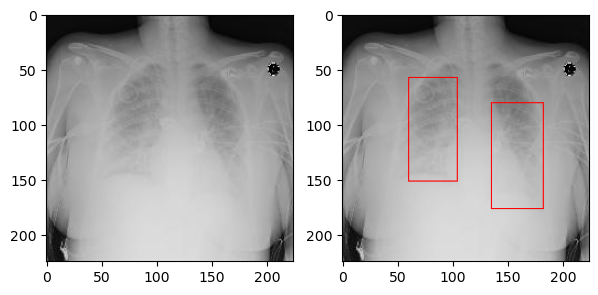

<Figure size 500x500 with 0 Axes>

In [267]:
for i, e in enumerate(os.listdir(train_annotations)):
    if i < 10:
        filename = e.split(".")[0]+".jpeg"
        img = cv2.imread(os.path.join(train_image_path, filename))
        df = pd.read_csv(os.path.join(train_annotations,e), header=None, sep=" ")
        f, axarr = plt.subplots(1,2, figsize=(7,5))
        axarr[0].imshow(img)
        print(os.path.join(train_annotations,e))
        for index, row in df.iterrows():
            x1 = row[0]    # iterate over each row and get
            y1 = row[1]
            x2 = row[0] + row[2]
            y2 = row[1] + row[3]
            print(x1, y1, x2, y2)
            cv2.rectangle(img,(x1,y1),(x2,y2),(255,0,0), 1)
        plt.figure(figsize=(5,5))
        axarr[1].imshow(img)
        break

#### Perform selective search on a particular image

In [268]:
cv2.setUseOptimized(True);
ss_object = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

#### Perform selective search and generate potential ROI for any one image

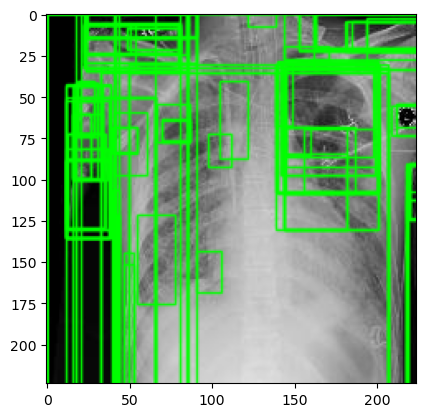

In [269]:
input_image = cv2.imread(os.path.join(train_image_path,"1caa4dac-4bac-419b-91d4-cac2d8408ccd.jpeg"))
ss_object.setBaseImage(input_image)
ss_object.switchToSelectiveSearchFast()  #this method of createSelectiveSearchSegmentation()
rects = ss_object.process()    # The output of the process is a set of a potential ROI’s, depending on the size of the base image
new_input_image = input_image.copy() # create copy of the base image
for i, rect in (enumerate(rects)):
    x, y, w, h = rect
    cv2.rectangle(new_input_image, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
# plt.figure()
plt.imshow(new_input_image)

#### Function to calculate Intersection Over Unioin

In [270]:
def calculate_iou(bb_1, bb_2):
    '''
  Now we are initialising the function to calculate IOU (Intersection Over Union) 
  of the ground truth box from the box computed by selective search.
  To divide the generated ROI’s, for example, we can use a metric called IoU. 
  It’s defined as the intersection area divided by area of the union of a predicted 
  bounding box and ground-truth box.
  '''
  
    assert bb_1['x1'] < bb_1['x2']    # The assert keyword lets you test if a condition in your code returns True, 
    assert bb_1['y1'] < bb_1['y2']    # if not, the program will raise an AssertionError.
    assert bb_2['x1'] < bb_2['x2']
    assert bb_2['y1'] < bb_2['y2']

    x_left = max(bb_1['x1'], bb_2['x1'])
    y_top = max(bb_1['y1'], bb_2['y1'])
    x_right = min(bb_1['x2'], bb_2['x2'])
    y_bottom = min(bb_1['y2'], bb_2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection = (x_right - x_left) * (y_bottom - y_top)

    bb_1_area = (bb_1['x2'] - bb_1['x1']) * (bb_1['y2'] - bb_1['y1'])
    bb_2_area = (bb_2['x2'] - bb_2['x1']) * (bb_2['y2'] - bb_2['y1'])

    iou_value = intersection / float(bb_1_area + bb_2_area - intersection)
    assert iou_value >= 0.0
    assert iou_value <= 1.0
    return iou_value

In [271]:
MAX_REGION_PROPOSALS = 2000

In [272]:
train_data=[]
train_labels_data=[]
tPids = []
tBoxTruth = []
tPropRois = []
tIoUs = []

#### Perform selective search to fetch the Positive and Negative ROI and formulate the features and labels for training

In [274]:
exceptFiles = []
maxROIs = 30  # number of positive and negative regions for each image

#iterate over each input image in the directory
for imageNum, imagePath in enumerate(tqdm(os.listdir(train_annotations))):
    try:
        filename = imagePath.split(".")[0] + ".jpeg"
        
        # read image array
        image = cv2.imread(os.path.join(train_image_path, filename))
        
        #read ground truth bounding box coordinates
        df = pd.read_csv(os.path.join(train_annotations, imagePath))
        gtBoxes = []
        for row in df.iterrows():
            x1 = int(row[1][0].split(" ")[0])
            y1 = int(row[1][0].split(" ")[1])
            x2 = x1 + int(row[1][0].split(" ")[2])
            y2 = y1 + int(row[1][0].split(" ")[3])
            gtBoxes.append({"x1": x1, "x2": x2, "y1": y1, "y2": y2})
        
        #selective search over the regions in the image 
        ss_object.setBaseImage(image)
        ss_object.switchToSelectiveSearchFast()
        propsedRects = ss_object.process()

        #make a copy of the image array
        image_new = image.copy()
        
        #initialize minimum number of poistive and negative regions of interest
        minPositiveROIs = 0
        minNegativeROIs = 0
        flag = 0
        foreground_flag = 0
        background_flag = 0
        
        #iterate over proposed region/rectangles
        for regionNum, proposedRect in enumerate(propsedRects):
            if regionNum < MAX_REGION_PROPOSALS and flag == 0:
                
                #iterate over ground truth and find IOU with each proposed rectangles
                for gtBox in gtBoxes:
                    propX, propY, propW, propH = proposedRect
                    iou = calculate_iou(gtBox, {"x1": propX, "x2": propX + propW, "y1": propY, "y2": propY + propH})
                    
                    #check the condition for positive and negative ROIs based on IOU
                    if minPositiveROIs < maxROIs:
                        if iou > 0.50:
                            xobj_img = image_new[propY:propY + propH, propX:propX + propW]
                            resized_image = cv2.resize(xobj_img, (224, 224), interpolation=cv2.INTER_AREA)
                            train_data.append(resized_image)
                            train_labels_data.append(1)
                            tPids.append(filename)
                            tBoxTruth.append(gtBox)
                            tPropRois.append({"x1": propX, "x2": propX + propW, "y1": propY, "y2": propY + propH})
                            tIoUs.append(iou)
                            
                            minPositiveROIs += 1
                    else:
                        foreground_flag = 1
                    if minNegativeROIs < maxROIs:
                        if iou < 0.05:
                            xobj_img = image_new[propY:propY + propH, propX:propX + propW]
                            resized_image = cv2.resize(xobj_img, (224, 224), interpolation=cv2.INTER_AREA)
                            train_data.append(resized_image)
                            train_labels_data.append(0)
                            tPids.append(filename)
                            tBoxTruth.append(gtBox)
                            tPropRois.append({"x1": propX, "x2": propX + propW, "y1": propY, "y2": propY + propH})
                            tIoUs.append(iou)

                            minNegativeROIs += 1
                    else:
                        background_flag = 1
                if foreground_flag == 1 and background_flag == 1:
                    flag = 1
                    
    except Exception as imagePath:
        exceptFiles.append(filename)
        print(imagePath)
        print("error found in " + filename)
        continue

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 6012/6012 [20:37<00:00,  4.86it/s]


**Note**
- Construct dataframe consisting of
    - PatientID
    - Features and label for regions derived using SelectiveSearch strategy
    - Ground truth bounding box coordinates for the original image
    - Bounding box coordinates for the proposed region
    - Intersection over union of proposed region with ground truth bounding box
    - Unique index storing patient imaage ID for each proposed region for future reference

In [299]:
regionProposedDf = pd.DataFrame({
    'PateintID' : tPids,
    'X' : train_data,
    'y' : train_labels_data,
    'gtBox' : tBoxTruth,
    'propBox' : tPropRois,
    'IoU' : tIoUs
})

In [300]:
regionProposedDf['pIndex'] = [str(i) + "_" + pID for i, pID in zip(regionProposedDf.index, regionProposedDf['PateintID'])]

In [301]:
regionProposedDf.head()

,PateintID,X,y,gtBox,propBox,IoU,pIndex
0,ad445bea-e0e4-429f-97ab-11271727984e.jpeg,"[[[161, 161, 161], [161, 161, 161], [161, 161,...",0,"{'x1': 60, 'x2': 104, 'y1': 57, 'y2': 151}","{'x1': 203, 'x2': 224, 'y1': 96, 'y2': 200}",0.0,0_ad445bea-e0e4-429f-97ab-11271727984e.jpeg
1,ad445bea-e0e4-429f-97ab-11271727984e.jpeg,"[[[110, 110, 110], [110, 110, 110], [108, 108,...",0,"{'x1': 60, 'x2': 104, 'y1': 57, 'y2': 151}","{'x1': 134, 'x2': 224, 'y1': 0, 'y2': 98}",0.0,1_ad445bea-e0e4-429f-97ab-11271727984e.jpeg
2,ad445bea-e0e4-429f-97ab-11271727984e.jpeg,"[[[13, 13, 13], [13, 13, 13], [13, 13, 13], [1...",0,"{'x1': 60, 'x2': 104, 'y1': 57, 'y2': 151}","{'x1': 0, 'x2': 88, 'y1': 0, 'y2': 35}",0.0,2_ad445bea-e0e4-429f-97ab-11271727984e.jpeg
3,ad445bea-e0e4-429f-97ab-11271727984e.jpeg,"[[[13, 13, 13], [13, 13, 13], [13, 13, 13], [1...",0,"{'x1': 60, 'x2': 104, 'y1': 57, 'y2': 151}","{'x1': 11, 'x2': 102, 'y1': 0, 'y2': 35}",0.0,3_ad445bea-e0e4-429f-97ab-11271727984e.jpeg
4,ad445bea-e0e4-429f-97ab-11271727984e.jpeg,"[[[7, 7, 7], [7, 7, 7], [7, 7, 7], [9, 9, 9], ...",0,"{'x1': 60, 'x2': 104, 'y1': 57, 'y2': 151}","{'x1': 149, 'x2': 224, 'y1': 0, 'y2': 33}",0.0,4_ad445bea-e0e4-429f-97ab-11271727984e.jpeg


In [302]:
savePickle(regionProposedDf, "pickle_files_models/regionProposedDf_01.pkl")

'pickle_files_models/regionProposedDf_01.pkl'

In [303]:
#loadPickle("pickle_files_models/regionProposedDf_01.pkl")

#### Define the features and the class labels

In [7]:
# define independent and target features
Xp = np.array(regionProposedDf['pIndex'])
y = np.array(regionProposedDf['y'])

In [8]:
featureDf = pd.DataFrame({
    'Xp' : Xp,
    'y' : y
})

In [9]:
Xp.shape, y.shape

((82999,), (82999,))

In [10]:
featureDf

,Xp,y
0,0_ad445bea-e0e4-429f-97ab-11271727984e.jpeg,0
1,1_ad445bea-e0e4-429f-97ab-11271727984e.jpeg,0
2,2_ad445bea-e0e4-429f-97ab-11271727984e.jpeg,0
3,3_ad445bea-e0e4-429f-97ab-11271727984e.jpeg,0
4,4_ad445bea-e0e4-429f-97ab-11271727984e.jpeg,0
...,...,...
82994,82994_5b19f8e2-420c-42a8-82d5-5e1e5d30939b.jpeg,0
82995,82995_5b19f8e2-420c-42a8-82d5-5e1e5d30939b.jpeg,0
82996,82996_5b19f8e2-420c-42a8-82d5-5e1e5d30939b.jpeg,0
82997,82997_5b19f8e2-420c-42a8-82d5-5e1e5d30939b.jpeg,0


In [11]:
from imblearn.under_sampling import RandomUnderSampler
undersample = RandomUnderSampler(sampling_strategy=1/30)

In [13]:
y.shape

(82999,)

In [14]:
x_over, y_over = undersample.fit_resample(np.array(featureDf), list(y))

In [15]:
x_over

array([['9974_ba185597-bb80-4b69-938e-4bff4b87d366.jpeg', 0],
       ['30724_c5a8e91a-2d40-4355-91af-73abf5f0fdf1.jpeg', 0],
       ['56185_bddd048f-116f-467e-803f-fd234c53a61f.jpeg', 0],
       ...,
       ['82966_905a246c-e06d-4060-88f6-98e3b063786e.jpeg', 1],
       ['82967_905a246c-e06d-4060-88f6-98e3b063786e.jpeg', 1],
       ['82968_905a246c-e06d-4060-88f6-98e3b063786e.jpeg', 1]],
      dtype=object)

In [16]:
pd.Series(y_over).value_counts()

0    39420
1     1314
Name: count, dtype: int64

In [17]:
x_over[:, 0]

array(['9974_ba185597-bb80-4b69-938e-4bff4b87d366.jpeg',
       '30724_c5a8e91a-2d40-4355-91af-73abf5f0fdf1.jpeg',
       '56185_bddd048f-116f-467e-803f-fd234c53a61f.jpeg', ...,
       '82966_905a246c-e06d-4060-88f6-98e3b063786e.jpeg',
       '82967_905a246c-e06d-4060-88f6-98e3b063786e.jpeg',
       '82968_905a246c-e06d-4060-88f6-98e3b063786e.jpeg'], dtype=object)

#### Split the data into train and validation

In [18]:
Xp_train, Xp_val , y_train, y_val = train_test_split(x_over[:, 0] , y_over, test_size = 0.20, stratify=y_over)

In [19]:
print(Xp_train.shape, len(y_train), Xp_val.shape, len(y_val))

(32587,) 32587 (8147,) 8147


In [20]:
pd.Series(y_train).value_counts()

0    31536
1     1051
Name: count, dtype: int64

#### Fetch the Pixel array for the train and validation data

In [21]:
X_train = np.array([arr for arr in regionProposedDf.loc[regionProposedDf['pIndex'].isin(Xp_train), 'X']])
X_val = np.array([arr for arr in regionProposedDf.loc[regionProposedDf['pIndex'].isin(Xp_val), 'X']])

In [22]:
print(X_train.shape, np.array(y_train).shape, X_val.shape, np.array(y_val).shape)

(32587, 224, 224, 3) (32587,) (8147, 224, 224, 3) (8147,)


#### Designing the R-CNN model

In [28]:
rcnn_model_vgg16 = VGG16(input_shape=X_train[0].shape,
                   weights='imagenet',
                   include_top=False) #imports the VGG16 model and discards the last 1000 neuron layer.

x = rcnn_model_vgg16.output
x = GlobalAveragePooling2D()(x) # Optional
x = Dense(1024, activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dense(512, activation='relu')(x) #dense layer 2
x = Dense(256, activation='relu')(x) #dense layer 3
#preds = Dense(2, activation='softmax')(x) #final layer 
preds = Dense(1, activation='sigmoid')(x) #final layer

rcnn_model = Model(inputs=rcnn_model_vgg16.input,
                    outputs=preds)

# set the first 20 layers of the network to be non-trainable
for layer in rcnn_model.layers[:20]:
    layer.trainable=False
for layer in rcnn_model.layers[20:]:
    layer.trainable=True

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
rcnn_model.compile(optimizer=optimizer,
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

rcnn_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

#### Using keras callbacks to finetune the model

In [29]:
checkpoints = ModelCheckpoint("rcnn_vgg16_v3.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq="epoch")
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=5, verbose=1, mode='auto')

#### Fit the R-CNN model

In [31]:
history_rcnn = rcnn_model.fit(x=X_train,y=np.array(y_train),batch_size=32, epochs=1,validation_data=(X_val, np.array(y_val)), validation_steps=2,callbacks=[checkpoints,early], verbose=1)

1019/1019 [==============================] - ETA: 0s - loss: 0.1528 - accuracy: 0.9677

2023-07-27 01:17:03.829198: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_accuracy improved from -inf to 0.93750, saving model to rcnn_vgg16_v3.h5
1019/1019 [==============================] - 858s 842ms/step - loss: 0.1528 - accuracy: 0.9677 - val_loss: 0.4764 - val_accuracy: 0.9375


In [34]:
rcnn_model.save("rcnn_model_01")
rcnn_model.save_weights("rcnn_weights_01.h5")

INFO:tensorflow:Assets written to: rcnn_model_01/assets


INFO:tensorflow:Assets written to: rcnn_model_01/assets


In [35]:
loaded_model = load_model('rcnn_model_01')
loaded_model.load_weights("rcnn_weights_01.h5")

In [36]:
history_rcnn.history

{'loss': [0.15283498167991638],
 'accuracy': [0.9677478671073914],
 'val_loss': [0.47640177607536316],
 'val_accuracy': [0.9375]}

#### Evaluate the validation dataset 

In [38]:
loaded_model.evaluate(X_val, np.array(y_val))

2023-07-27 01:21:08.230876: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


255/255 [==============================] - 175s 687ms/step - loss: 0.1853 - accuracy: 0.9677


[0.18529236316680908, 0.9677181839942932]

In [39]:
y_pred_rcnn = loaded_model.predict(X_val)

2023-07-27 01:24:21.038340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


255/255 [==============================] - 188s 738ms/step


#### Threshold to classify as positive/negative regions on val dataset

In [64]:
y_pred_rcnn_cutoff = (y_pred_rcnn > 0.1)

In [65]:
pd.DataFrame(y_pred_rcnn_cutoff).value_counts()

False    7543
True      604
Name: count, dtype: int64

#### Fetch the PatientIds based on the predictions

In [83]:
predict_imgInd=[]
for i in range(0, len(y_pred_rcnn)):
    if (y_pred_rcnn[i] > 0.1):
        predict_imgInd.append(i)

In [84]:
disImg = []
for i in range(0, len(Xp_val)):
    for j in predict_imgInd:
        if i == j:
            disImg.append(Xp_val[i])

In [85]:
len(disImg)

604

#### Perform selective search on the predicted positive class images

In [126]:
def getImagePrediction(imagePath, imageId, save_image_path):
    #save_image_path = "RCNN_dataset/val_predictions/"
    os.makedirs(save_image_path, exist_ok=True)

    pIds = []
    predProb = []
    x1Coords = []
    y1Coords = []
    x2Coords = []
    y2Coords = []
    
    
    count = 0
    z = 0
    for i, e in enumerate([imageId]):
        #print(os.path.join(image_path_test,e))
        img = cv2.imread(os.path.join(imagePath,e))
        #print(img.shape)
        ss_object.setBaseImage(img)
        ss_object.switchToSelectiveSearchFast()
        ssresults = ss_object.process()
        #print(len(ssresults))
        img_new = img.copy()
        count += 1
    
        if count % 100 == 0:
            print(count)
        
        flag = 0
        for i,result in enumerate(ssresults):
            if i < 1000: 
                x,y,w,h = result
                timage = img_new[y:y+h,x:x+w]
                resized_image = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
                timg = np.expand_dims(resized_image, axis=0)
                prediction = loaded_model.predict(timg, verbose=0)
                #print(prediction[0][0])
                if prediction[0][0] > 0.1 and (w*h)>5000:
                    #print(prediction)
                    pIds.append(e)
                    predProb.append(prediction[0][0])
                    #score1.append(prediction[0][1])
                    x1Coords.append(x)
                    y1Coords.append(y)
                    x2Coords.append(x+w)
                    y2Coords.append(y+h)
                    flag = 1
                    print(e)
                    cv2.rectangle(img_new, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
        if flag == 1: 
            plt.imsave(save_image_path + e, img_new)
            print("Image Saved as", save_image_path + e)
            return pd.DataFrame({
                "PateintID" : pIds,
                "x1" : x1Coords,
                "y1" : y1Coords,
                "x2" : x2Coords,
                "y2" : y2Coords,
                "PredProb" : predProb
            })

In [127]:
#valImage = "2411eac7-f0b6-4eb8-82ec-d5f1487bdebf.jpeg"
imagePath = "RCNN_dataset/train/images/"

#### Run region proposal to get bounding boxes for images with positive predictions 

In [129]:
predDfs = []
for valImage in disImg:
    valImage = valImage.split("_")[1]
    predRes = getImagePrediction(imagePath, valImage, save_image_path = "RCNN_dataset/val_predictions/")
    predDfs.append(predRes)

793c8547-aa10-4a67-88eb-0318ff9a6541.jpeg
Image Saved as RCNN_dataset/val_predictions/793c8547-aa10-4a67-88eb-0318ff9a6541.jpeg
b1243623-70de-4b30-884c-775a3edd978e.jpeg
Image Saved as RCNN_dataset/val_predictions/b1243623-70de-4b30-884c-775a3edd978e.jpeg
33df5e75-0b13-4c2b-b217-a0b32e3fc396.jpeg
Image Saved as RCNN_dataset/val_predictions/33df5e75-0b13-4c2b-b217-a0b32e3fc396.jpeg
bb13f699-a024-4946-a481-8d2e91d3cf72.jpeg
Image Saved as RCNN_dataset/val_predictions/bb13f699-a024-4946-a481-8d2e91d3cf72.jpeg
aadc5c44-f71c-4975-8946-d5e8b484441a.jpeg
Image Saved as RCNN_dataset/val_predictions/aadc5c44-f71c-4975-8946-d5e8b484441a.jpeg
01f3abc2-33c7-4ea2-a599-dc49b76fcfae.jpeg
Image Saved as RCNN_dataset/val_predictions/01f3abc2-33c7-4ea2-a599-dc49b76fcfae.jpeg
3251dea8-4f74-4f4b-8f56-167b0213414b.jpeg
Image Saved as RCNN_dataset/val_predictions/3251dea8-4f74-4f4b-8f56-167b0213414b.jpeg
3c92c85a-acb7-49dc-b732-1b6e203e6d7b.jpeg
3c92c85a-acb7-49dc-b732-1b6e203e6d7b.jpeg
Image Saved as RCNN_

#### Summary output of the bounding boxes of the positively predicted regions

In [130]:
predDf = pd.concat(predDfs).reset_index(drop=True)

In [193]:
predDf.head()

,PateintID,x1,y1,x2,y2,PredProb
0,793c8547-aa10-4a67-88eb-0318ff9a6541.jpeg,32,33,91,153,0.112933
1,b1243623-70de-4b30-884c-775a3edd978e.jpeg,109,49,161,159,0.106465
2,33df5e75-0b13-4c2b-b217-a0b32e3fc396.jpeg,33,70,86,175,0.144757
3,bb13f699-a024-4946-a481-8d2e91d3cf72.jpeg,71,18,115,144,0.113862
4,aadc5c44-f71c-4975-8946-d5e8b484441a.jpeg,77,36,137,135,0.121819


#### Function to obtain grouth truth bounding box coordinates for the postive regions to use for IoU calculation

In [132]:
def getGtBox(pId, regionProposedDf):
    pGtBoxes = regionProposedDf.loc[regionProposedDf["PateintID"] == pId, 'gtBox']
    patId = []
    x1 = []
    x2 = []
    y1 = []
    y2 = []
    
    for box in pGtBoxes:
        patId.append(pId)
        #print(box['x1'])
        x1.append(box['x1'])
        y1.append(box['x2'])
        x2.append(box['y1'])
        y2.append(box['y2'])
        
    return pd.DataFrame({
        "PateintID" : pId,
        "gtX1" : x1,
        "gtY1" : x2,
        "gtX2" : y1,
        "gtY2" : y2
    }).drop_duplicates()
    

In [133]:
valGtDf = pd.concat([ getGtBox(pId, regionProposedDf) for pId in predDf['PateintID'].unique()])

#### Dataframe to join the predicted bounding boxes and the ground truth based on the PatientId 

In [134]:
predDfAnnot = pd.merge(predDf, valGtDf, on="PateintID", how="left")

In [135]:
predDfAnnot['IoU'] = ""

In [136]:
for index, row in predDfAnnot.iterrows():
    bb1 = {
        'x1': row['gtX1'], 
        'y1': row['gtY1'], 
        'x2': row['gtX2'], 
        'y2': row['gtY2'], 
    }
    bb2 = {
        'x1': row['x1'], 
        'y1': row['y1'], 
        'x2': row['x2'], 
        'y2': row['y2'], 
    }
    predDfAnnot.loc[predDfAnnot['PateintID'] == row['PateintID'], 'IoU'] = calculate_iou(bb1, bb2)

In [154]:
predDfAnnot['IoU'] = predDfAnnot['IoU'].astype(float)

#### Select representative cases to plot the grouth truth vs predicted bounding boxes

In [167]:
repCases = predDfAnnot[predDfAnnot['IoU']>0.6]

In [194]:
repCases.head()

,PateintID,x1,y1,x2,y2,PredProb,gtX1,gtY1,gtX2,gtY2,IoU
2,33df5e75-0b13-4c2b-b217-a0b32e3fc396.jpeg,33,70,86,175,0.144757,26,43,85,171,0.667769
3,bb13f699-a024-4946-a481-8d2e91d3cf72.jpeg,71,18,115,144,0.113862,62,18,109,147,0.702156
13,ac2f43b0-3e63-47e0-9e50-4ba59b9b747e.jpeg,16,45,80,171,0.117307,21,54,76,173,0.787252
16,1cabab6f-b2b8-4780-b6bf-525f2ad15096.jpeg,54,51,112,191,0.115901,56,85,112,178,0.641379
26,1cabab6f-b2b8-4780-b6bf-525f2ad15096.jpeg,54,51,112,191,0.115901,56,85,112,178,0.641379


### Compare the ground truth Vs predicted boxes on the validation dataset

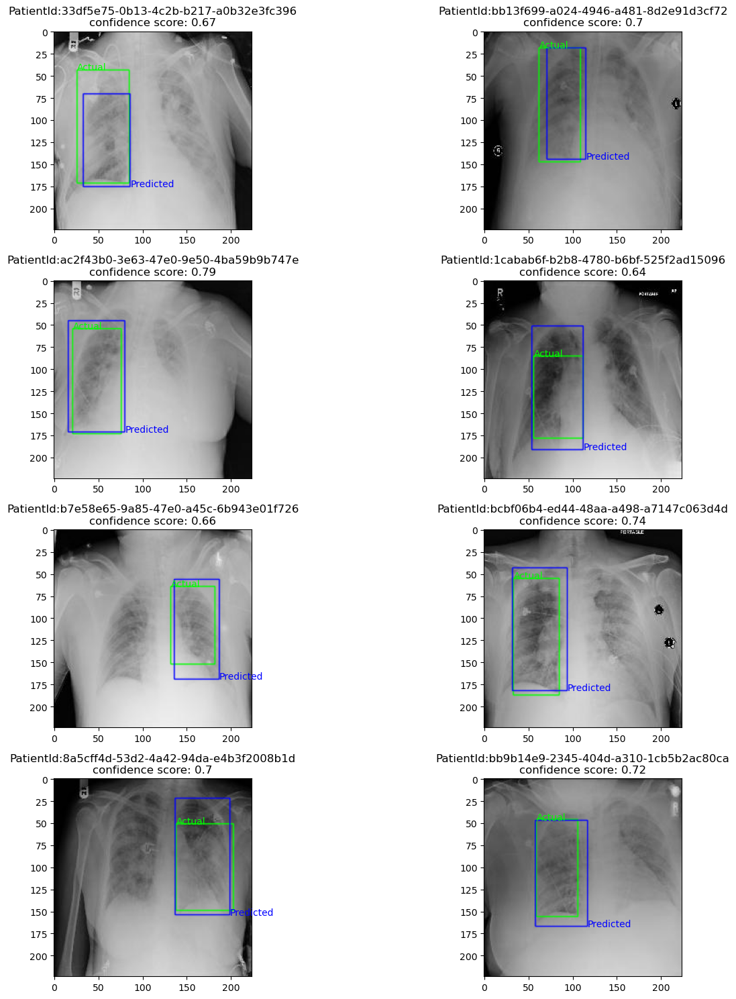

In [192]:
imagePath = "RCNN_dataset/train/images/"
fi,ax = plt.subplots(4,2,figsize=(15,15))
prow = 0
pcol = 0
count = 0
for case in repCases['PateintID'].unique():
    patient = case.replace(".jpeg", "")
    imagefn = os.path.join(imagePath, case)
    imgArray = cv2.imread(imagefn)
    img_new = imgArray.copy()
    for index, row in repCases[repCases['PateintID'] == case].drop_duplicates().iterrows():
        cv2.rectangle(img_new, (row['gtX1'], row['gtY1']), (row['gtX2'], row['gtY2']), (0, 255, 0), 1, cv2.LINE_AA)
        cv2.rectangle(img_new, (row['x1'], row['y1']), (row['x2'], row['y2']), (0, 0, 255), 1, cv2.LINE_AA)
    #print(row, col)
    ax[prow][pcol].imshow(img_new)
    ax[prow][pcol].title.set_text(f"PatientId:{patient}\nconfidence score: {round(row['IoU'], 2)}")
    ax[prow][pcol].text(row['gtX1'], row['gtY1'], "Actual", color="lime")
    ax[prow][pcol].text(row['x2'], row['y2'], "Predicted", color="blue")
    pcol = pcol + 1
    if pcol > 1:
        prow = prow + 1
        pcol = 0
plt.tight_layout()
plt.show()

### Predict bounding box coordinates for the test dataset

In [195]:
test_image_path = "RCNN_dataset/test/images/"

In [199]:
testPredDfs = []
for testImage in os.listdir(test_image_path):
    predRes = getImagePrediction(test_image_path, testImage, save_image_path = "RCNN_dataset/test_predictions/")
    testPredDfs.append(predRes)

1df5a620-00ad-4266-a508-0d29f1e00d04.jpeg
Image Saved as RCNN_dataset/test_predictions/1df5a620-00ad-4266-a508-0d29f1e00d04.jpeg
c00a132f-6108-46e7-a67a-77efd3d2d0ef.jpeg
Image Saved as RCNN_dataset/test_predictions/c00a132f-6108-46e7-a67a-77efd3d2d0ef.jpeg
21f097aa-37d0-4340-a132-85e80880f5d0.jpeg
Image Saved as RCNN_dataset/test_predictions/21f097aa-37d0-4340-a132-85e80880f5d0.jpeg
1cb4057e-ef4b-4bec-af16-29073efee522.jpeg
Image Saved as RCNN_dataset/test_predictions/1cb4057e-ef4b-4bec-af16-29073efee522.jpeg
203b1b72-8b45-469a-b023-3a460f360a34.jpeg
203b1b72-8b45-469a-b023-3a460f360a34.jpeg
Image Saved as RCNN_dataset/test_predictions/203b1b72-8b45-469a-b023-3a460f360a34.jpeg
2d97e7c4-9d6f-4a59-9f1b-31cde03466e0.jpeg
Image Saved as RCNN_dataset/test_predictions/2d97e7c4-9d6f-4a59-9f1b-31cde03466e0.jpeg
28df490a-1851-4c46-ac1a-54ec9617d0d3.jpeg
Image Saved as RCNN_dataset/test_predictions/28df490a-1851-4c46-ac1a-54ec9617d0d3.jpeg
1c232f78-6d19-4eb9-8dac-06ce1dabc638.jpeg
Image Saved a

In [203]:
testPredictions = pd.concat(testPredDfs).reset_index(drop=True)

In [204]:
savePickle(testPredictions, "pickle_files_models/testPredictions.pkl")

'pickle_files_models/testPredictions.pkl'

#### Import sumission file to prepare the submission of results for test data set prediction using R-CNN

In [207]:
test_data_sub = pd.read_csv("stage_2_sample_submission.csv")

In [208]:
testPredictions['w'] = testPredictions['x2'] - testPredictions['x1']
testPredictions['h'] = testPredictions['y2'] - testPredictions['y1']

In [212]:
testPredictions['PateintID'] = [pid.replace(".jpeg", "") for pid in testPredictions['PateintID']]

In [213]:
testPredictions.head()

,PateintID,x1,y1,x2,y2,PredProb,w,h
0,1df5a620-00ad-4266-a508-0d29f1e00d04,34,43,95,157,0.105997,61,114
1,c00a132f-6108-46e7-a67a-77efd3d2d0ef,107,37,157,145,0.120320,50,108
2,21f097aa-37d0-4340-a132-85e80880f5d0,113,34,163,141,0.106672,50,107
3,1cb4057e-ef4b-4bec-af16-29073efee522,131,54,181,161,0.132697,50,107
4,203b1b72-8b45-469a-b023-3a460f360a34,130,50,190,168,0.121970,60,118


### Prepare submission file

In [222]:
def getPredictionString(patientId, predDf):
    subDf = predDf[predDf['PateintID'] == patientId]
    predString = ""
    if len(subDf) == 0:
        return predString
    elif len(subDf) > 0:
        for index, row in subDf.drop_duplicates().iterrows():
            predString += f"{round(row['PredProb'], 3)} {row['x1']} {row['y1']} {row['w']} {row['h']} "
        return predString

In [207]:
test_data_sub = pd.read_csv("stage_2_sample_submission.csv")

In [225]:
test_data_sub['PredictionString'] = [getPredictionString(pid, testPredictions) for pid in test_data_sub['patientId']]

**Note**
- The bounding box coordinates in the `PredictionString` column are as per the resized image pixel values i.e. (224, 224) and `not` based on the `original pixel` size.

#### Randomly display few of the positive test predictions

In [239]:
test_data_sub[test_data_sub['patientId'].isin(testPredictions['PateintID'].unique())].sample(10, random_state=31)

,patientId,PredictionString
1764,23120326-96df-49d6-95e8-c9b0df966965,0.106 50 20 65 125 0.101 135 39 64 107
962,13ece116-aee5-48ab-abce-71b194f1a5cc,0.144 39 33 62 142 0.112 41 57 58 101
439,0d5eccb8-befa-400a-b2ec-3bfee6004787,0.135 0 199 220 25
1198,1b6095ed-ff63-4aad-92b4-9a9260678ac1,0.128 122 54 64 101 0.127 32 63 72 87
518,0e9709fd-a769-4d60-8a06-29a41c7c8297,0.106 109 51 55 113
2063,26ff7bee-7cc6-43d7-936c-ce3f27cb167d,0.116 30 54 68 143
2812,30e28d63-56f1-46c9-8cd5-42f821342cf1,0.123 122 38 46 130
278,03f24805-e3c3-4943-ba67-a9bcb43a2533,0.126 32 33 57 131
738,1177af10-f84a-4574-bf9f-36475010807a,0.111 23 26 74 115
1173,1b10797b-9f2e-443f-b279-da2c1d7c5801,0.122 130 51 59 133


#### Randomly display few of the negative test predictions

In [240]:
test_data_sub.sample(10, random_state=31)

,patientId,PredictionString
1557,20163ab5-99f3-4bc9-b13e-2d8910370eaf,
602,0fb8908c-5485-472a-bffc-08a7f42c18ca,
1455,1f0d63fb-3a49-4068-8330-c446f1db22eb,0.101 51 48 62 95
1583,20770b3a-be8b-47a8-beb0-9254fab636c5,
730,116d7d17-9c3c-4e2a-99ab-cf3ac9d223d5,0.103 41 69 56 130
347,04bcc451-d63c-4845-a1d9-68539a4b4f3e,
2129,27f321f6-9d3b-48da-84aa-02174c664582,
1696,21fbfc34-e070-41fe-acad-cf3b520237f4,
2117,27c99065-7882-4b2c-a856-23d027a96559,
634,10182b23-2bc4-4b89-9cf0-b1338504de35,0.115 140 49 57 125


#### Save the test results pickle file 

In [241]:
savePickle(test_data_sub, "pickle_files_models/test_data_sub.pkl")

'pickle_files_models/test_data_sub.pkl'

#### Save the test prediction results in .csv file

In [315]:
testDf = pd.DataFrame(test_data_sub, columns=['patientId', 'PredictionString'])
testDf.to_csv(
    "stage_2_sample_submission_predictions.csv", index=False
)

**Observations**
- From a total of 3000 images, bounding boxes were predicted for 390 images.
- The above data frame `test_data_sub` shows the PatientIds along with the PredictionString information which contains the confidence score (i.e IoU), Xmin, Ymin, width, and height respectively.

### Display the test prediction results by masking the area of interest 

In [341]:
def getBoxCoordsList(predString):
    reqVals = []
    for i, val in enumerate(predString.split(" ")):
        if i%5 != 0:
            reqVals.append(int(val))
    return reqVals

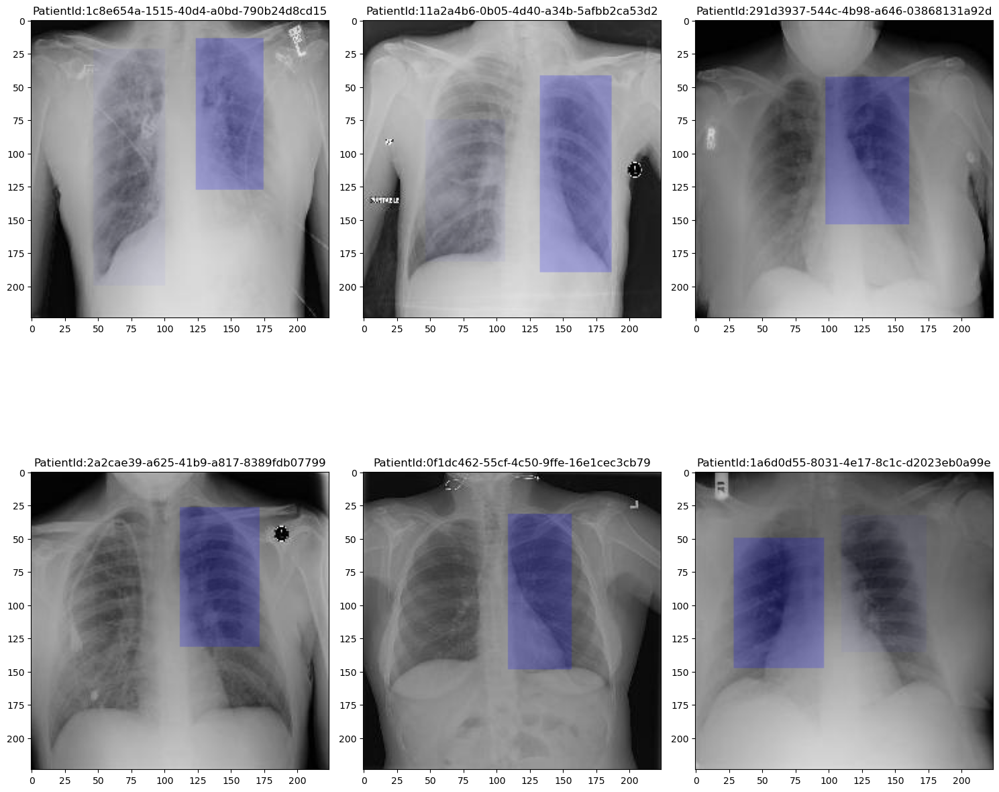

In [366]:
fi,ax = plt.subplots(2,3,figsize=(15,15))
prow = 0
pcol = 0

for index, row in testDf[testDf['PredictionString'] != ""].sample(6, random_state=16).iterrows():
    imgPath = test_image_path + row['patientId'] + ".jpeg"
    imgArray = cv2.imread(imgPath)
    img_new = imgArray.copy()
    reqVals = getBoxCoordsList(row['PredictionString'])
    for i in range(0, len(reqVals), 4):
        x = reqVals[i]
        y = reqVals[i+1]
        x2 = reqVals[i] + reqVals[i+2]
        y2 = reqVals[i+1]+ reqVals[i+3]
        cv2.rectangle(img_new, (x, y), (x2, y2), (0, 0, 255), -1)
        alpha = 0.2 
        img_new = cv2.addWeighted(img_new, alpha, imgArray, 1 - alpha, 0)
    ax[prow][pcol].imshow(img_new)
    ax[prow][pcol].title.set_text(f"PatientId:{row['patientId']}")
    
    pcol = pcol + 1
    if pcol > 2:
        prow = prow + 1
        pcol = 0
plt.tight_layout()
plt.show()

**Observations**
- Overall, the validation region proposals showed an overall accuracy of 96%.
- Out of 8147 validation regions, 7543 regions were predicted negative, and 604 regions were predicted positive with a probability threshold of > 0.1.
- Those positively classified images were considered detected using a selective search algorithm, where we allowed up to 1000 region proposals.
- A confidence score of 0.6 was considered optimal and we identified a total of 78 images that were True positive.
- We have shown the comparison of the predicted vs the ground truth coordinates on the validation data set.
- Similarly, on the 3000 test dataset the above steps were executed and the final results showed a total prediction for 390 images. So overall through RCNN based object detection approach, ~13% of the test images were predicted with the bounding box coordinates which were classified as positive.
- Since region search is an exhaustive greedy process, it is a very slow and compute-intensive step.
- There are other hybrid models of RCNN such as faster RCNN and Mask RCNN which we examined too as part of this study; however, with our infrastructure limitations and version incompatibility issues, we decided to show one of the latest object detection models i.e YOLOv8 in the subsequent section.

## Object Detection using YOLO

#### Convert train DICOM images to jpeg format by segregating them into class Normal and Lung Opacity

In [383]:
outdir_trainImg="yolo_dataset/train/images/"
outdir_valImg="yolo_dataset/val/images/"
outdir_trainlb="yolo_dataset/train/labels/"
outdir_vallb="yolo_dataset/val/labels/"
outdir_testImg="yolo_dataset/test/"

#### Convert train DICOM images to jpeg format for the Lung Opacity class

**Note**
- In the case of running the YOLO architecture we are resizing the images to (128,128)
- The `resizeAndConvertImageToJpeg` created in the above sections was called for generating the images

In [384]:
resizeAndConvertImageToJpeg(X_train_map, "Lung Opacity", outdir_trainImg, size=(128,128), format='jpeg', test=False)

Converted and written 4810 images in yolo_dataset/train/images/


In [385]:
resizeAndConvertImageToJpeg(X_val_map, "Lung Opacity", outdir_valImg, size=(128,128), format='jpeg', test=False)

Converted and written 1202 images in yolo_dataset/val/images/


In [391]:
test_data_sub.head()

,filename,patientId,PredictionString
0,stage_2_test_images/2392af63-9496-4e72-b348-92...,2392af63-9496-4e72-b348-9276432fd797,0.5 0 0 100 100
1,stage_2_test_images/2ce40417-1531-4101-be24-e8...,2ce40417-1531-4101-be24-e85416c812cc,0.5 0 0 100 100
2,stage_2_test_images/2bc0fd91-931a-446f-becb-7a...,2bc0fd91-931a-446f-becb-7a6d3f2a7678,0.5 0 0 100 100
3,stage_2_test_images/29d42f45-5046-4112-87fa-18...,29d42f45-5046-4112-87fa-18ea6ea97e75,0.5 0 0 100 100
4,stage_2_test_images/208e3daf-18cb-4bf7-8325-0a...,208e3daf-18cb-4bf7-8325-0acf318ed62c,0.5 0 0 100 100


In [392]:
resizeAndConvertImageToJpeg(test_data_sub, "NA", outdir_testImg, size=(128,128), format='jpeg', test=True)

Converted and written 3000 images in yolo_dataset/test/


#### Convert train/val images having bounding boxes to YOLO format by creating its corresponding labels.txt file

In [393]:
def createYoloAnnotations(df, outdir):
    os.makedirs(outdir)
    for i in df.index:
        if (df['class'][i]=="Lung Opacity"):
            for j in df['bounding_box'][i]:
                voc_bbox = (j['x'],j['y'],j['width'],j['height'])
                coords = pbx.convert_bbox(voc_bbox, from_type="coco", to_type="yolo", image_size=(1024, 1024))
                pre_nor = [0]+list(coords)
                normalized_cords = " ".join(map(str,pre_nor))
                file_path =outdir+df['patientId'][i]+".txt"
                if(os.path.isfile(file_path)):
                    f = open(file_path, "a")
                    f.write(normalized_cords + "\n")
                else:
                    f = open(file_path, "w")
                    f.write(normalized_cords +"\n")
    print(f"annotation files created for {len(os.listdir(outdir))}")

In [394]:
createYoloAnnotations(X_train_map, outdir_trainlb)

annotation files created for 4810


In [395]:
createYoloAnnotations(X_val_map, outdir_vallb)

annotation files created for 1202


### Load a custom yaml file with pre-trained weights

In [396]:
model1 = YOLO('/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/yolov8.yaml').load('/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/yolov8n.pt')

WARNING ⚠️ no model scale passed. Assuming scale='n'.

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295

### Train the model with the required parameters

In [397]:
model1.train(data='/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/data.yaml', epochs=1, imgsz=128, project = "yolo_project", name="runs", optimizer="Adam")

New https://pypi.org/project/ultralytics/8.0.145 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.0 CPU
yolo/engine/trainer: task=detect, mode=train, model=/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/yolov8.yaml, data=/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/data.yaml, epochs=1, patience=50, batch=16, imgsz=128, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolo_project, name=runs, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, sho

### Load the best model for prediction on validation dataset

In [398]:
# Load the best model
model1 = YOLO('/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/yolo_project/runs/weights/best.pt')

In [399]:
metrics = model1.val()

Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.0 CPU
YOLOv8 summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/yolo_dataset/val/labe
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:21<00:00,  3.49it/s]
                   all       1202       1902      0.126      0.258      0.074      0.017
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/val


### Run predictions on the test dataset

In [400]:
source = '/Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/chest_dataset/test/*.jpeg'

In [401]:
yolo_results = model1(source)



    WARNING ⚠️ stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

image 1/3000 /Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/chest_dataset/test/0000a175-0e68-4ca4-b1af-167204a7e0bc.jpeg: 128x128 (no detections), 516.8ms
image 2/3000 /Users/abhi/Documents/Great_Learnings/13_Capstone_Projects/CV_Projects/CV_Pneumonia_project/CV_Dataset_Pneumonia/chest_dataset/test/0005d3cc-3c3f-40b9-93c3-46231c3eb813.jpeg: 128x128 (no detections), 451.0ms
image 3/3000 /Use

### Store the bounding box coordinates and confidence score in a dataframe 

In [402]:
import os

imageId = []
x = []
y = []
w = []
h = []

x1 = []
y1 = []
x2 = []
y2 = []

conf = []
target = []

for result in yolo_results:
    if len(result.boxes.data) > 0:
        fname = os.path.basename(result.path)
        #print(fname)
        boxes = result.boxes.cpu().numpy()
        for box in boxes:
            r = box.xywh[0].astype(int)
            r2 = box.xyxy[0].astype(int)
            #print(r)
            cv2.rectangle(result.orig_img, r[:2], r[2:], (255, 255, 255), 2)
            #print(fname, r, boxes.conf, box.cls)
            imageId.append(fname)
            x.append(r[0])
            y.append(r[1])
            w.append(r[2])
            h.append(r[3])
            
            x1.append(r2[0])
            y1.append(r2[1])
            x2.append(r2[2])
            y2.append(r2[3])
            
            conf.append(box.conf[0])
            target.append(box.cls[0])

In [408]:
results_df = pd.DataFrame({
    'patientId' : imageId ,
    'xmin' : x1,
    'ymin' : y1,
    'width' : w,
    'height': h,
    'confidence': conf
})

In [409]:
results_df.head()

,patientId,xmin,ymin,width,height,confidence
0,0015597f-2d69-4bc7-b642-5b5e01534676.jpeg,29,65,22,17,0.316243
1,0015597f-2d69-4bc7-b642-5b5e01534676.jpeg,77,65,21,21,0.267324
2,003d17f0-bd8a-485c-bc8b-daec33f53efa.jpeg,29,49,23,21,0.310758
3,00632296-ea6d-438e-982d-370b771a6059.jpeg,87,72,20,25,0.282419
4,0066ba32-08b6-4ac9-8d5a-abec69825d53.jpeg,75,41,18,22,0.308420


#### Save the test prediction results in .tsv file

In [410]:
results_df.to_csv("yolo_project_test_predictions.tsv", sep="\t", index=False)

In [416]:
def getPredictionStringYolo(patientId, results_df):
    subDf = results_df[results_df['patientId'] == patientId + ".jpeg"]
    predString = ""
    if len(subDf) == 0:
        return predString
    elif len(subDf) > 0:
        for index, row in subDf.drop_duplicates().iterrows():
            predString += f"{round(row['confidence'], 3)} {row['xmin']} {row['ymin']} {row['width']} {row['height']} "
        return predString

#### Reloading the sample submission file

In [412]:
test_data_sub_yolo = pd.read_csv("stage_2_sample_submission.csv")

In [413]:
test_data_sub_yolo.head()

,patientId,PredictionString
0,0000a175-0e68-4ca4-b1af-167204a7e0bc,0.5 0 0 100 100
1,0005d3cc-3c3f-40b9-93c3-46231c3eb813,0.5 0 0 100 100
2,000686d7-f4fc-448d-97a0-44fa9c5d3aa6,0.5 0 0 100 100
3,000e3a7d-c0ca-4349-bb26-5af2d8993c3d,0.5 0 0 100 100
4,00100a24-854d-423d-a092-edcf6179e061,0.5 0 0 100 100


#### Create dataframe having patientId and PredictionString

In [436]:
test_data_sub_yolo['PredictionString'] = [getPredictionStringYolo(pid, results_df) for pid in test_data_sub_yolo['patientId']]

In [437]:
test_data_sub_yolo.sample(10, random_state=27)

,patientId,PredictionString
1748,22cbd2b2-3229-4e59-93fc-e271f4d4119a,0.316 78 49 22 22
1976,25cff4d1-9a18-41f3-a171-6a1e7087a1d9,0.328 32 57 20 21 0.255 32 50 23 27 0.252 81 7...
2825,3100902c-f278-4730-8edf-1c1d6fc2f491,
1611,20d9afc7-a8aa-414d-9e44-fce8775b0dbb,
404,05aea639-1039-47fa-b497-e071d0f6cb17,
502,0e64b83a-7b7a-4bf2-9787-08cc6ca0c951,
843,12b438e7-689e-4f9a-b4d7-9e95ff3db2f1,
2977,c1b2f938-49b9-4fe6-8251-b6c90622907b,0.305 98 57 19 23
1657,2173269e-6264-44fb-a0f0-9278e7e42c8f,
168,028fad21-f2a0-4778-8ad2-fcee826331d0,


**Note**
- Please note the above bounding box coordinates are in proportion with the resized image size of (128,128)

In [447]:
# Number of positive predicted images
len(test_data_sub_yolo[test_data_sub_yolo['PredictionString']!=""])

280

#### Save the test prediction results (patientId and PredictionString) in .csv file

In [439]:
test_data_sub_yolo.to_csv("yolo_project_test_submission.csv", index=False)

### Mask the area of interest on the test images based on the predicted boxes 

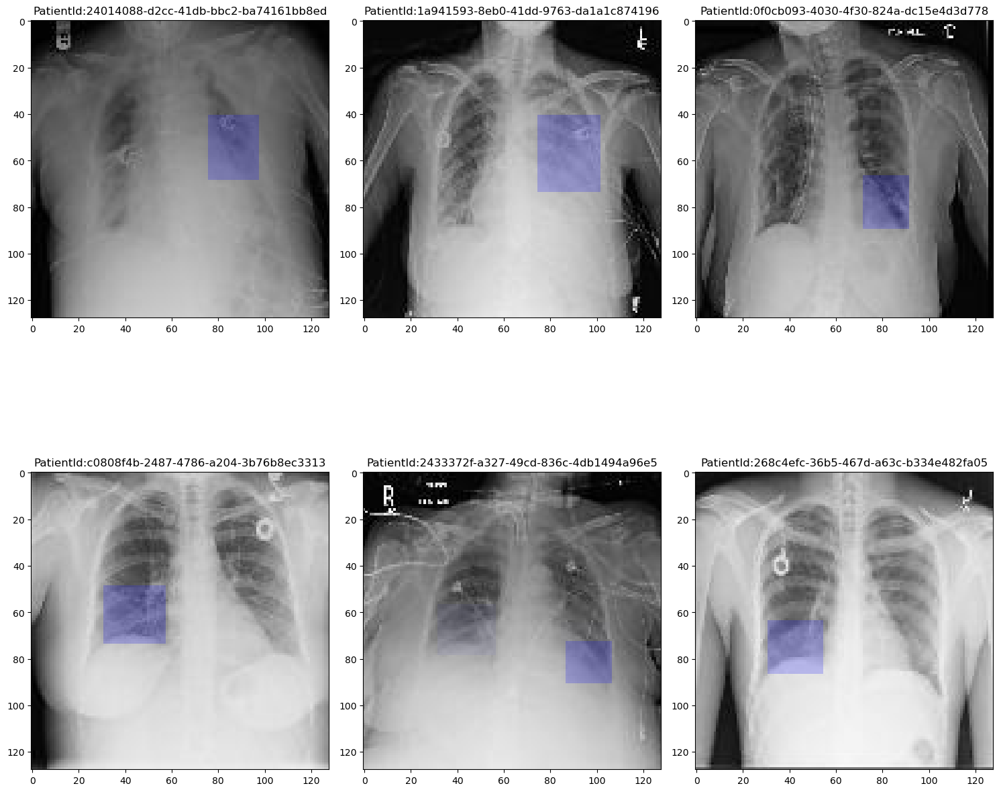

In [441]:
outdir_testImg="yolo_dataset/test/"
fi,ax = plt.subplots(2,3,figsize=(15,15))
prow = 0
pcol = 0

for index, row in test_data_sub_yolo[test_data_sub_yolo['PredictionString'] != ""].sample(6, random_state=16).iterrows():
    imgPath = outdir_testImg + row['patientId'] + ".jpeg"
    imgArray = cv2.imread(imgPath)
    img_new = imgArray.copy()
    reqVals = getBoxCoordsList(row['PredictionString'])
    for i in range(0, len(reqVals), 4):
        x = reqVals[i]
        y = reqVals[i+1]
        x2 = reqVals[i] + reqVals[i+2]
        y2 = reqVals[i+1]+ reqVals[i+3]
        cv2.rectangle(img_new, (x, y), (x2, y2), (0, 0, 255), -1)
        alpha = 0.2 
        img_new = cv2.addWeighted(img_new, alpha, imgArray, 1 - alpha, 0)
    ax[prow][pcol].imshow(img_new)
    ax[prow][pcol].title.set_text(f"PatientId:{row['patientId']}")
    
    pcol = pcol + 1
    if pcol > 2:
        prow = prow + 1
        pcol = 0
plt.tight_layout()
plt.show()

**Observations**
- The model has achieved mean average precision (mAP50) of 0.074 and the mAP50-95 of 0.017 on the validation dataset.
- Based on mAP, the model still needs performance improvement, which can be done using hyper parameter tuning.
- From a total of 3000 test images, the model was able to predict bounding boxes for 280 images. 
- Please note the above bounding box coordinates are in proportion with the resized image size of (128,128)
- It was observed that though the model is faster in training and prediction, there is an issue in the reproducibility of results


### Check the consensus prediction of positive images between R-CNN and YOLO

In [450]:
testDf_rcnn = pd.read_csv("stage_2_sample_submission_predictions.csv")
testDf_yolo = pd.read_csv("yolo_project_test_submission.csv")

In [457]:
rcnnPids = set(testDf_rcnn.loc[~testDf_rcnn['PredictionString'].isna(), 'patientId'])
yoloPids = set(testDf_yolo.loc[~testDf_yolo['PredictionString'].isna(), 'patientId'])

In [461]:
print(f"Number of positive predictions by R-CNN: {len(rcnnPids)}")
print(f"Number of positive predictions by YOLO: {len(yoloPids)}")
print(f"Number of consensus positive predictions between R-CNN and YOLO: {len(rcnnPids.intersection(yoloPids))}")

Number of positive predictions by R-CNN: 390
Number of positive predictions by YOLO: 280
Number of consensus positive predictions between R-CNN and YOLO: 32


#### Observations:

- It can be seen that R-CNN model has predicted relatively higher number (i.e. 390) of positive patients compared to YOLO (280)
- Though YOLO is faster but based on mAP its performance is poor.

## Step 10: Pickle the model for future prediction

### R-CNN

**Note**
- The model was already saved as a pickle file as part of "Step 3" (under the section Fit the R-CNN model)
- We will be reloading the same model and save it again for the purpose of this question

In [331]:
rcnn_model = load_model('rcnn_model_01')
rcnn_model.load_weights("rcnn_weights_01.h5")

#### Confirming the above RCNN model architecture

In [332]:
rcnn_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [333]:
# Re-save the RCNN model as a pickle file
with open('rcnn_model.pkl', 'wb') as f:
    pickle.dump(rcnn_model, f)

INFO:tensorflow:Assets written to: ram://e06780b1-f8a0-45b4-b682-bf704b7be0d8/assets


INFO:tensorflow:Assets written to: ram://e06780b1-f8a0-45b4-b682-bf704b7be0d8/assets


### YOLO

- The weights of trained model are automatically saved as follows,
  `/yolo_project/runs/weights/best.pt`

### Conclusion

- Overall in this project, there were multiple challenges, one of the challenges was to handle the medical images saved in the dicom format rather than the usual JPEG or PNG images.
- We learned how to extract various features from metadata stored as part of dicom images, which helped us to peek into age groups and genders of patients through EDA. 
- Considering the large image sizes of 1024x1024, we had to resize the images down to either 224x224 or 128x128 to suit the configurations of local systems (CPU and memory). This step itself might have led to the loss of information from original image pixels. 
- In order to design the base model for classification we implemented three basic CNN models with varying architectures and class balancing strategies. However, the precision and recall were not optimal for medical applications.
- So, we decided to perform hyperparameter tuning and transfer learning (using VGG16 and ResNet50) approaches. The limited system configurations however did not allow us to run the training for more than 5 epochs or try out various ranges of hyperparameter values. To improve the performance of the model we balanced the data using Normal and Lung opacity classes, which helped to raise the precision, recall, and F1-scores for target class 1.
- The object detection using RCNN was very slow given the time constraints of meeting the submission deadline and trying different possible approaches. The selection of a number of region proposals was a rate-limiting step in the overall approach using RCNN.
- Further factors that contributed to the challenges in the process of RCNN implementation were the choice of classification thresholds, region size, and confidence scores.
-  Hybrids of RCNN such as faster RCNN and Mask RCNN in particular have version and hardware compatibility issues. This led us to the selection of YOLO method, which is a relatively faster method for object detection with a trade-off in accuracy.

We feel that following approaches will help in mitigating some of the challenges mentioned above.
- High end system configurations offered cloud providers will help to overcome the issues of trying out different architectures with various parameters in timely manner.
- Development of pipeline to chain the steps of data set pre-processing, training and testing will speed up the process compared to running individual steps for multiple architectures
- Containerizing the software with required versions and dependencies using Docker or Singularity will solve the version incompatibility and reproducibility issues.
- Usage of advanced architectures such as UNET or hybrid architectures published by researchers for medical images can be implemented to optimize the overall performance.
